<a href="https://colab.research.google.com/github/MariusMC8/Thesis-coding/blob/main/risk_ranking_maps_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas matplotlib

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib

In [3]:
url = "https://gisco-services.ec.europa.eu/distribution/v2/nuts/shp/NUTS_RG_20M_2021_4326.shp.zip"
nuts = gpd.read_file(url)

# Spain only, NUTS-2
regions = nuts[(nuts["CNTR_CODE"] == "ES") & (nuts["LEVL_CODE"] == 2)]

print(regions["NUTS_NAME"].unique())


['Cataluña' 'Comunitat Valenciana' 'Galicia' 'Principado de Asturias'
 'Cantabria' 'País Vasco' 'Comunidad Foral de Navarra' 'La Rioja' 'Aragón'
 'Comunidad de Madrid' 'Castilla y León' 'Castilla-La Mancha'
 'Extremadura' 'Illes Balears' 'Andalucía' 'Región de Murcia'
 'Ciudad de Ceuta' 'Ciudad de Melilla' 'Canarias']


In [4]:
#Save figures
def save_figure(fig, filename, dpi=300):
    """
    Save and download a matplotlib figure in Google Colab
    """
    fig.savefig(filename, dpi=dpi, bbox_inches="tight")
    print(f"Saved: {filename}")
    files.download(filename)

# Data overview

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Data_overview.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Data_overview.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Input data

In [ ]:
print(data.columns.tolist())

['StorageID', 'Coordinates', 'Storage type', 'Region', 'Status', 'Power (MW)', 'Capacity (MWh)', 'Duration (hours)', 'Importance score', 'lat', 'lon']


Rows: 135
Regions: 16
Technologies: ['Battery' 'PHS' 'Flywheel']
Statuses: ['Announced' 'Operational' 'Permitted' 'Under construction']

Missing values:
 Power (MW)        0
Capacity (MWh)    0
dtype: int64


,Spain total
Power (MW),12875.36
Capacity (MWh),82220.47


,Power (MW),Capacity (MWh)
Region,,
Comunitat Valenciana,1938.35,16070.10
Castilla y León,1821.06,14143.90
Cataluña,1657.79,6671.70
Extremadura,1540.01,7760.26
Cantabria,1481.90,10077.90
Andalucía,1023.70,7575.29
Castilla-La Mancha,960.53,3769.26
Galicia,823.25,6641.50
Principado de Asturias,770.43,3593.91


,Region,Storage type,Power (MW),Capacity (MWh)
0,Andalucía,Battery,442.30,1608.89
1,Andalucía,PHS,581.40,5966.40
2,Aragón,Battery,278.00,956.00
3,Aragón,PHS,90.25,885.00
4,Canarias,Battery,61.76,214.49
5,Canarias,Flywheel,2.10,18.00
6,Canarias,PHS,200.00,3500.00
7,Cantabria,Battery,121.10,467.90
8,Cantabria,PHS,1360.80,9610.00
9,Castilla y León,Battery,531.06,1758.90


,Total_MW,Total_MWh,PHS_Power (MW),PHS_Capacity (MWh),Battery_Power (MW),Battery_Capacity (MWh),Flywheel_Power (MW),Flywheel_Capacity (MWh)
Region,,,,,,,,
Comunitat Valenciana,1938.35,16070.10,1516.00,15117.0,422.35,953.10,0.0,0.0
Castilla y León,1821.06,14143.90,1290.00,12385.0,531.06,1758.90,0.0,0.0
Cataluña,1657.79,6671.70,1136.00,4870.0,521.79,1801.70,0.0,0.0
Extremadura,1540.01,7760.26,468.00,4196.0,1072.01,3564.26,0.0,0.0
Cantabria,1481.90,10077.90,1360.80,9610.0,121.10,467.90,0.0,0.0
Andalucía,1023.70,7575.29,581.40,5966.4,442.30,1608.89,0.0,0.0
Castilla-La Mancha,960.53,3769.26,220.00,1760.0,740.53,2009.26,0.0,0.0
Galicia,823.25,6641.50,800.00,6590.0,23.25,51.50,0.0,0.0
Principado de Asturias,770.43,3593.91,123.50,1330.0,646.93,2263.91,0.0,0.0


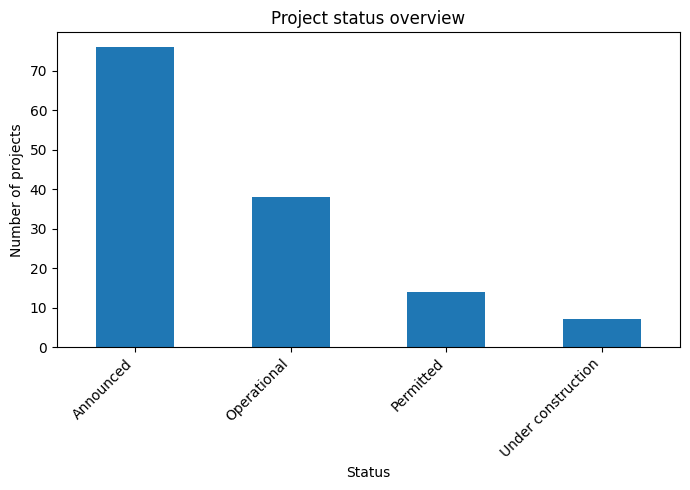


Project status overview
-----------------------


,count
Status,
Announced,76
Operational,38
Permitted,14
Under construction,7


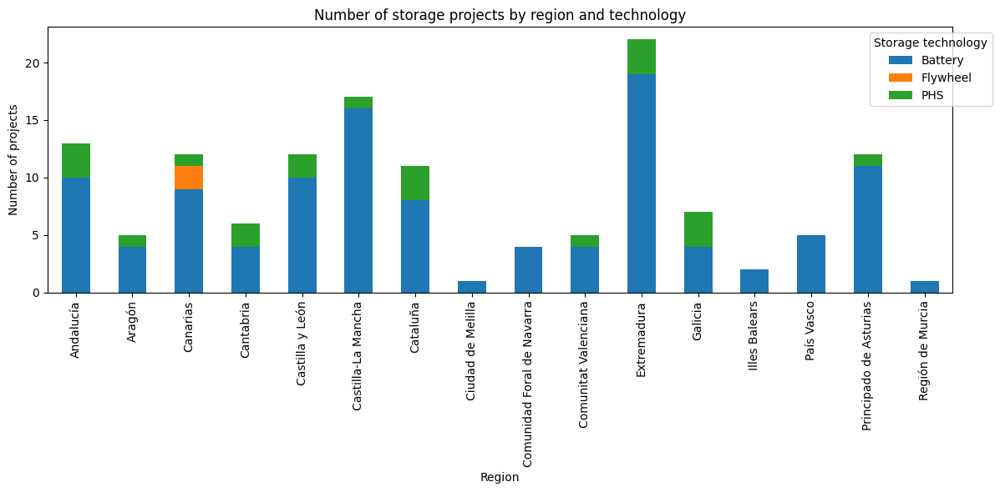


Number of projects by Region and Technology
-------------------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,10,0,3
Aragón,4,0,1
Canarias,9,2,1
Cantabria,4,0,2
Castilla y León,10,0,2
Castilla-La Mancha,16,0,1
Cataluña,8,0,3
Ciudad de Melilla,1,0,0
Comunidad Foral de Navarra,4,0,0


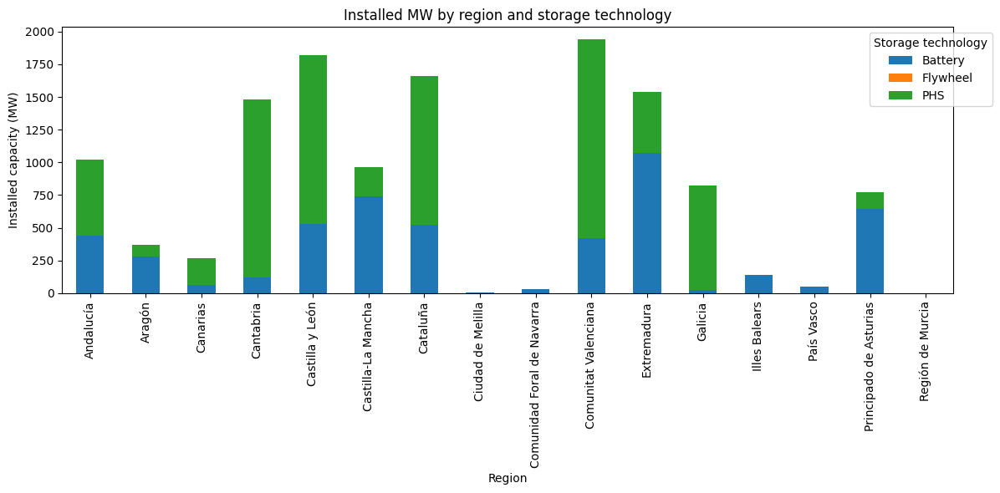


Total MW by Region and Technology
---------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,442.30,0.0,581.40
Aragón,278.00,0.0,90.25
Canarias,61.76,2.1,200.00
Cantabria,121.10,0.0,1360.80
Castilla y León,531.06,0.0,1290.00
Castilla-La Mancha,740.53,0.0,220.00
Cataluña,521.79,0.0,1136.00
Ciudad de Melilla,4.00,0.0,0.00
Comunidad Foral de Navarra,29.92,0.0,0.00


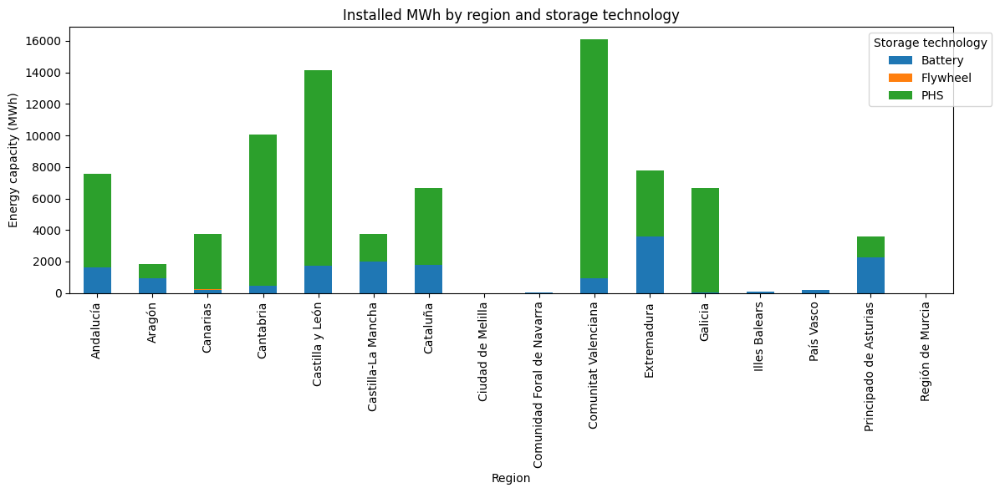


Total MWh by Region and Technology
----------------------------------


Storage type,Battery,Flywheel,PHS
Region,,,
Andalucía,1608.89,0.0,5966.4
Aragón,956.00,0.0,885.0
Canarias,214.49,18.0,3500.0
Cantabria,467.90,0.0,9610.0
Castilla y León,1758.90,0.0,12385.0
Castilla-La Mancha,2009.26,0.0,1760.0
Cataluña,1801.70,0.0,4870.0
Ciudad de Melilla,1.70,0.0,0.0
Comunidad Foral de Navarra,56.08,0.0,0.0


Capacity_group
Planned        97
Operational    38
Name: count, dtype: int64

Operational vs Planned Capacity
-------------------------------


,count
Capacity_group,
Planned,97
Operational,38


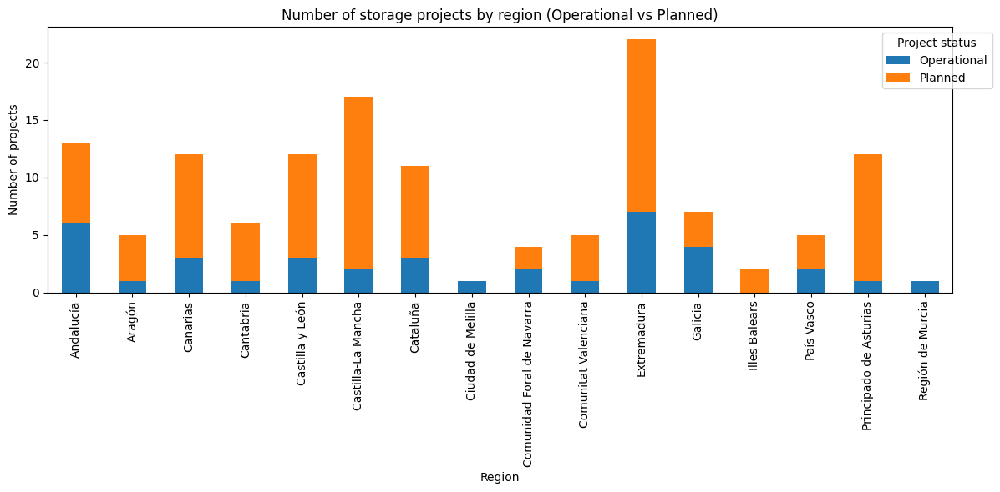


Total projects by Region and Operationability
---------------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,6,7
Aragón,1,4
Canarias,3,9
Cantabria,1,5
Castilla y León,3,9
Castilla-La Mancha,2,15
Cataluña,3,8
Ciudad de Melilla,1,0
Comunidad Foral de Navarra,2,2


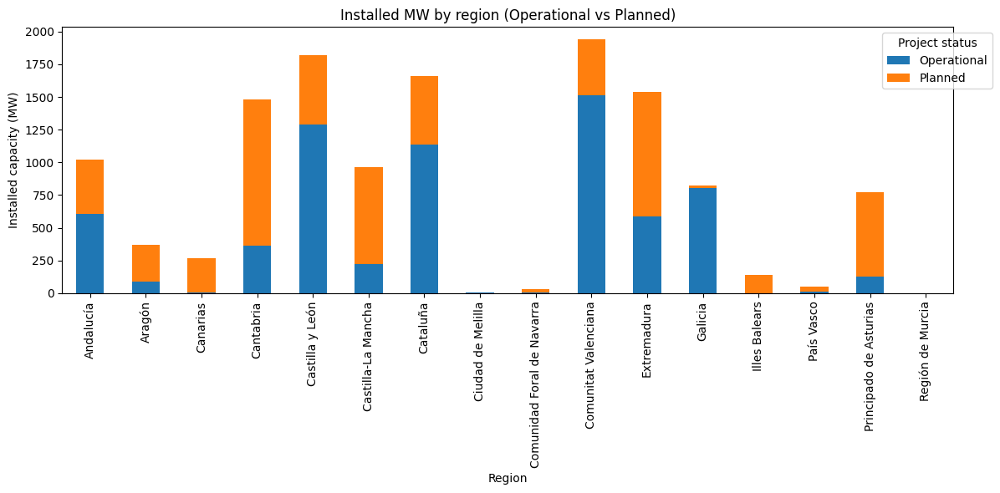


Total MW by Region and Operationability
---------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,603.70,420.00
Aragón,90.25,278.00
Canarias,3.06,260.80
Cantabria,360.80,1121.10
Castilla y León,1290.60,530.46
Castilla-La Mancha,225.00,735.53
Cataluña,1136.00,521.79
Ciudad de Melilla,4.00,0.00
Comunidad Foral de Navarra,2.70,27.22


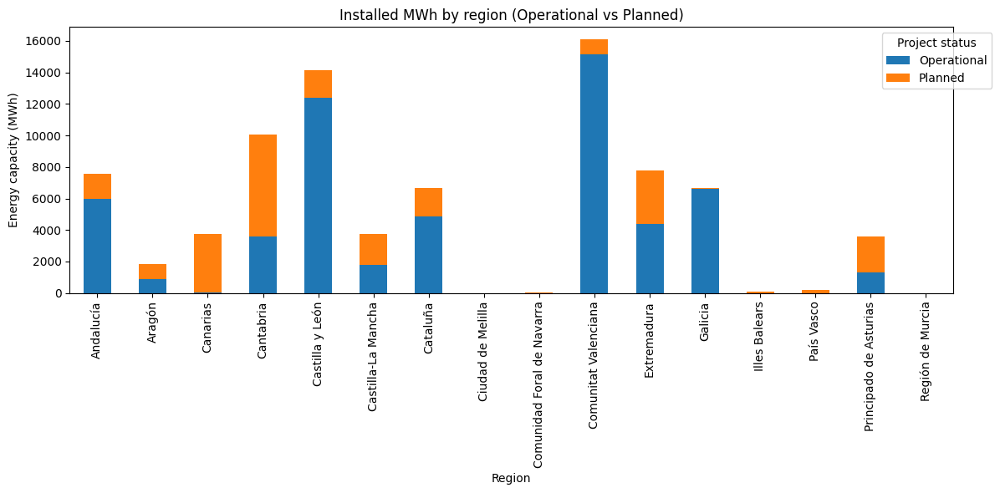


Total MWh by Region and Operationability
----------------------------------------


Capacity_group,Operational,Planned
Region,,
Andalucía,5981.53,1593.76
Aragón,885.00,956.00
Canarias,21.00,3711.49
Cantabria,3610.00,6467.90
Castilla y León,12388.00,1755.90
Castilla-La Mancha,1780.00,1989.26
Cataluña,4870.00,1801.70
Ciudad de Melilla,1.70,0.00
Comunidad Foral de Navarra,1.65,54.43


In [ ]:
# =========================
# CONFIG — adjust if needed
# =========================
REGION_COL = "Region"
TECH_COL   = "Storage type"
STATUS_COL = "Status"
MW_COL     = "Power (MW)"
MWH_COL    = "Capacity (MWh)"

# Ensure MW and MWh are numeric and NaNs become 0
data[MW_COL] = pd.to_numeric(data[MW_COL], errors="coerce").fillna(0)
data[MWH_COL] = pd.to_numeric(data[MWH_COL], errors="coerce").fillna(0)

#Display numeric tables under plots
def show_table(df, title=None, round_cols=None):

    out = df.copy()

    if round_cols:
        for col, n in round_cols.items():
            if col in out.columns:
                out[col] = out[col].round(n)

    if title:
        print("\n" + title)
        print("-" * len(title))

    display(out)


# =========================
# 1. BASIC SANITY CHECK
# =========================
print("Rows:", len(data))
print("Regions:", data[REGION_COL].nunique())
print("Technologies:", data[TECH_COL].unique())
print("Statuses:", data[STATUS_COL].unique())
print("\nMissing values:\n", data[[MW_COL, MWH_COL]].isna().sum())

# =========================
# 2. TOTAL MW & MWh — SPAIN
# =========================
total_spain = data[[MW_COL, MWH_COL]].sum()
display(pd.DataFrame(total_spain, columns=["Spain total"]))

# =========================
# 3. TOTAL MW & MWh — BY REGION
# =========================
region_totals = (
    data
    .groupby(REGION_COL)[[MW_COL, MWH_COL]]
    .sum()
    .sort_values(MW_COL, ascending=False)
)

display(region_totals)


# =========================
# 4. TOTAL MW & MWh — REGION × TECHNOLOGY
# =========================
region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[[MW_COL, MWH_COL]]
    .sum()
    .reset_index()
)

display(region_tech.head(30))

# =========================
# COMBINED TABLE: TOTAL + TECHNOLOGY SPLIT (MW & MWh)
# =========================

# 1. Total MW & MWh by region
region_totals = (
    data
    .groupby(REGION_COL)[[MW_COL, MWH_COL]]
    .sum()
    .rename(columns={
        MW_COL: "Total_MW",
        MWH_COL: "Total_MWh"
    })
)

# 2. MW & MWh by region × technology (pivoted)
region_tech_wide = (
    data
    .groupby([REGION_COL, TECH_COL])[[MW_COL, MWH_COL]]
    .sum()
    .unstack(fill_value=0)
)

# Flatten MultiIndex columns → Battery_MW, Battery_MWh, etc.
region_tech_wide.columns = [
    f"{tech}_{unit}"
    for unit, tech in region_tech_wide.columns
]

# 3. Merge totals + technology split
region_summary = region_totals.join(region_tech_wide)

# 4. Optional: sort by total MW
region_summary = region_summary.sort_values("Total_MW", ascending=False)

# Reorder columns

desired_order = [
    "Total_MW",
    "Total_MWh",
    "PHS_Power (MW)",
    "PHS_Capacity (MWh)",
    "Battery_Power (MW)",
    "Battery_Capacity (MWh)",
    "Flywheel_Power (MW)",
    "Flywheel_Capacity (MWh)",
]

# Keep only columns that actually exist (safe if something is missing)
desired_order = [c for c in desired_order if c in region_summary.columns]

region_summary = region_summary[desired_order]

display(region_summary)


# =========================
# 5. BAR CHART — PROJECT STATUS
# =========================
status_counts = data[STATUS_COL].value_counts()
fig5, ax5 = plt.subplots(figsize=(7,5))
status_counts.plot(kind="bar", ax=ax5)
ax5.set_ylabel("Number of projects")
ax5.set_title("Project status overview")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

show_table(
    status_counts,
    title="Project status overview",
)


# =========================
# 6. BAR CHART — NUMBER OF PROJECTS
#     BY REGION × TECHNOLOGY
# =========================
proj_counts = (
    data
    .groupby([REGION_COL, TECH_COL])
    .size()
    .unstack(fill_value=0)
)

fig6, ax6 = plt.subplots(figsize=(12,6))
proj_counts.plot(
    kind="bar",
    stacked=True,
    ax=ax6
)

ax6.set_ylabel("Number of projects")
ax6.set_title("Number of storage projects by region and technology")
ax6.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    proj_counts,
    title="Number of projects by Region and Technology"
)

# =========================
# 7. BAR CHART — MW BY REGION × TECHNOLOGY
# =========================
mw_region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[MW_COL]
    .sum()
    .unstack(fill_value=0)
)

fig7, ax7 = plt.subplots(figsize=(12,6))
mw_region_tech.plot(
    kind="bar",
    stacked=True,
    ax=ax7
)

ax7.set_ylabel("Installed capacity (MW)")
ax7.set_title("Installed MW by region and storage technology")
ax7.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mw_region_tech,
    title="Total MW by Region and Technology",
)

# =========================
# 8. BAR CHART — MWh BY REGION × TECHNOLOGY
# =========================
mwh_region_tech = (
    data
    .groupby([REGION_COL, TECH_COL])[MWH_COL]
    .sum()
    .unstack(fill_value=0)
)

fig8, ax8 = plt.subplots(figsize=(12,6))
mwh_region_tech.plot(
    kind="bar",
    stacked=True,
    ax=ax8
)

ax8.set_ylabel("Energy capacity (MWh)")
ax8.set_title("Installed MWh by region and storage technology")
ax8.legend(title="Storage technology", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mwh_region_tech,
    title="Total MWh by Region and Technology",
)

# =========================================================
# 9. CREATE OPERATIONAL vs PLANNED CATEGORY
# =========================================================

data = data.copy()

data["Capacity_group"] = data[STATUS_COL].apply(
    lambda x: "Operational" if str(x).lower() == "operational" else "Planned"
)

print(data["Capacity_group"].value_counts())

# Assign Capacity_group dataframe to a variable to be passed into show_table
Capacity_group = data["Capacity_group"].value_counts().to_frame()

show_table(
    Capacity_group,
    title="Operational vs Planned Capacity",
    round_cols={"MW": 1, "MWh": 0}
)

# =========================================================
# 10. NUMBER OF PROJECTS — BY REGION × OPERATIONAL / PLANNED
# =========================================================

proj_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])
    .size()
    .unstack(fill_value=0)
)

fig10, ax10 = plt.subplots(figsize=(12,6))
proj_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax10
)

ax10.set_ylabel("Number of projects")
ax10.set_title("Number of storage projects by region (Operational vs Planned)")
ax10.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    proj_op_plan,
    title="Total projects by Region and Operationability",
)

# =========================================================
# 11. MW — BY REGION × OPERATIONAL / PLANNED
# =========================================================

mw_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])[MW_COL]
    .sum()
    .unstack(fill_value=0)
)

fig11, ax11 = plt.subplots(figsize=(12,6))
mw_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax11
)

ax11.set_ylabel("Installed capacity (MW)")
ax11.set_title("Installed MW by region (Operational vs Planned)")
ax11.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mw_op_plan,
    title="Total MW by Region and Operationability",
)

# =========================================================
# 12. MWh — BY REGION × OPERATIONAL / PLANNED
# =========================================================

mwh_op_plan = (
    data
    .groupby([REGION_COL, "Capacity_group"])[MWH_COL]
    .sum()
    .unstack(fill_value=0)
)

fig12, ax12 = plt.subplots(figsize=(12,6))
mwh_op_plan.plot(
    kind="bar",
    stacked=True,
    ax=ax12
)

ax12.set_ylabel("Energy capacity (MWh)")
ax12.set_title("Installed MWh by region (Operational vs Planned)")
ax12.legend(title="Project status", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

show_table(
    mwh_op_plan,
    title="Total MWh by Region and Operationability",
)

In [ ]:
# =========================
# Downloading graphs
# =========================
def save_figure(fig, filename, dpi=300):
    fig.savefig(filename, dpi=dpi, bbox_inches="tight")
    print(f"Saved: {filename}")
    files.download(filename)

save_figure(fig5, "Project_status_overview.jpg")
save_figure(fig6, "Storage_projects_by_region_and_technology.jpg")
save_figure(fig7, "MW_capacity_by_region_and_technology.jpg")
save_figure(fig8, "MWh_capacity_by_region_and_technology.jpg")
save_figure(fig10, "Storage_projects_by_region_and_status.jpg")
save_figure(fig11, "MW_capacity_by_region_and_status.jpg")
save_figure(fig12, "MWh_capacity_by_region_and_status.jpg")

Saved: Project_status_overview.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Storage_projects_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MW_capacity_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MWh_capacity_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Storage_projects_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MW_capacity_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: MWh_capacity_by_region_and_status.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =============
# Save tables as .jpeg
# ============
def save_table_as_image(
    df,
    filename,
    title=None,
    dpi=300,
    fontsize=10,
    round_decimals=3,
    row_height=0.45,
    col_width=1.4
):
    # Ensure index (Region) is included
    df = df.reset_index()

    # Round numeric columns to avoid overflow
    df = df.copy()
    num_cols = df.select_dtypes(include="number").columns
    df[num_cols] = df[num_cols].round(round_decimals)

    n_rows, n_cols = df.shape

    fig_width = n_cols * col_width
    fig_height = n_rows * row_height + (0.8 if title else 0)

    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    ax.axis("off")

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        loc="center"
    )

    table.auto_set_font_size(False)
    table.set_fontsize(fontsize)
    table.scale(1, 1.3)

    # Style header
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight="bold")
            cell.set_facecolor("#EAEAEA")

    # Adjust column widths explicitly
    for col in range(n_cols):
        table.auto_set_column_width(col)

    if title:
        ax.set_title(title, fontsize=fontsize + 2, pad=10)

    plt.savefig(filename, dpi=dpi, bbox_inches="tight")
    plt.close()

    print(f"Saved: {filename}")
    files.download(filename)

save_table_as_image(
    region_totals,
    filename="Total_MW_MWh_by_region.jpg",
    title="Total Storage Capacity by Region (MW & MWh)",
    fontsize=11
)
save_table_as_image(
    region_tech,
    filename="Total_MW_MWh_by_region_and_technology.jpg",
    title="Total Storage Capacity by Region and Technology (MW & MWh)",
    fontsize=11
)
save_table_as_image(
    region_summary,
    filename="Total_MW_and_MWh_by_region_and_technology.jpg",
    title="Total Storage Capacity by Region and Technology (MW & MWh)",
    fontsize=11
)

Saved: Total_MW_MWh_by_region.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Total_MW_MWh_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Total_MW_and_MWh_by_region_and_technology.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Hot Days above 35C

In [5]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [6]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Hot_days_35C.csv"

os.rename(old_name, new_name)

In [7]:
data = pd.read_csv("Hot_days_35C.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,1720.0,8.00,3


Fixing and cleaning data

In [8]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [9]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [10]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [11]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [12]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [13]:
#Hot days above 35°C 1991-2020 for each region
hot_days_35_present_dict = {
    "Galicia": 0.4,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.02,
    "País Vasco": 0.16,
    "Comunidad Foral de Navarra": 3.59,
    "La Rioja": 2.14,
    "Aragón": 6.82,
    "Cataluña": 2.14,
    "Comunitat Valenciana": 3.04,
    "Región de Murcia": 5.8,
    "Andalucía": 17.13,
    "Castilla-La Mancha": 14.12,
    "Castilla y León": 1.94,
    "Comunidad de Madrid": 11.53,
    "Extremadura": 21.32,
    "Canarias": 0.02,
    "Illes Balears": 0.11,
    "Ciudad de Melilla": 0.0,
    "Ciudad de Melilla": 2.47,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 1991-2020"] = data["Region"].map(hot_days_35_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 5, 15, 30, float("inf")]
labels = [0, 1, 2, 3,]

data['Hot days >35C 1991-2020 hazard strength'] = pd.cut(
    data['Hot days >35C 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [14]:
#Vulnerability score
vulnerability_hot_days_35 = {
    "Battery": 3,
    "PHS": 2,
    "Flywheel": 1
}

data["Vulnerability hot days >35C"] = data["Storage type"].map(vulnerability_hot_days_35)

In [15]:
#Change in number of hot days above 35°C from 1991-2020 to 2011-2040 RCP4.5 for each region
hot_days_35_change45_dict = {
    "Galicia": 0.12,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.04,
    "País Vasco": 0.23,
    "Comunidad Foral de Navarra": 1.55,
    "La Rioja": 1.09,
    "Aragón": 2.71,
    "Cataluña": 0.98,
    "Comunitat Valenciana": 1.57,
    "Región de Murcia": 3.11,
    "Andalucía": 4.65,
    "Castilla-La Mancha": 5.65,
    "Castilla y León": 1.61,
    "Comunidad de Madrid": 4.85,
    "Extremadura": 5.95,
    "Canarias": 0.0,
    "Illes Balears": 0.01,
    "Ciudad de Ceuta": 0.61,
    "Ciudad de Melilla": 1.22,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C change RCP4.5"] = data["Region"].map(hot_days_35_change45_dict)

In [16]:
#Change in number of hot days above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
hot_days_35_change85_dict = {
    "Galicia": 0.11,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.04,
    "País Vasco": 0.25,
    "Comunidad Foral de Navarra": 1.79,
    "La Rioja": 1.31,
    "Aragón": 3.20,
    "Cataluña": 1.10,
    "Comunitat Valenciana": 1.95,
    "Región de Murcia": 3.78,
    "Andalucía": 6.63,
    "Castilla-La Mancha": 7.42,
    "Castilla y León": 2.09,
    "Comunidad de Madrid": 6.5,
    "Extremadura": 8.94,
    "Canarias": 0.0,
    "Illes Balears": 0.15,
    "Ciudad de Ceuta": 0.02,
    "Ciudad de Melilla": 1.29,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C change RCP8.5"] = data["Region"].map(hot_days_35_change85_dict)

In [17]:
#Hot days above 35C 2011-2040 RCP4.5 for each region
hot_days_35_future45_dict = {
    "Galicia": 0.19,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.38,
    "Comunidad Foral de Navarra": 4.83,
    "La Rioja": 2.99,
    "Aragón": 8.94,
    "Cataluña": 2.92,
    "Comunitat Valenciana": 4.31,
    "Región de Murcia": 8.7,
    "Andalucía": 20.73,
    "Castilla-La Mancha": 18.91,
    "Castilla y León": 3.58,
    "Comunidad de Madrid": 16.52,
    "Extremadura": 26.69,
    "Canarias": 0.0,
    "Illes Balears": 0.26,
    "Ciudad de Ceuta": 0.01,
    "Ciudad de Melilla": 3.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP4.5"] = data["Region"].map(hot_days_35_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 5, 15, 30, float("inf")]
labels = [0, 1, 2, 3,]

data["Hot days >35C 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Hot days >35C 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [18]:
#Hot days above 35C 2011-2040 RCP8.5 for each region
hot_days_35_future85_dict = {
    "Galicia": 0.18,
    "Principado de Asturias": 0.0,
    "Cantabria": 0.05,
    "País Vasco": 0.43,
    "Comunidad Foral de Navarra": 5.15,
    "La Rioja": 3.28,
    "Aragón": 9.53,
    "Cataluña": 3.09,
    "Comunitat Valenciana": 4.76,
    "Región de Murcia": 9.26,
    "Andalucía": 22.75,
    "Castilla-La Mancha": 20.78,
    "Castilla y León": 4.13,
    "Comunidad de Madrid": 18.2,
    "Extremadura": 29.83,
    "Canarias": 0.0,
    "Illes Balears": 0.29,
    "Ciudad de Ceuta": 0.02,
    "Ciudad de Melilla": 3.97,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Hot days >35C 2011-2040 RCP8.5"] = data["Region"].map(hot_days_35_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 5, 15, 30, float("inf")]
labels = [0, 1, 2, 3,]

data["Hot days >35C 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Hot days >35C 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [20]:
#Ensure numeric columns
cols_to_numeric = [
    'Hot days >35C 1991-2020 hazard strength',
    'Hot days >35C 2011-2040 hazard strength RCP4.5',
    'Hot days >35C 2011-2040 hazard strength RCP8.5',
    'Vulnerability hot days >35C',
    'Hot days >35C 1991-2020',
    'Hot days >35C 2011-2040 RCP4.5',
    'Hot days >35C 2011-2040 RCP8.5',
    'Hot days >35C change RCP4.5',
    'Hot days >35C change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

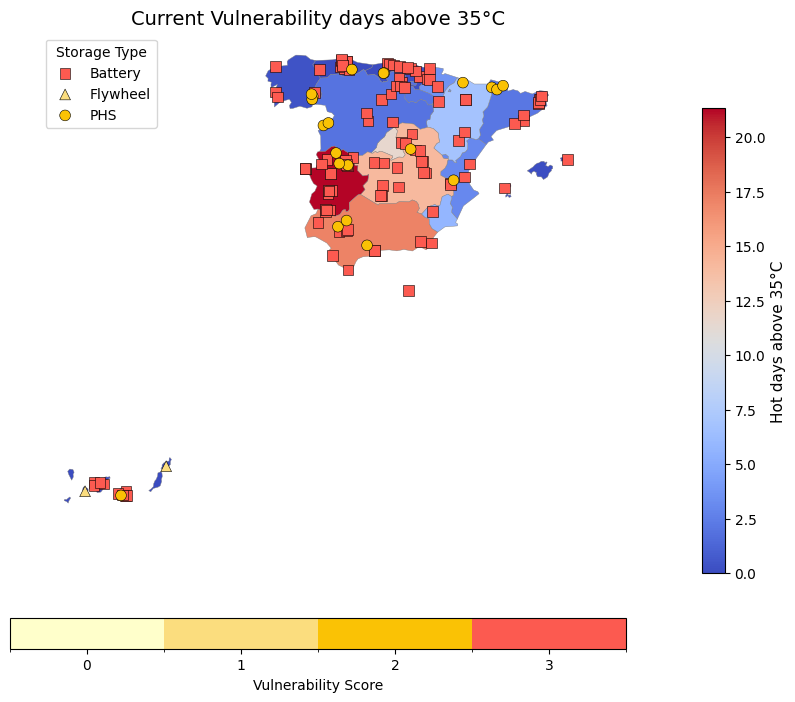

In [22]:
#CURRENT VULNERABILITY

# =========================================================
# Configuration
# =========================================================
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability hot days >35C"
HAZARDCURRENT_COL = "Hot days >35C 1991-2020 hazard strength"
HOTDAYSCURRENT_COL = "Hot days >35C 1991-2020"

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)

# -------------------------------
# Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)

# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("coolwarm")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Hot days above 35°C", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


fig_1, ax_1 = plot_current_optionA(
    bg_col=HOTDAYSCURRENT_COL,
    title="Current Vulnerability days above 35°C"
)



In [ ]:
save_figure(fig_1, "Current Vulnerability days above 35°C.jpg")

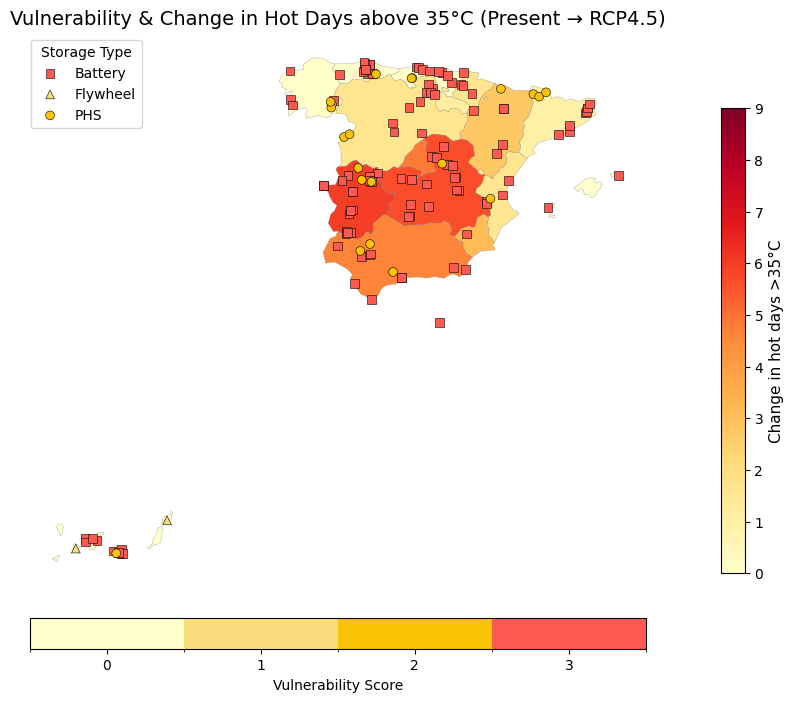

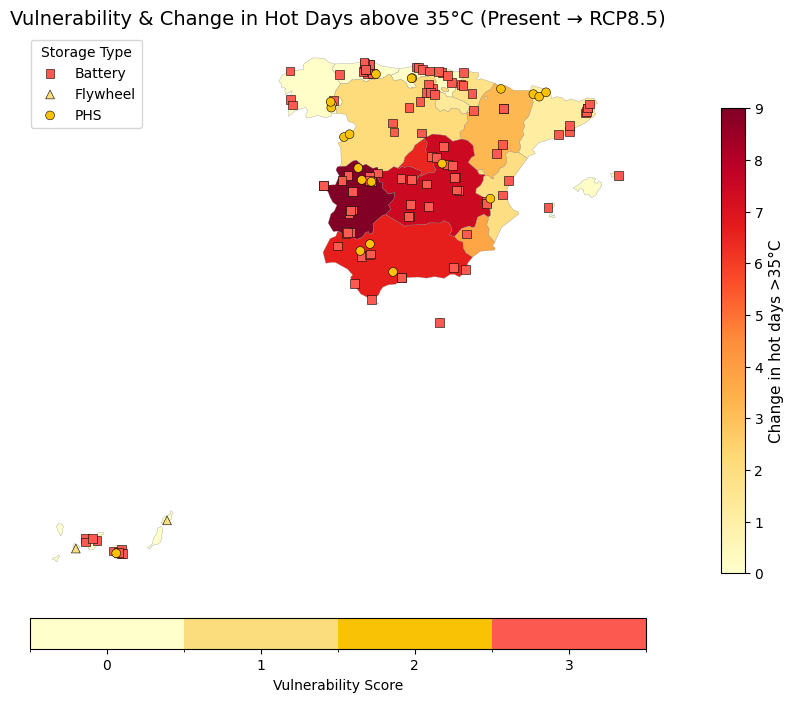

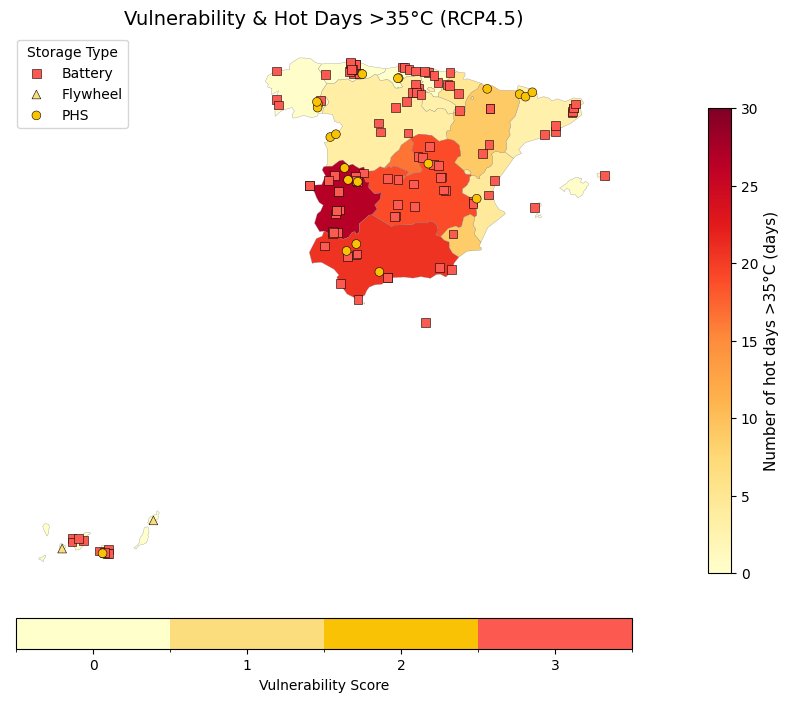

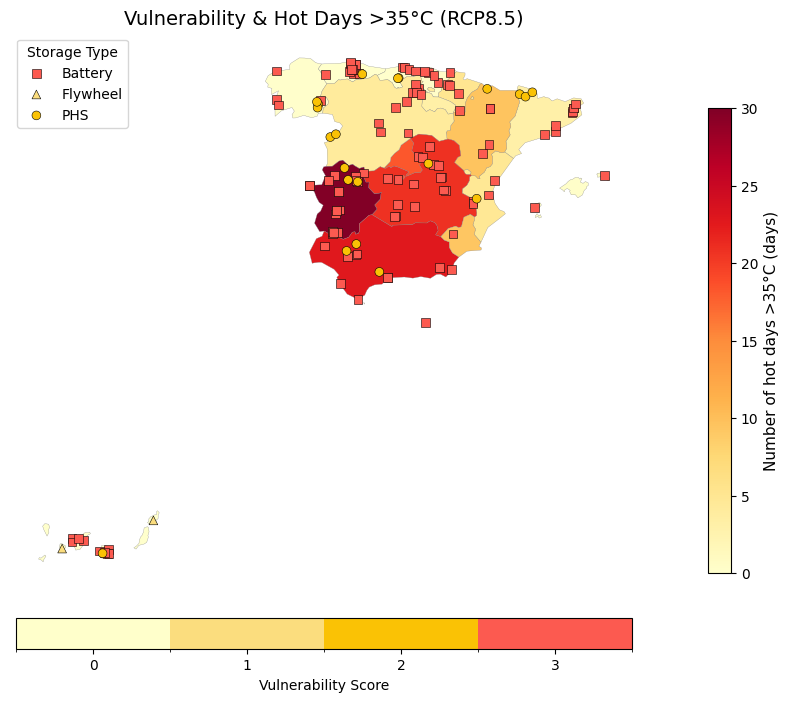

In [26]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability hot days >35C"

HOTDAYS_CHANGE45 = "Hot days >35C change RCP4.5"
HOTDAYS_CHANGE85 = "Hot days >35C change RCP8.5"
HOTDAYS_45 = "Hot days >35C 2011-2040 RCP4.5"
HOTDAYS_85 = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[HOTDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    hot_days_35_change45_dict
)
regions_bg[HOTDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    hot_days_35_change85_dict
)
regions_bg[HOTDAYS_45] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future45_dict
)
regions_bg[HOTDAYS_85] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future85_dict
)


# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for maps
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Background scale logic
    if "change" in bg_col.lower():
      norm_bg = mcolors.Normalize(vmin=0, vmax=9)
      bg_label = "Change in hot days >35°C"
    else:
      norm_bg = mcolors.Normalize(
        vmin=0,
        vmax=30
      )
      bg_label = "Number of hot days >35°C (days)"


    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label(bg_label, fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )
    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# Change in Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm
    )

    return fig, ax


# =========================================================
# GENERATE ALL MAPS
# =========================================================

fig_3, ax_3 = plot_step5_optionA(
    HOTDAYS_CHANGE45,
    "Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5)"
)

fig_4, ax_4 = plot_step5_optionA(
    HOTDAYS_CHANGE85,
    "Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5)"
)
fig_5, ax_5 = plot_step5_optionA(
    HOTDAYS_45,
    "Vulnerability & Hot Days >35°C (RCP4.5)"
)

fig_6, ax_6 = plot_step5_optionA(
    HOTDAYS_85,
    "Vulnerability & Hot Days >35°C (RCP8.5)"
)


In [ ]:
save_figure(fig_3, "Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5).jpg")
save_figure(fig_4, "Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5).jpg")
save_figure(fig_5, "Vulnerability & Hot Days >35°C (RCP4.5).jpg")
save_figure(fig_6, "Vulnerability & Hot Days >35°C (RCP8.5).jpg")

Saved: Vulnerability & Change in Hot Days above 35°C (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in Hot Days above 35°C (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

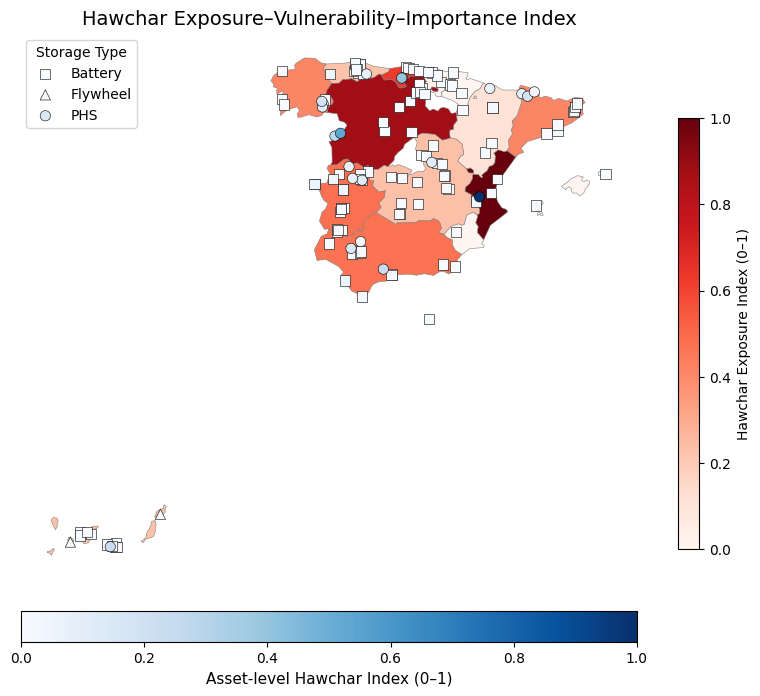

(<Figure size 1000x800 with 3 Axes>,
 <Axes: title={'center': 'Hawchar Exposure–Vulnerability–Importance Index'}>)

In [29]:
# =========================================================
# HAWCHAR EXPOSURE–VULNERABILITY–IMPORTANCE INDEX
# =========================================================

# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ---------------------------------------------------------
# 1. ASSET-LEVEL HAWCHAR INDEX
# ---------------------------------------------------------
# I_a × V_a,th × m_a(g)

data["Hawchar_abs"] = (
    data[IMPORTANCE_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
)

# ---------------------------------------------------------
# 2. REGIONAL AGGREGATION
# ---------------------------------------------------------
region_hawchar = (
    data
    .groupby(REGION_COL)["Hawchar_abs"]
    .sum()
    .reset_index(name="Hawchar_region_abs")
)

# ---------------------------------------------------------
# 3. NORMALISE REGIONAL INDEX (0–1)
# ---------------------------------------------------------
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_hawchar["Hawchar_region_rel"] = normalize(
    region_hawchar["Hawchar_region_abs"]
)

# ---------------------------------------------------------
# 4. MERGE WITH REGIONS GeoDataFrame
# ---------------------------------------------------------
regions_hawchar_gdf = regions.merge(
    region_hawchar,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# ---------------------------------------------------------
# 5. NORMALISE ASSET-LEVEL INDEX (optional, for point maps)
# ---------------------------------------------------------
data["Hawchar_rel"] = normalize(data["Hawchar_abs"])


def plot_hawchar_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL HAWCHAR INDEX ---
    regions_hawchar_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Hawchar Exposure Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL INDEX ---
    vals = data[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset["lon"],
            subset["lat"],
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Hawchar Index (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

plot_hawchar_map(
    region_col="Hawchar_region_rel",
    point_col="Hawchar_rel",
    title="Hawchar Exposure–Vulnerability–Importance Index"
)


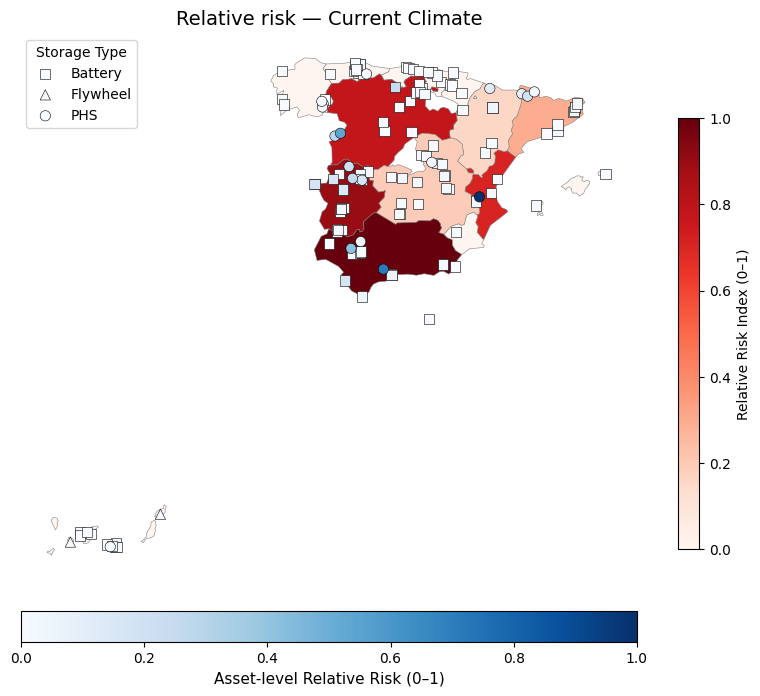

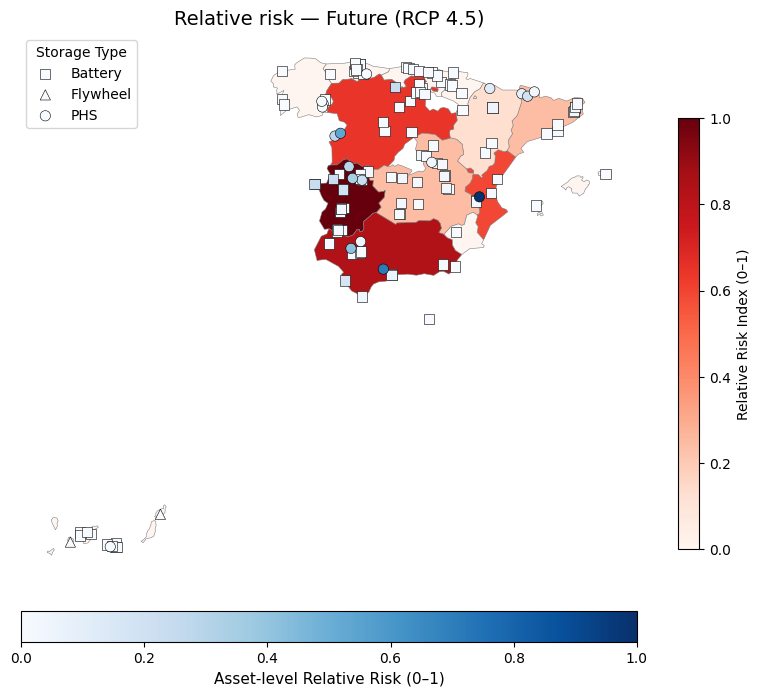

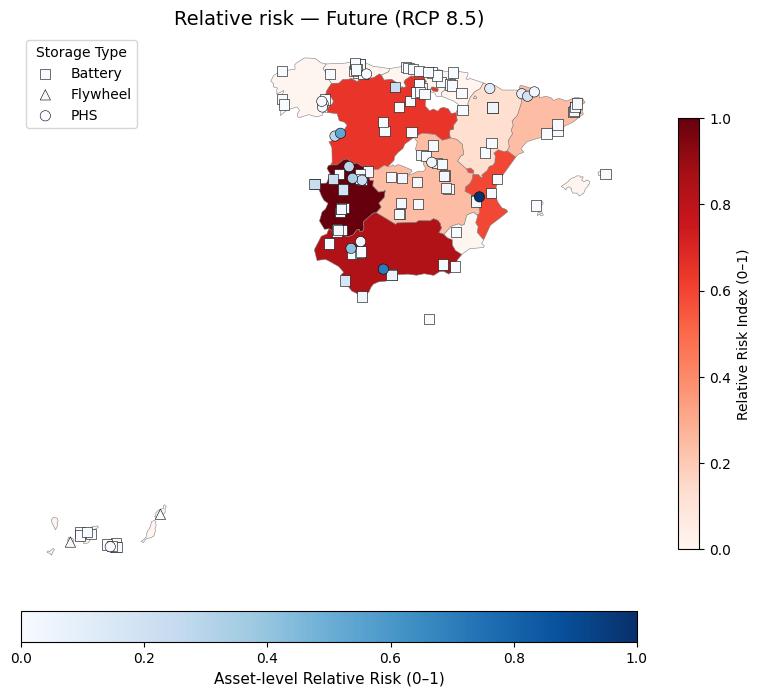

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

HAZARDCURRENT_COL = "Hot days >35C 1991-2020 hazard strength"
HAZARD45_COL     = "Hot days >35C 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Hot days >35C 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 6. MAP FUNCTION
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_7, ax_7 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_8, ax_8 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_9, ax_9 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_7, "Relative risk — Current Climate.jpg")
save_figure(fig_8, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_9, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

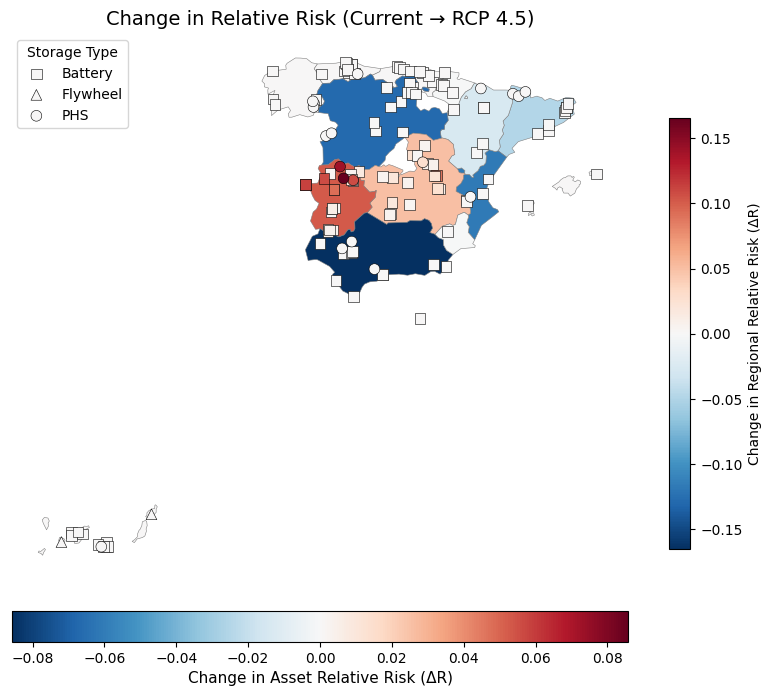

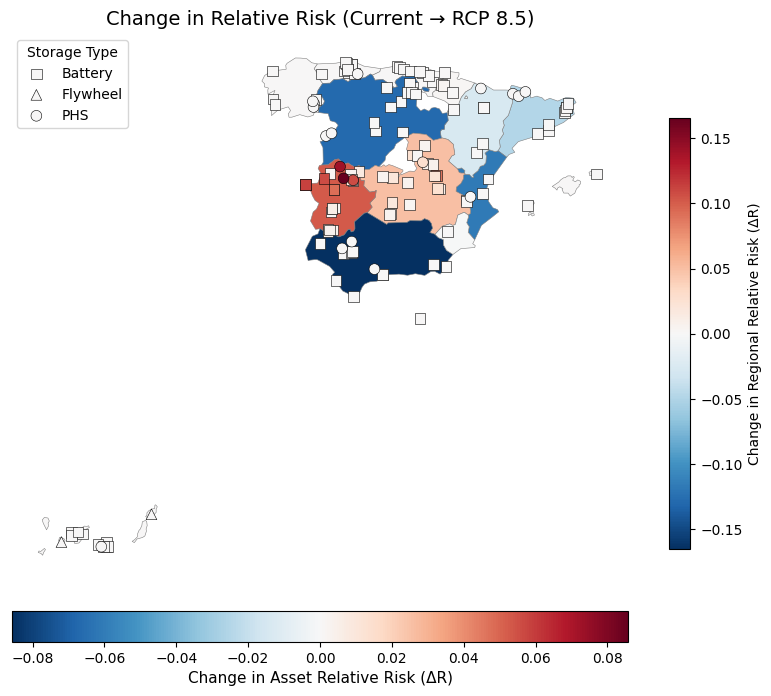

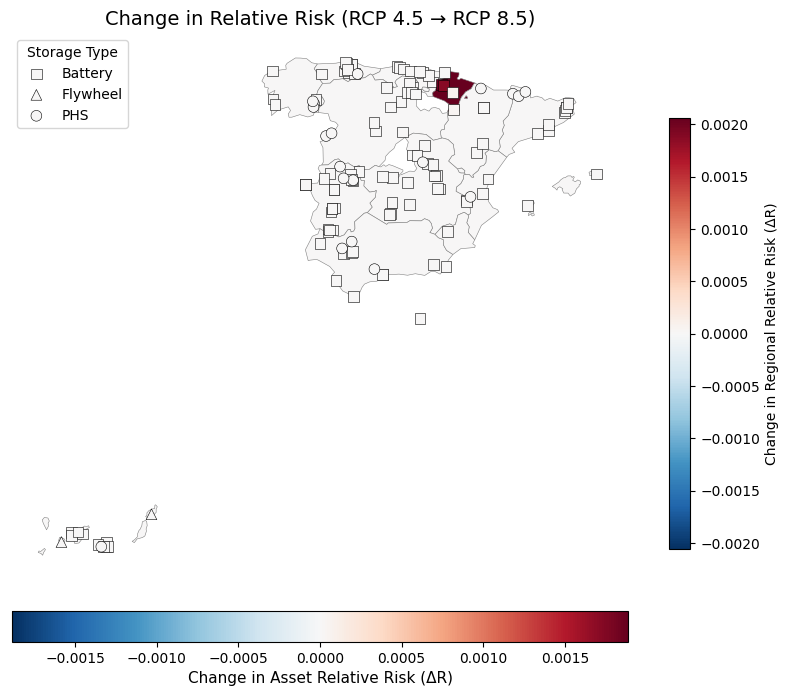

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_10, ax_10 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_11, ax_11 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_12, ax_12 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_10, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_11, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_12, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
)

region_max_asset = (
    data
    .groupby(REGION_COL)["Riskcurrent_rel"]
    .max()
    .reset_index(name="MaxAssetRelRisk")
)

region_risk_table = region_risk_table.merge(
    region_max_asset,
    left_on="NUTS_NAME",
    right_on="Region",
    how="left"
)

region_risk_table = (
    region_risk_table
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table

,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85,Region,MaxAssetRelRisk
0,Andalucía,136355.22,136355.22,136355.22,1.000000,0.834712,0.834712,-0.165288,-0.165288,0.00000,Andalucía,0.714427
1,Extremadura,122517.00,163356.00,163356.00,0.898513,1.000000,1.000000,0.101487,0.101487,0.00000,Extremadura,0.257194
2,Castilla y León,106523.40,106523.40,106523.40,0.781220,0.652094,0.652094,-0.129126,-0.129126,0.00000,Castilla y León,0.535821
3,Comunitat Valenciana,96420.60,96420.60,96420.60,0.707128,0.590248,0.590248,-0.116880,-0.116880,0.00000,Comunitat Valenciana,1.000000
4,Cataluña,40030.20,40030.20,40030.20,0.293573,0.245049,0.245049,-0.048524,-0.048524,0.00000,Cataluña,0.191771
5,Castilla-La Mancha,26620.32,39930.48,39930.48,0.195228,0.244438,0.244438,0.049211,0.049211,0.00000,Castilla-La Mancha,0.092611
6,Aragón,21588.00,21588.00,21588.00,0.158322,0.132153,0.132153,-0.026169,-0.026169,0.00000,Aragón,0.117087
7,Comunidad Foral de Navarra,336.48,336.48,672.96,0.002468,0.002060,0.004120,-0.000408,0.001652,0.00206,Comunidad Foral de Navarra,0.001886
8,Región de Murcia,36.00,36.00,36.00,0.000264,0.000220,0.000220,-0.000044,-0.000044,0.00000,Región de Murcia,0.000397
9,Ciudad de Melilla,10.20,10.20,10.20,0.000075,0.000062,0.000062,-0.000012,-0.000012,0.00000,Ciudad de Melilla,0.000112


/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


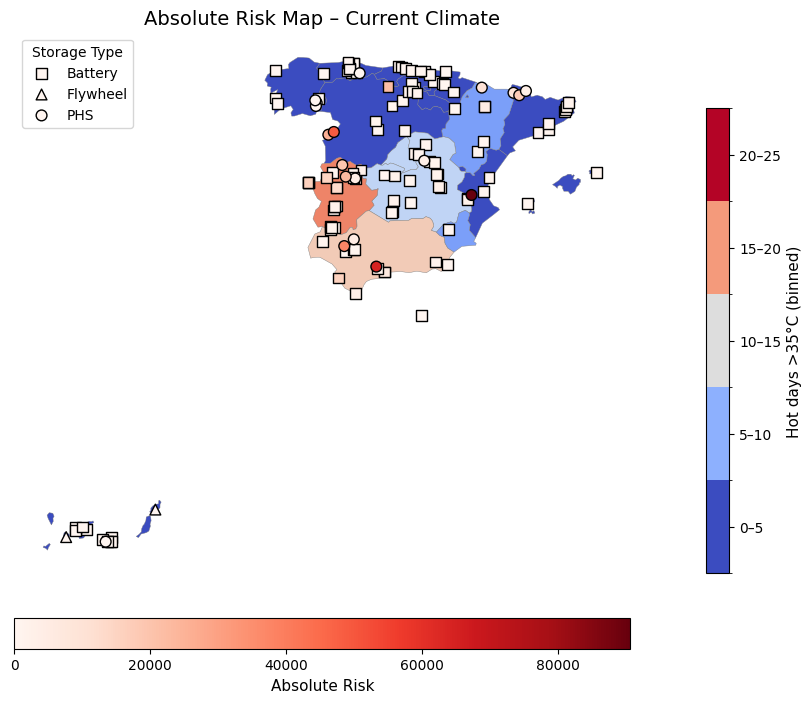

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


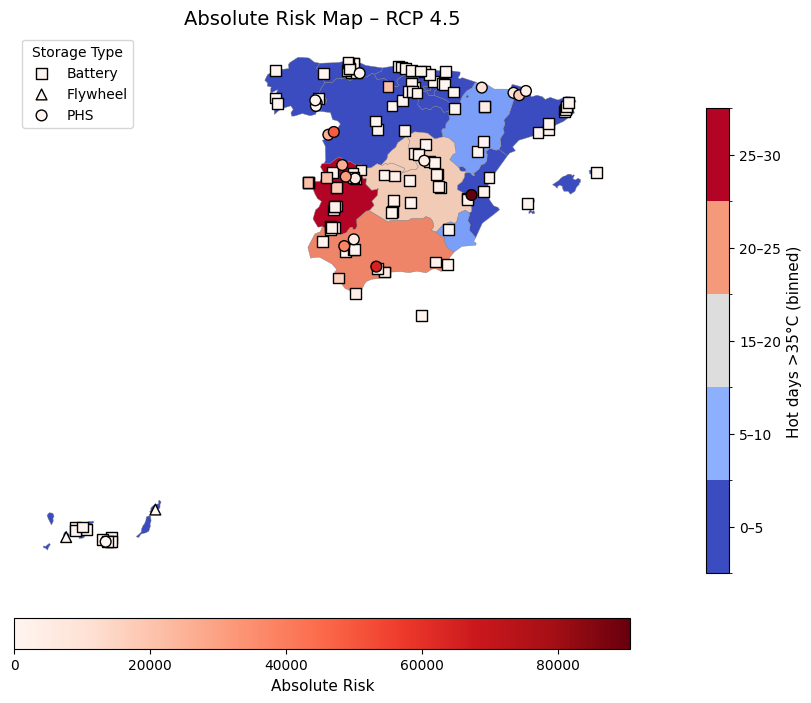

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


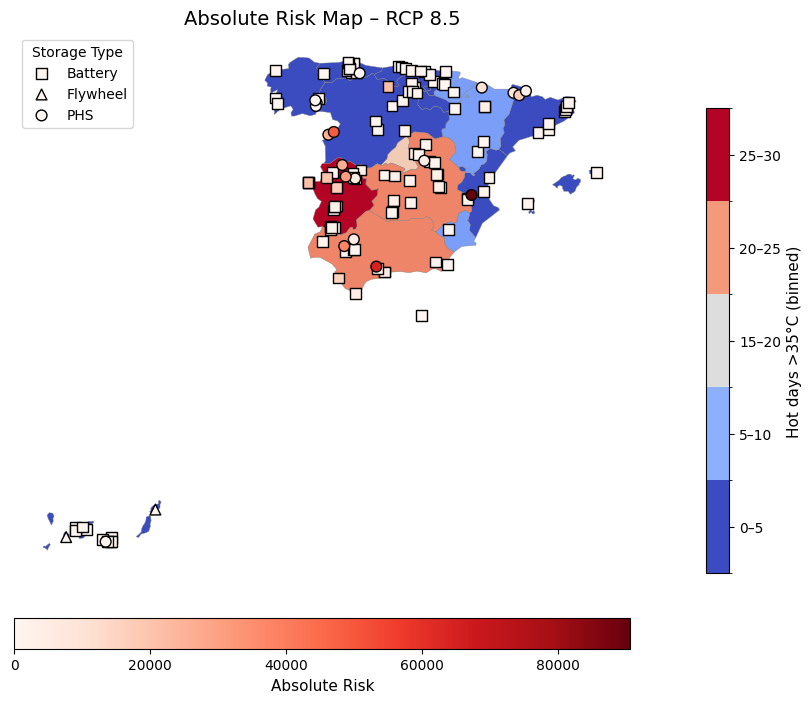

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


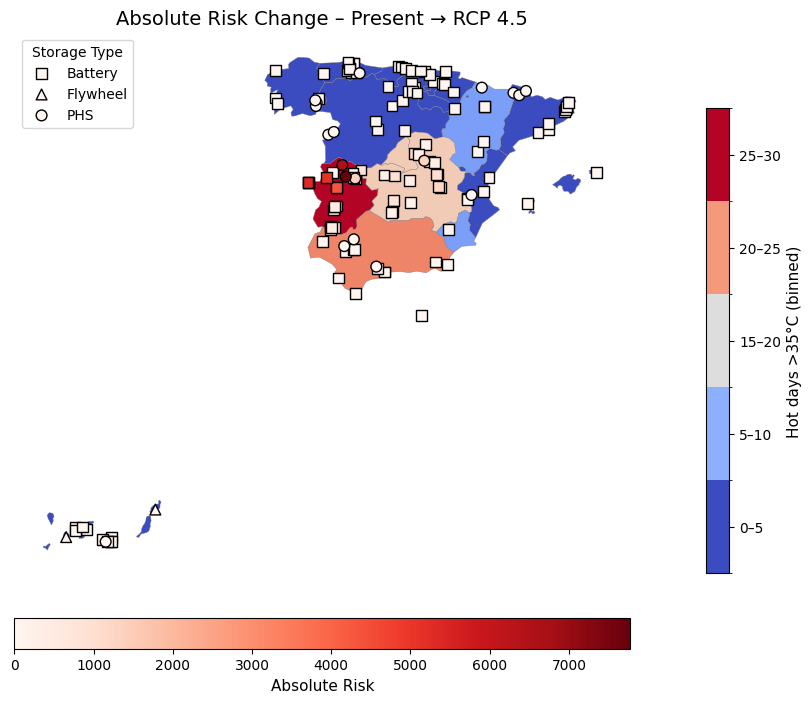

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


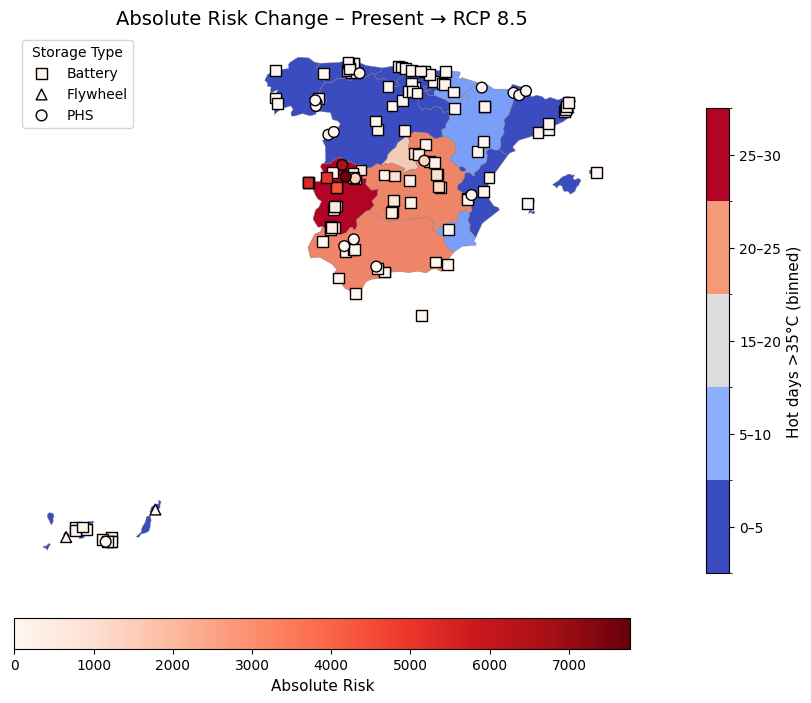

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

HAZ_CUR = "Hot days >35C 1991-2020 hazard strength"
HAZ_45 = "Hot days >35C 2011-2040 hazard strength RCP4.5"
HAZ_85 = "Hot days >35C 2011-2040 hazard strength RCP8.5"

HOT_CUR = "Hot days >35C 1991-2020"
HOT_45 = "Hot days >35C 2011-2040 RCP4.5"
HOT_85 = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 5, 10, 15, 20, 25, 30]
labels = ["0–5", "5–10", "10–15", "15–20", "20–25", "25–30"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)
regions_bg[HOTDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future45_dict
)
regions_bg[HOTDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, HOTDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZ_CUR].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZ_45].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZ_85].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# ============================================
# 5. BINNING HOT DAYS (for consistent background)
# ============================================
def bin_hot_days(df, col):
    bins = [0, 5, 10, 15, 20, 25, 30, np.inf]
    labels = ["0–4", "5–9", "10–14", "15–19", "20–24", "25–29", "30+"]
    df[col + "_binned"] = pd.cut(df[col], bins=bins, labels=labels, right=False)
    return df

for col in [HOT_CUR, HOT_45, HOT_85]:
    data = bin_hot_days(data, col)

# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="coolwarm",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("coolwarm", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Hot days >35°C (binned)", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=HOT_CUR,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Hot days >35C 1991-2020,Hot days >35C 1991-2020 hazard strength,Vulnerability hot days >35C,Hot days >35C change RCP4.5,Hot days >35C change RCP8.5,Hot days >35C 2011-2040 RCP4.5,Hot days >35C 2011-2040 hazard strength RCP4.5,Hot days >35C 2011-2040 RCP8.5,Hot days >35C 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,0.40,0,3,0.12,0.11,0.19,0,0.18,0,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,0.40,0,3,0.12,0.11,0.19,0,0.18,0,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,0.40,0,3,0.12,0.11,0.19,0,0.18,0,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,0.40,0,2,0.12,0.11,0.19,0,0.18,0,0.0,2280.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,0.40,0,2,0.12,0.11,0.19,0,0.18,0,0.0,215.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,0.40,0,2,0.12,0.11,0.19,0,0.18,0,0.0,263.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,0.40,0,3,0.12,0.11,0.19,0,0.18,0,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,0.00,0,3,0.00,0.00,0.00,0,0.00,0,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,0.00,0,3,0.00,0.00,0.00,0,0.00,0,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,0.00,0,3,0.00,0.00,0.00,0,0.00,0,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000


# Frost days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Frost days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Frost days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names and strip whitespace from values as well
data.columns = data.columns.str.strip()
data["Region"] = data["Region"].str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León",
    "PaísVasco": "País Vasco",
    "RegióndeMurcia": "Región de Murcia",
    "CastillayLeón": "Castilla y León",
    "PrincipadodeAsturias": "Principado de Asturias",
    "ComunidadForaldeNavarra": "Comunidad Foral de Navarra",
    "ComunidadValenciana": "Comunitat Valenciana",
    "IllesBaleares": "Illes Balears",
    "CiudaddeMelilla": "Ciudad de Melilla",
    "IslasCanarias": "Canarias",
    "Castilla-LaMancha": "Castilla-La Mancha"
}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Frost days 1991-2020 for each region
frost_days_present_dict = {
    "Galicia": 13.6,
    "Principado de Asturias": 21.41,
    "Cantabria": 19.7,
    "País Vasco": 14.4,
    "Comunidad Foral de Navarra": 27.84,
    "La Rioja": 40.51,
    "Aragón": 47.51,
    "Cataluña": 42.84,
    "Comunitat Valenciana": 14.59,
    "Región de Murcia": 8.83,
    "Andalucía": 9.39,
    "Castilla-La Mancha": 29.95,
    "Castilla y León": 40.87,
    "Comunidad de Madrid": 36.81,
    "Extremadura": 8.99,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 1991-2020"] = data["Region"].map(frost_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data['Frost days 1991-2020 hazard strength'] = pd.cut(
    data['Frost days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_frost_days = {
    "Battery": 2,
    "PHS": 1,
    "Flywheel": 1
}

data["Vulnerability frost days"] = data["Storage type"].map(vulnerability_frost_days)

In [ ]:
#Change in number of frost days from 1991-2020 to 2011-2040 RCP4.5 for each region
frost_days_change45_dict = {
    "Galicia": -2.5,
    "Principado de Asturias": -4.4,
    "Cantabria": -3.98,
    "País Vasco": -3.27,
    "Comunidad Foral de Navarra": -5.52,
    "La Rioja": -6.91,
    "Aragón": -6.44,
    "Cataluña": -4.77,
    "Comunitat Valenciana": -2.54,
    "Región de Murcia": -1.77,
    "Andalucía": -1.66,
    "Castilla-La Mancha": -4.41,
    "Castilla y León": -6.55,
    "Comunidad de Madrid": -5.39,
    "Extremadura": -1.73,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days change RCP4.5"] = data["Region"].map(frost_days_change45_dict)

In [ ]:
#Change in number of frost days above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
frost_days_change85_dict = {
    "Galicia": -2.73,
    "Principado de Asturias": -4.42,
    "Cantabria": -4.26,
    "País Vasco": -3.32,
    "Comunidad Foral de Navarra": -5.96,
    "La Rioja": -7.36,
    "Aragón": -7.15,
    "Cataluña": -5.49,
    "Comunitat Valenciana": -2.87,
    "Región de Murcia": -1.93,
    "Andalucía": -2.01,
    "Castilla-La Mancha": -5.06,
    "Castilla y León": -6.87,
    "Comunidad de Madrid": -6.18,
    "Extremadura": -2.14,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days change RCP8.5"] = data["Region"].map(frost_days_change85_dict)

In [ ]:
#Frost days 2011-2040 RCP4.5 for each region
frost_days_future45_dict = {
    "Galicia": 10.89,
    "Principado de Asturias": 17.97,
    "Cantabria": 16.18,
    "País Vasco": 11.89,
    "Comunidad Foral de Navarra": 23.52,
    "La Rioja": 34.71,
    "Aragón": 41.05,
    "Cataluña": 37.75,
    "Comunitat Valenciana": 12.30,
    "Región de Murcia": 7.43,
    "Andalucía": 7.96,
    "Castilla-La Mancha": 25.96,
    "Castilla y León": 34.17,
    "Comunidad de Madrid": 32.27,
    "Extremadura": 7.15,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP4.5"] = data["Region"].map(frost_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data["Frost days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Frost days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Frost days 2011-2040 RCP8.5 for each region
frost_days_future85_dict = {
    "Galicia": 10.58,
    "Principado de Asturias": 17.52,
    "Cantabria": 15.8,
    "País Vasco": 11.69,
    "Comunidad Foral de Navarra": 22.74,
    "La Rioja": 33.86,
    "Aragón": 39.84,
    "Cataluña": 36.57,
    "Comunitat Valenciana": 11.76,
    "Región de Murcia": 7.07,
    "Andalucía": 7.47,
    "Castilla-La Mancha": 24.99,
    "Castilla y León": 33.57,
    "Comunidad de Madrid": 31.17,
    "Extremadura": 6.59,
    "Canarias": 0.0,
    "Illes Balears": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Frost days 2011-2040 RCP8.5"] = data["Region"].map(frost_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 1, 15, 30, 45, 60, float("inf")]
labels = [0, 1, 2, 3, 4, 5]

data["Frost days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Frost days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Frost days 1991-2020 hazard strength',
    'Frost days 2011-2040 hazard strength RCP4.5',
    'Frost days 2011-2040 hazard strength RCP8.5',
    'Vulnerability frost days',
    'Frost days 1991-2020',
    'Frost days 2011-2040 RCP4.5',
    'Frost days 2011-2040 RCP8.5',
    'Frost days change RCP4.5',
    'Frost days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

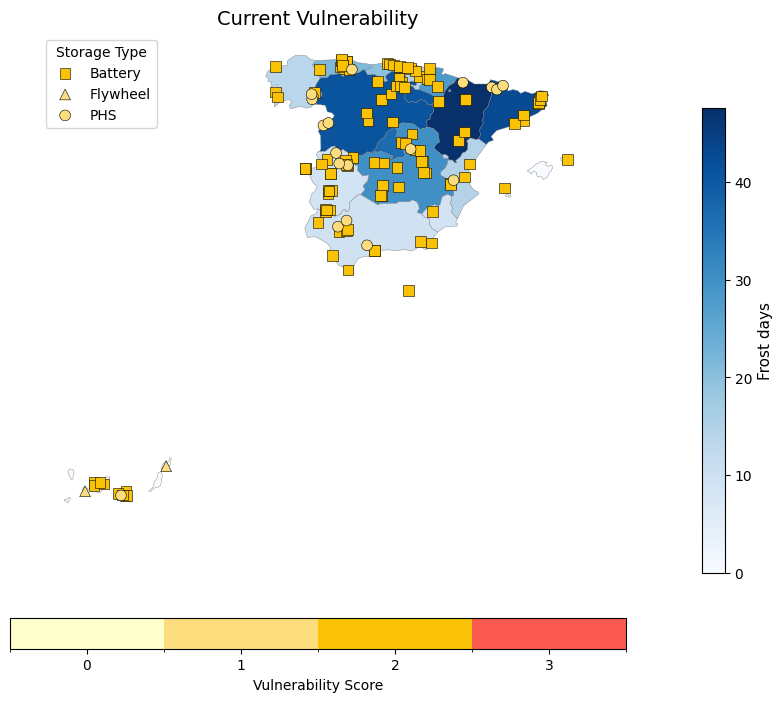

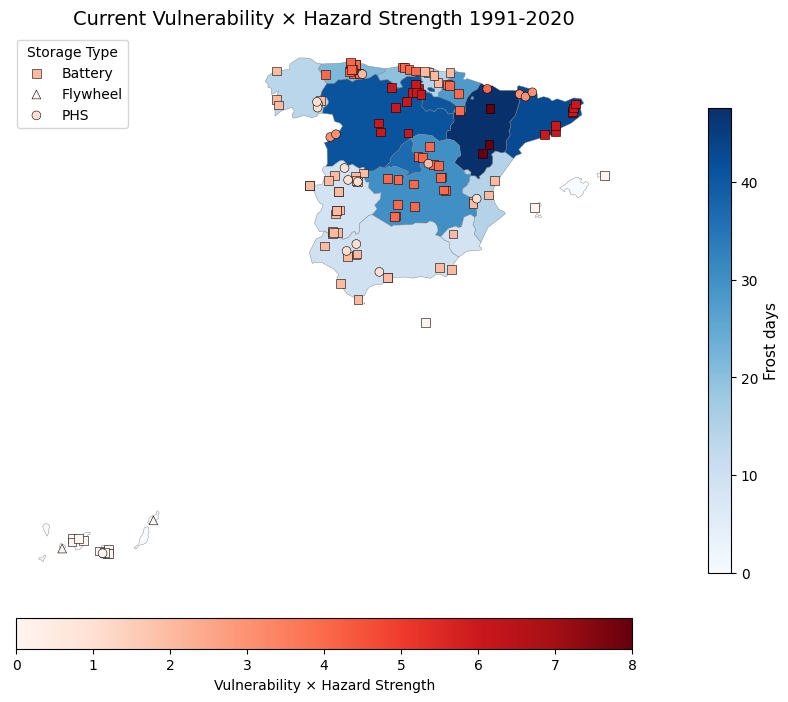

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability frost days"
HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"
FROSTDAYSCURRENT_COL = "Frost days 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [0, 1, 10, 20, 30, 40, 50]
    labels = ["0", "≤10", "≤20", "≤30", "≤40", "≤50"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[FROSTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    frost_days_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, FROSTDAYSCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Frost days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Frost days", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_13, ax_13 = plot_current_optionA(
    bg_col=FROSTDAYSCURRENT_COL,
    title="Current Vulnerability"
)

fig_14, ax_14 = plot_current_optionB(
    bg_col=FROSTDAYSCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_13, "Current Vulnerability frost days.jpg")
save_figure(fig_14, "Current Vulnerability × Hazard Strength 1991-2020 frost days.jpg")

Saved: Current Vulnerability frost days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 frost days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

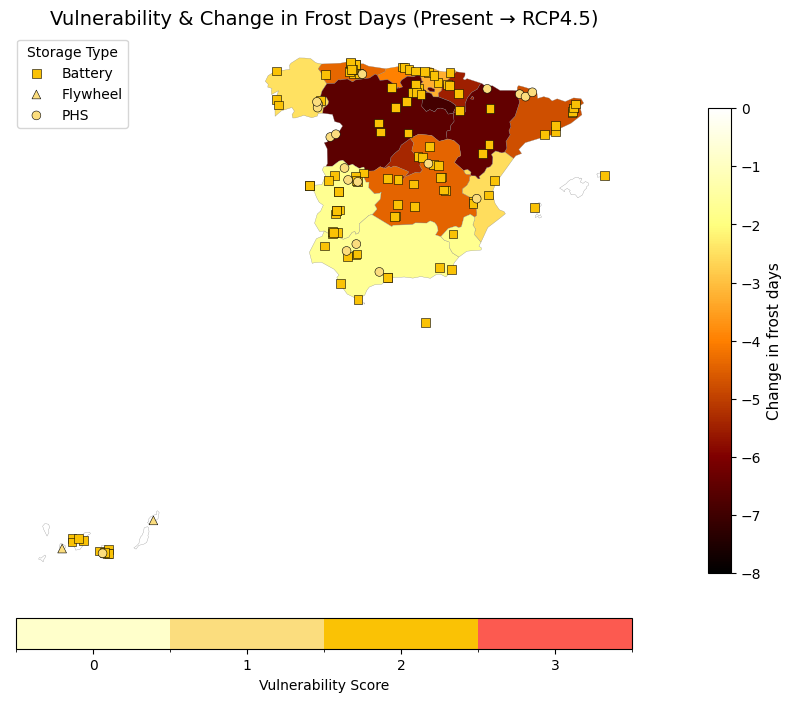

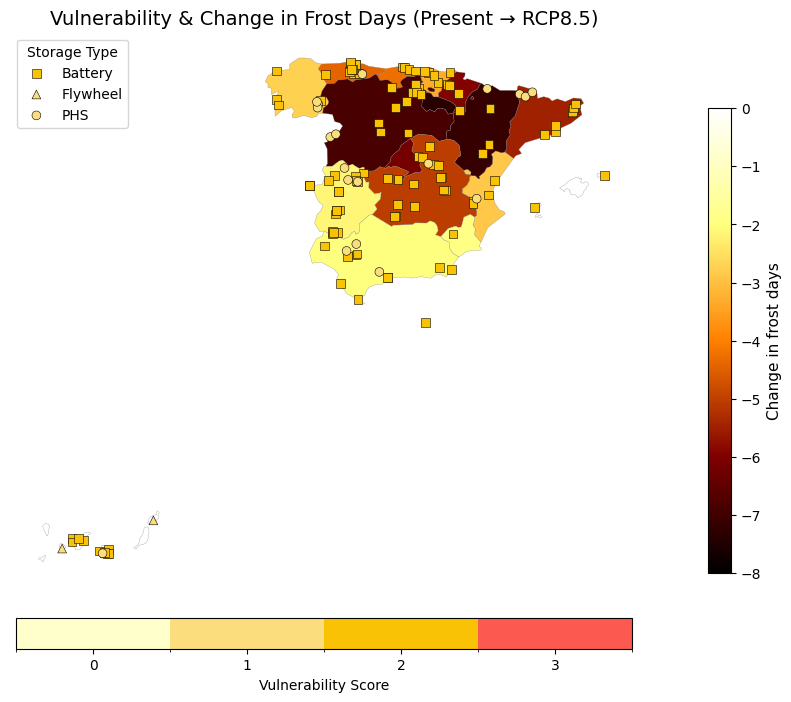

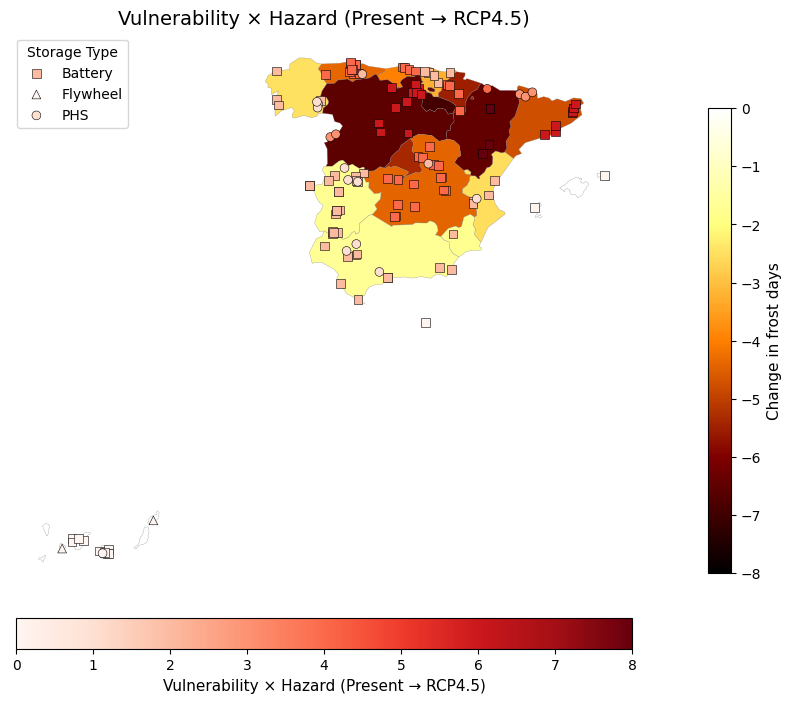

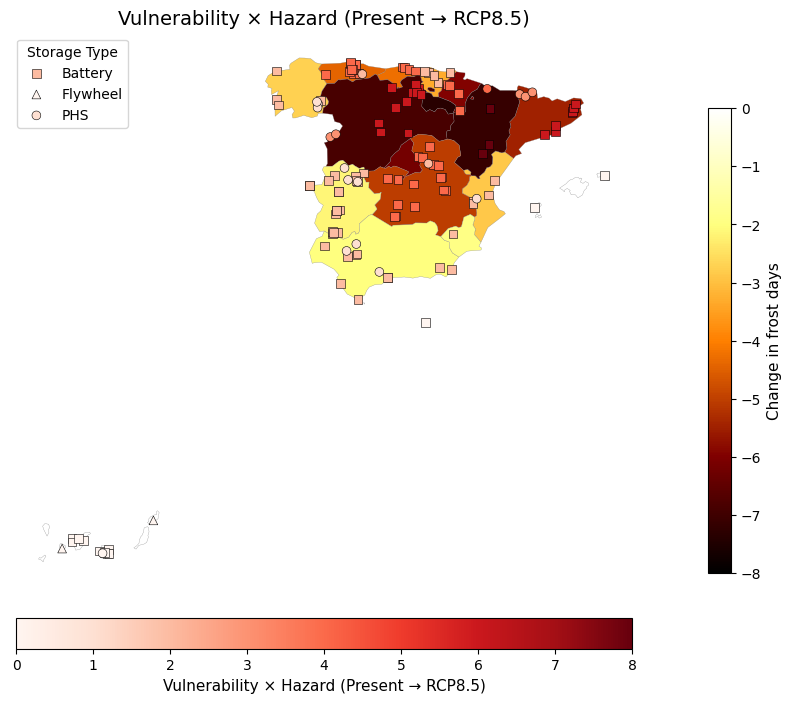

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability frost days"

FROSTDAYS_CHANGE45 = "Frost days change RCP4.5"
FROSTDAYS_CHANGE85 = "Frost days change RCP8.5"
HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

#Create region background from regions

regions_bg = regions.copy()

regions_bg[FROSTDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    frost_days_change45_dict
)
regions_bg[FROSTDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    frost_days_change85_dict
)


# =========================================================
# Discrete vulnerability colormap (unchanged)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("afmhot")
    norm_bg = mcolors.Normalize(vmin=-8, vmax=0)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in frost days", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    #Vulerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )
      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colorbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_15, ax_15 = plot_step5_optionA(
    FROSTDAYS_CHANGE45,
    "Vulnerability & Change in Frost Days (Present → RCP4.5)"
)

fig_16, ax_16 = plot_step5_optionA(
    FROSTDAYS_CHANGE85,
    "Vulnerability & Change in Frost Days (Present → RCP8.5)"
)
#I don't think I need these
fig_17, ax_17 = plot_step5_optionB(
    FROSTDAYS_CHANGE45,
    "Vulnerability × Hazard (Present → RCP4.5)"
)

fig_18, ax_18 = plot_step5_optionB(
    FROSTDAYS_CHANGE85,
    "Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_15, "Vulnerability & Change in frost days (Present → RCP4.5).jpg")
save_figure(fig_16, "Vulnerability & Change in frost days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in frost days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in frost days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

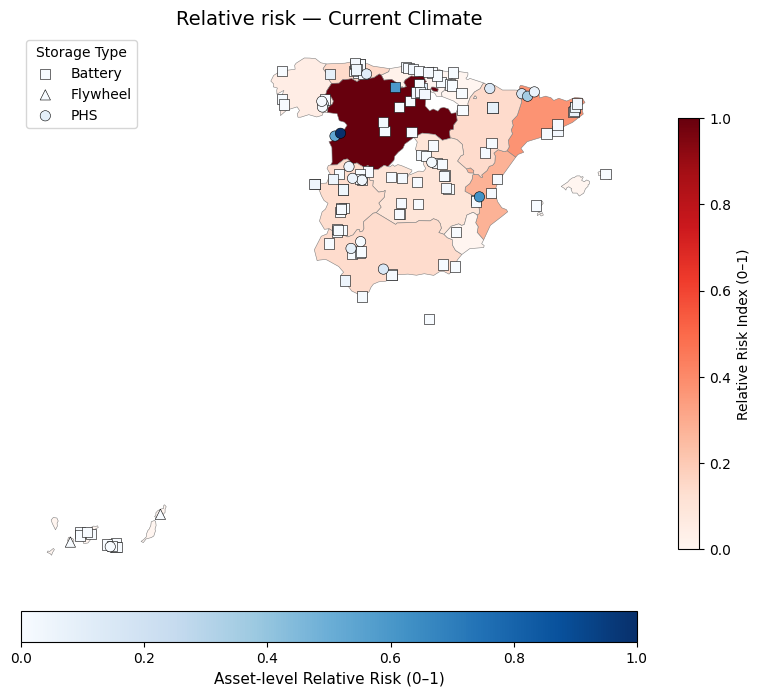

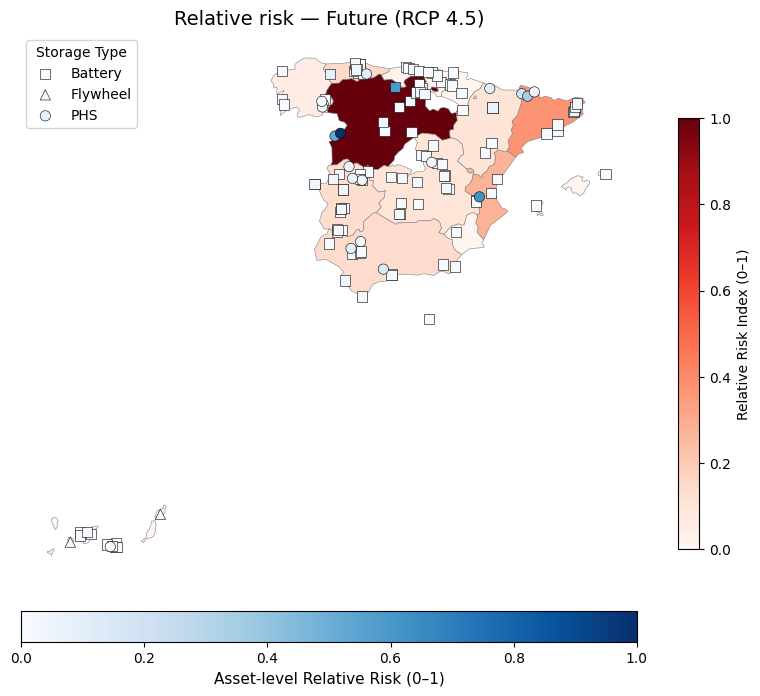

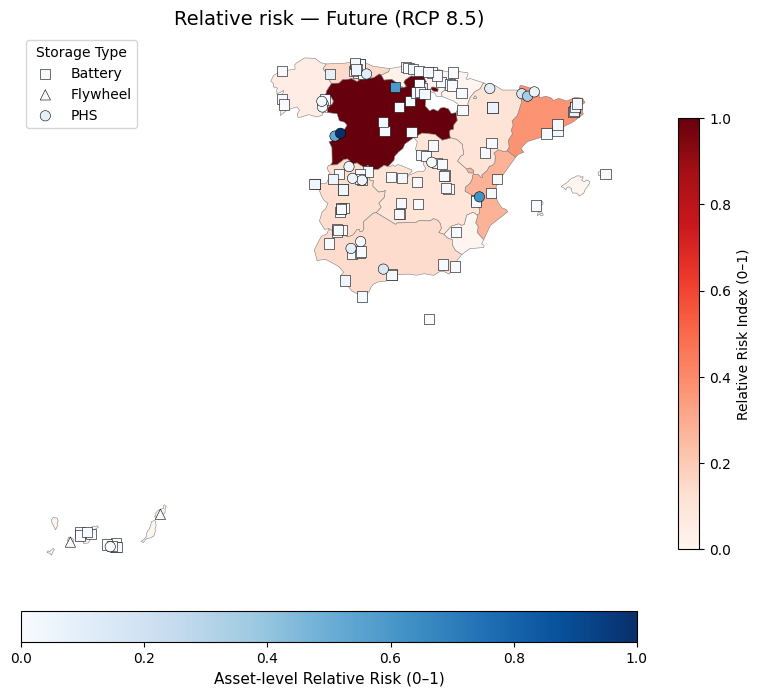

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability frost days"

HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"
HAZARD45_COL     = "Frost days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Frost days 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_19, ax_19 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_20, ax_20 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_21, ax_21 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_19, "Relative risk — Current Climate.jpg")
save_figure(fig_20, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_21, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

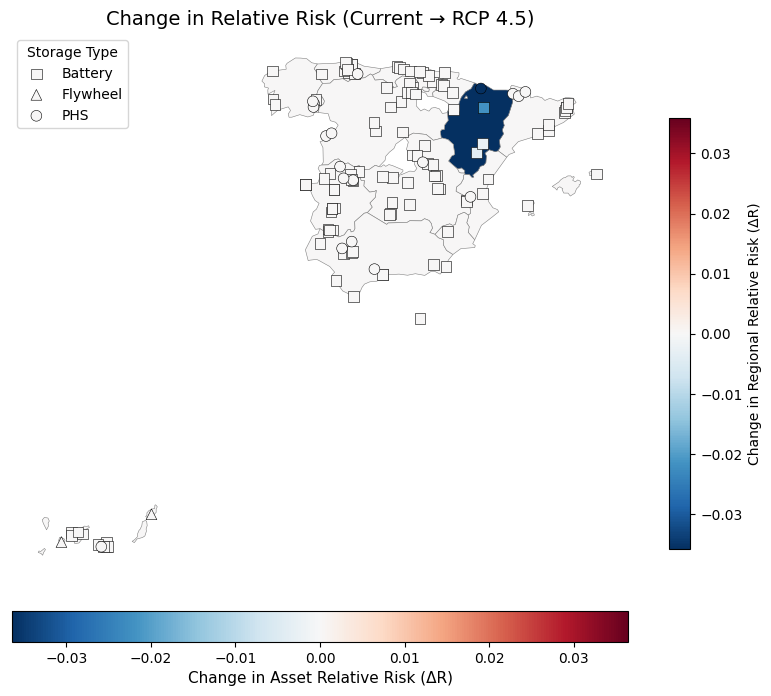

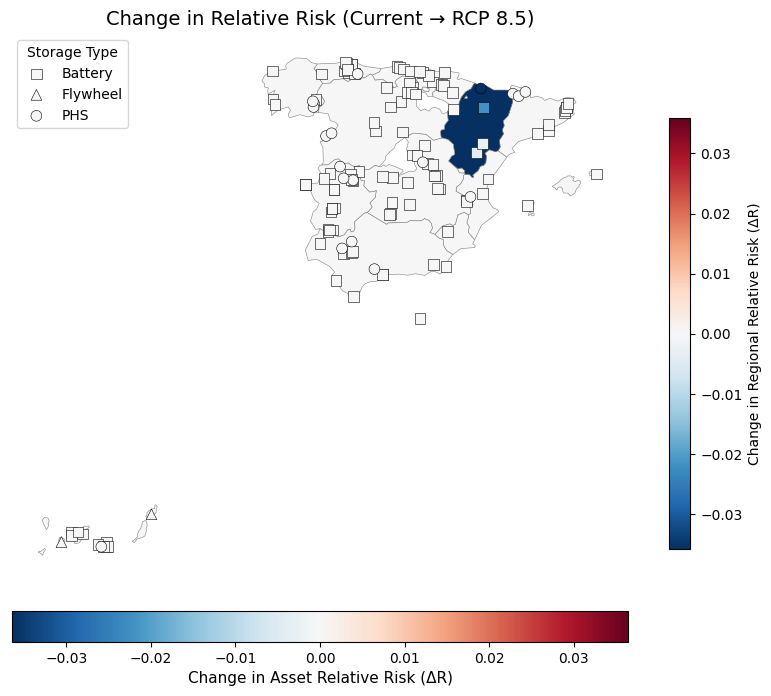

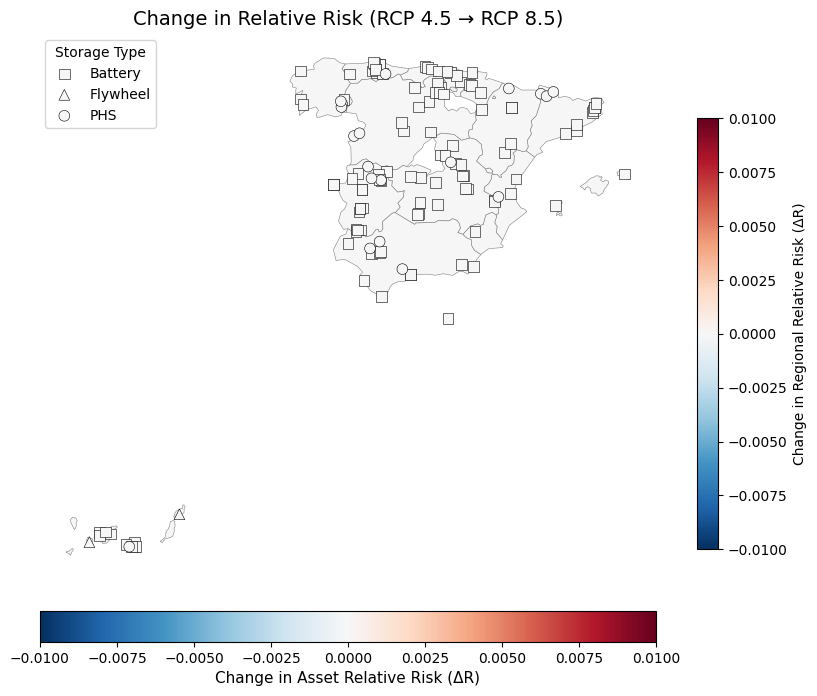

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_22, ax_22 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_23, ax_23 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_24, ax_23 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_22, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_23, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_24, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Castilla y León,175891.80,175891.80,175891.80,1.000000,1.000000,1.000000,0.00000,0.00000,0.0
1,Cataluña,65450.40,65450.40,65450.40,0.372106,0.372106,0.372106,0.00000,0.00000,0.0
2,Comunitat Valenciana,49163.40,49163.40,49163.40,0.279509,0.279509,0.279509,0.00000,0.00000,0.0
3,Principado de Asturias,26091.28,26091.28,26091.28,0.148337,0.148337,0.148337,0.00000,0.00000,0.0
4,Aragón,25244.00,18933.00,18933.00,0.143520,0.107640,0.107640,-0.03588,-0.03588,0.0
5,Andalucía,24334.76,24334.76,24334.76,0.138351,0.138351,0.138351,0.00000,0.00000,0.0
6,Extremadura,23983.76,23983.76,23983.76,0.136355,0.136355,0.136355,0.00000,0.00000,0.0
7,Castilla-La Mancha,17306.88,17306.88,17306.88,0.098395,0.098395,0.098395,0.00000,0.00000,0.0
8,Galicia,8480.00,8480.00,8480.00,0.048211,0.048211,0.048211,0.00000,0.00000,0.0
9,Cantabria,3743.20,3743.20,3743.20,0.021281,0.021281,0.021281,0.00000,0.00000,0.0


/tmp/ipython-input-1529036103.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


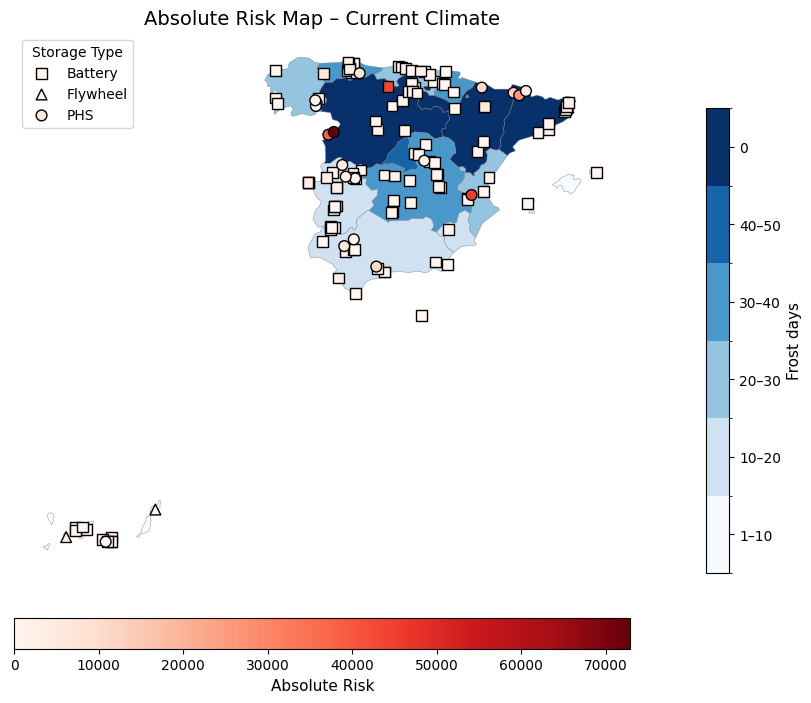

/tmp/ipython-input-1529036103.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


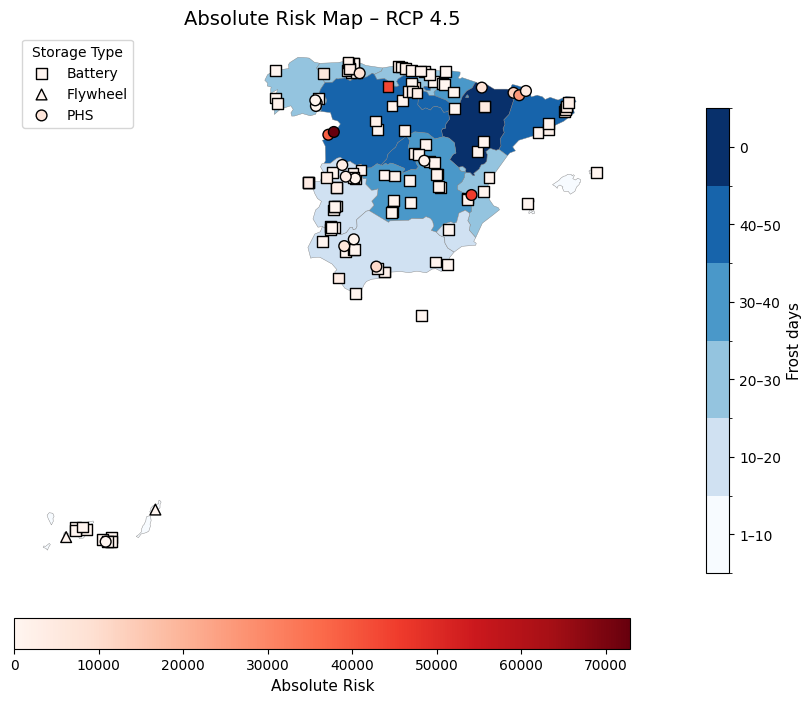

/tmp/ipython-input-1529036103.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


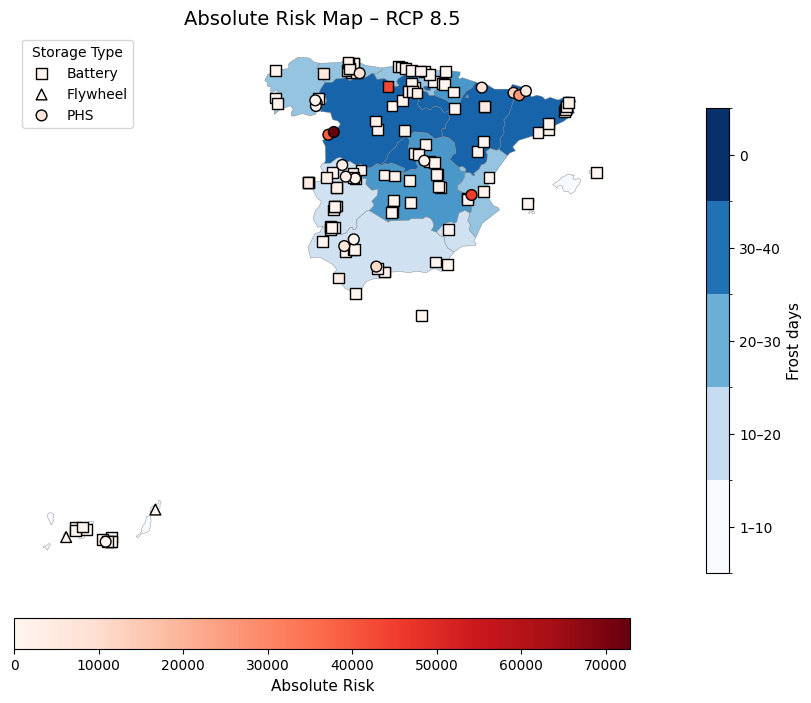

/tmp/ipython-input-1529036103.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


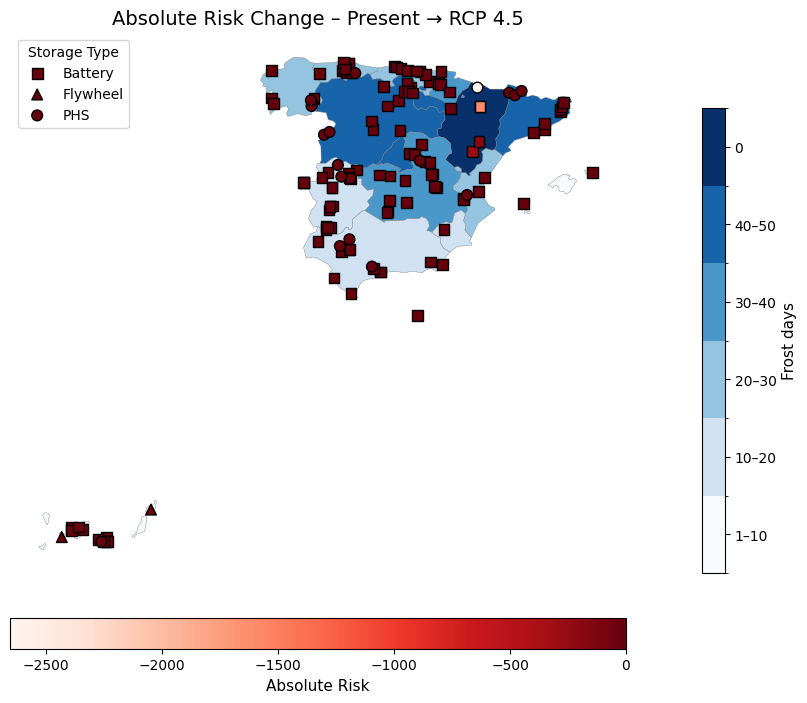

/tmp/ipython-input-1529036103.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


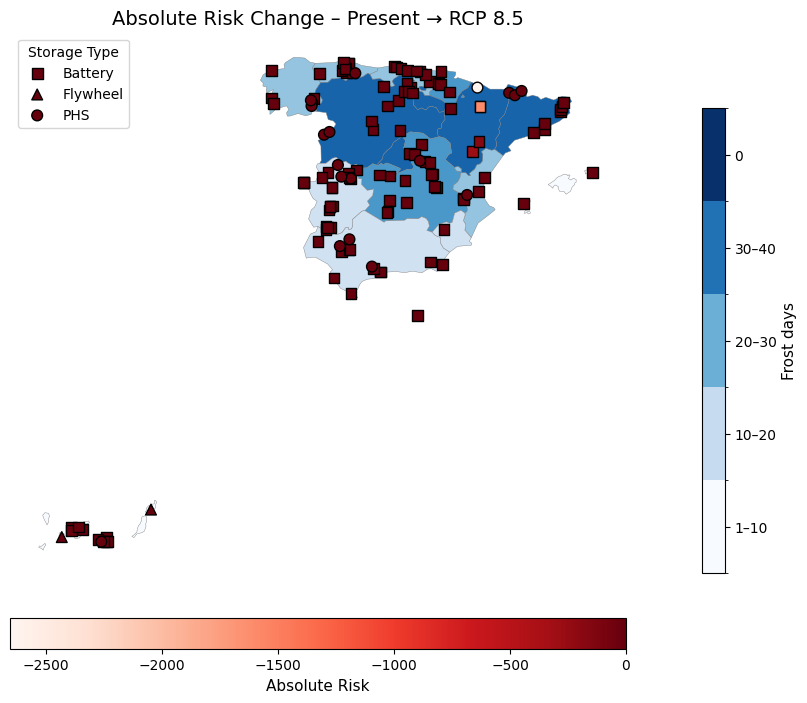

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability frost days"

HAZARDCURRENT_COL = "Frost days 1991-2020 hazard strength"
HAZARD45_COL = "Frost days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL = "Frost days 2011-2040 hazard strength RCP8.5"

FROSTDAYSCURRENT_COL = "Frost days 1991-2020"
FROSTDAYS45_COL = "Frost days 2011-2040 RCP4.5"
FROSTDAYS85_COL = "Frost days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 1, 10, 20, 30, 40, 50]
labels = ["0", "1–10", "10–20", "20–30", "30–40", "40–50"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[FROSTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    frost_days_present_dict
)
regions_bg[FROSTDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    frost_days_future45_dict
)
regions_bg[FROSTDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    frost_days_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, FROSTDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, FROSTDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, FROSTDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)


# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="Blues",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("Blues", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Frost days", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=FROSTDAYSCURRENT_COL,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=FROSTDAYS45_COL,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=FROSTDAYS85_COL,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=FROSTDAYS45_COL,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=FROSTDAYS85_COL,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Frost days 1991-2020,Frost days 1991-2020 hazard strength,Vulnerability frost days,Frost days change RCP4.5,Frost days change RCP8.5,Frost days 2011-2040 RCP4.5,Frost days 2011-2040 hazard strength RCP4.5,Frost days 2011-2040 RCP8.5,Frost days 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,13.60,1,2,-2.50,-2.73,10.89,1,10.58,1,2.0,15.50,62.00,62.00,62.00,0.000850,0.000850,0.000850
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,13.60,1,2,-2.50,-2.73,10.89,1,10.58,1,2.0,20.00,80.00,80.00,80.00,0.001097,0.001097,0.001097
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,13.60,1,2,-2.50,-2.73,10.89,1,10.58,1,2.0,5.00,20.00,20.00,20.00,0.000274,0.000274,0.000274
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,13.60,1,1,-2.50,-2.73,10.89,1,10.58,1,1.0,2280.00,6840.00,6840.00,6840.00,0.093827,0.093827,0.093827
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,13.60,1,1,-2.50,-2.73,10.89,1,10.58,1,1.0,215.00,645.00,645.00,645.00,0.008848,0.008848,0.008848
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,13.60,1,1,-2.50,-2.73,10.89,1,10.58,1,1.0,263.00,789.00,789.00,789.00,0.010823,0.010823,0.010823
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,13.60,1,2,-2.50,-2.73,10.89,1,10.58,1,2.0,11.00,44.00,44.00,44.00,0.000604,0.000604,0.000604
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,21.41,2,2,-4.40,-4.42,17.97,2,17.52,2,4.0,800.00,6400.00,6400.00,6400.00,0.087791,0.087791,0.087791
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,21.41,2,2,-4.40,-4.42,17.97,2,17.52,2,4.0,46.00,368.00,368.00,368.00,0.005048,0.005048,0.005048
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,21.41,2,2,-4.40,-4.42,17.97,2,17.52,2,4.0,60.00,480.00,480.00,480.00,0.006584,0.006584,0.006584


# Heatwaves (Apparent Temperature Heatwave Days Index)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Heatwave days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Heatwave days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Heatwave days 1991-2020 for each region
heatwave_days_present_dict = {
    "Galicia": 6.27,
    "Principado de Asturias": 4.99,
    "Cantabria": 4.7,
    "País Vasco": 4.65,
    "Comunidad Foral de Navarra": 5.41,
    "La Rioja": 5.2,
    "Aragón": 6.4,
    "Cataluña": 7.06,
    "Comunitat Valenciana": 5.39,
    "Región de Murcia": 5.66,
    "Andalucía": 6.0,
    "Castilla-La Mancha": 6.6,
    "Castilla y León": 6.39,
    "Comunidad de Madrid": 7.05,
    "Extremadura": 6.94,
    "Canarias": 0.0,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 5.14,
    "Ciudad de Melilla": 3.99,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 1991-2020"] = data["Region"].map(heatwave_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 1, 5, 10, 15, float("inf")]
labels = [0, 1, 2, 3, 4]

data['Heatwave days 1991-2020 hazard strength'] = pd.cut(
    data['Heatwave days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_heatwave_days = {
    "Battery": 3,
    "PHS": 2,
    "Flywheel": 1
}

data["Vulnerability heatwave days"] = data["Storage type"].map(vulnerability_heatwave_days)

In [ ]:
#Change in number of heatwave days from 1991-2020 to 2011-2040 RCP4.5 for each region
heatwave_days_change45_dict = {
    "Galicia": 3.15,
    "Principado de Asturias": 2.12,
    "Cantabria": 1.91,
    "País Vasco": 2.98,
    "Comunidad Foral de Navarra": 3.38,
    "La Rioja": 3.51,
    "Aragón": 5.14,
    "Cataluña": 5.94,
    "Comunitat Valenciana": 4.7,
    "Región de Murcia": 4.44,
    "Andalucía": 4.02,
    "Castilla-La Mancha": 4.88,
    "Castilla y León": 3.62,
    "Comunidad de Madrid": 4.39,
    "Extremadura": 3.38,
    "Canarias": 0.0,
    "Illes Balears": 3.97,
    "Ciudad de Ceuta": 2.76,
    "Ciudad de Melilla": 2.43,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days change RCP4.5"] = data["Region"].map(heatwave_days_change45_dict)

In [ ]:
#Change in number of heatwave days above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
heatwave_days_change85_dict = {
    "Galicia": 2.85,
    "Principado de Asturias": 1.41,
    "Cantabria": 1.31,
    "País Vasco": 1.39,
    "Comunidad Foral de Navarra": 3.32,
    "La Rioja": 3.87,
    "Aragón": 6.42,
    "Cataluña": 7.43,
    "Comunitat Valenciana": 6.25,
    "Región de Murcia": 5.87,
    "Andalucía": 6.2,
    "Castilla-La Mancha": 6.83,
    "Castilla y León": 4.44,
    "Comunidad de Madrid": 6.02,
    "Extremadura": 5.09,
    "Canarias": 0.0,
    "Illes Balears": 5.11,
    "Ciudad de Ceuta": 4.18,
    "Ciudad de Melilla": 2.93,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days change RCP8.5"] = data["Region"].map(heatwave_days_change85_dict)

In [ ]:
#Heatwave days 2011-2040 RCP4.5 for each region
heatwave_days_future45_dict = {
    "Galicia": 9.41,
    "Principado de Asturias": 7.11,
    "Cantabria": 6.61,
    "País Vasco": 6.74,
    "Comunidad Foral de Navarra": 8.79,
    "La Rioja": 8.71,
    "Aragón": 11.54,
    "Cataluña": 13.0,
    "Comunitat Valenciana": 10.09,
    "Región de Murcia": 10.09,
    "Andalucía": 10.02,
    "Castilla-La Mancha": 11.48,
    "Castilla y León": 10.01,
    "Comunidad de Madrid": 11.44,
    "Extremadura": 10.32,
    "Canarias": 0.0,
    "Illes Balears": 9.86,
    "Ciudad de Ceuta": 7.9,
    "Ciudad de Melilla": 6.42,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP4.5"] = data["Region"].map(heatwave_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 1, 5, 10, 15, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Heatwave days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Heatwave days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Heatwave days 2011-2040 RCP8.5 for each region
heatwave_days_future85_dict = {
    "Galicia": 8.95,
    "Principado de Asturias": 6.46,
    "Cantabria": 6.29,
    "País Vasco": 6.43,
    "Comunidad Foral de Navarra": 9.17,
    "La Rioja": 9.46,
    "Aragón": 13.48,
    "Cataluña": 14.5,
    "Comunitat Valenciana": 11.74,
    "Región de Murcia": 11.4,
    "Andalucía": 12.13,
    "Castilla-La Mancha": 13.52,
    "Castilla y León": 10.87,
    "Comunidad de Madrid": 13.3,
    "Extremadura": 11.63,
    "Canarias": 0.0,
    "Illes Balears": 10.68,
    "Ciudad de Ceuta": 9.13,
    "Ciudad de Melilla": 6.23,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Heatwave days 2011-2040 RCP8.5"] = data["Region"].map(heatwave_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 1, 5, 10, 15, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Heatwave days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Heatwave days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Heatwave days 1991-2020 hazard strength',
    'Heatwave days 2011-2040 hazard strength RCP4.5',
    'Heatwave days 2011-2040 hazard strength RCP8.5',
    'Vulnerability heatwave days',
    'Heatwave days 1991-2020',
    'Heatwave days 2011-2040 RCP4.5',
    'Heatwave days 2011-2040 RCP8.5',
    'Heatwave days change RCP4.5',
    'Heatwave days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

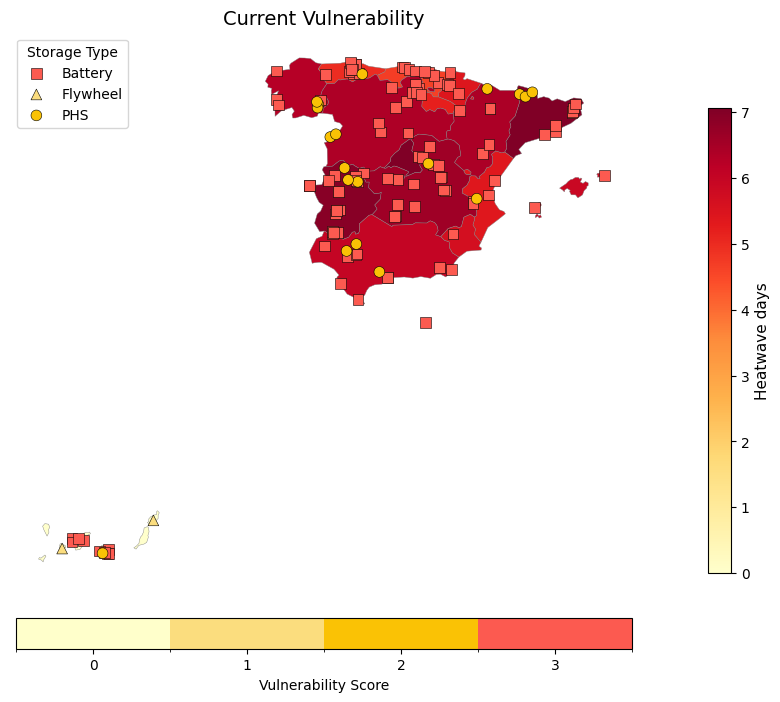

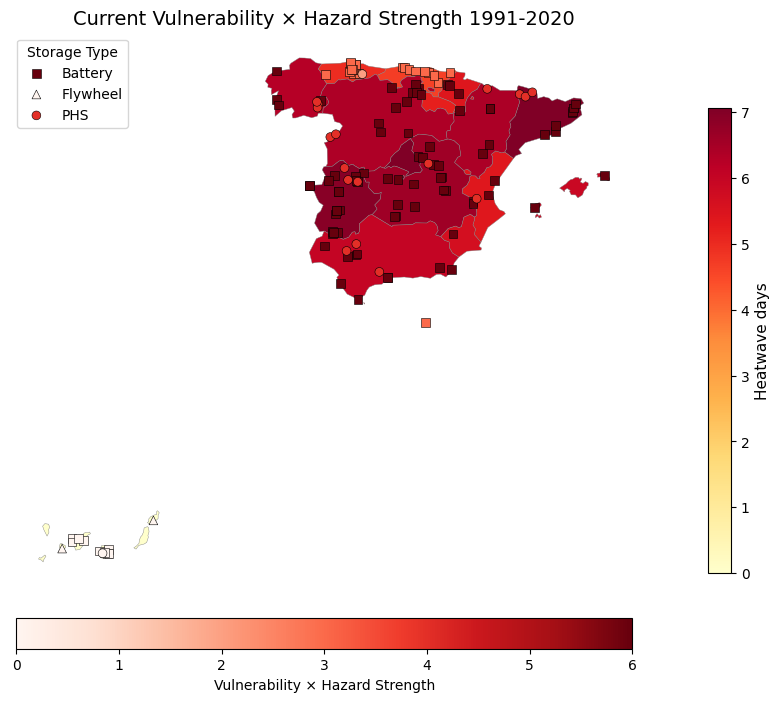

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability heatwave days"
HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HEATWAVEDAYSCURRENT_COL = "Heatwave days 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [0, 1, 5, 10, 15]
    labels = ["0", "≤5", "≤10", "≤15"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[HEATWAVEDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, HEATWAVEDAYSCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Heatwave days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")


    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Heatwave days", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_25, ax_25 = plot_current_optionA(
    bg_col=HEATWAVEDAYSCURRENT_COL,
    title="Current Vulnerability"
)

fig_26, ax_26 = plot_current_optionB(
    bg_col=HEATWAVEDAYSCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_25, "Current Vulnerability heatwave days.jpg")
save_figure(fig_26, "Current Vulnerability × Hazard Strength 1991-2020 heatwave days.jpg")

Saved: Current Vulnerability heatwave days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 heatwave days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

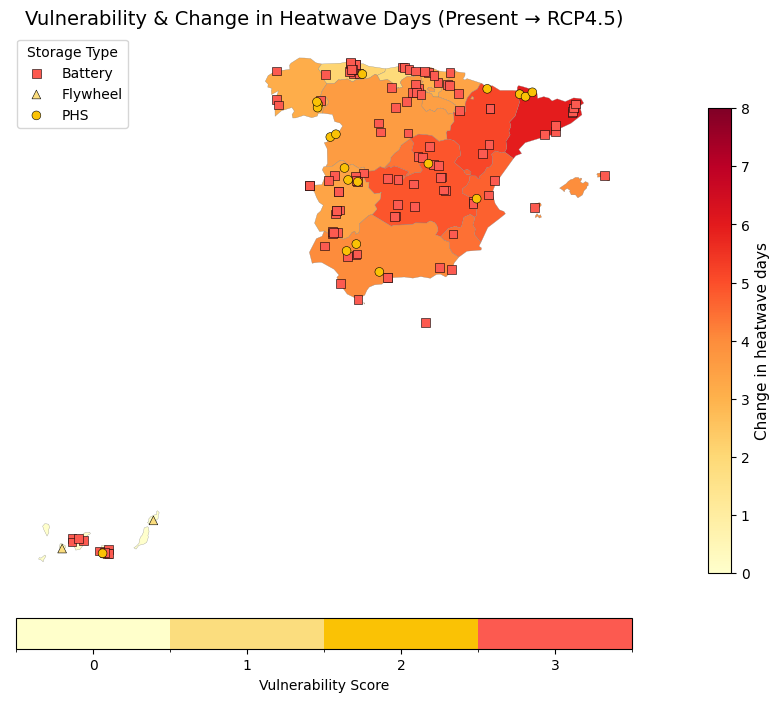

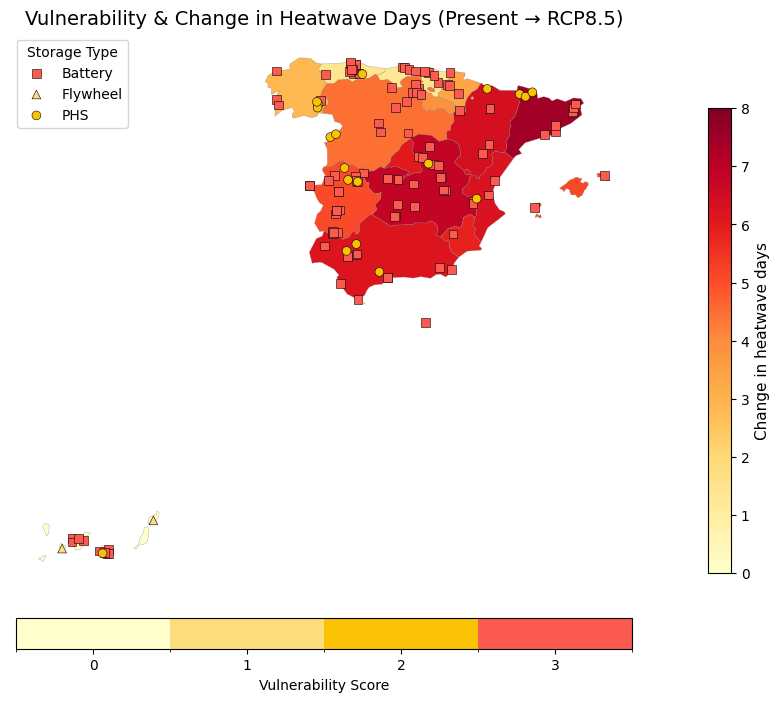

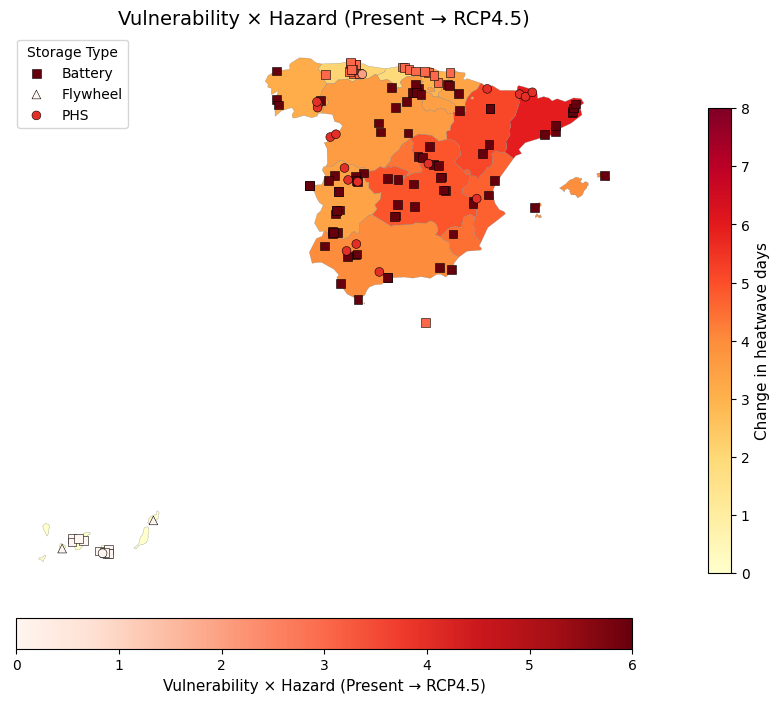

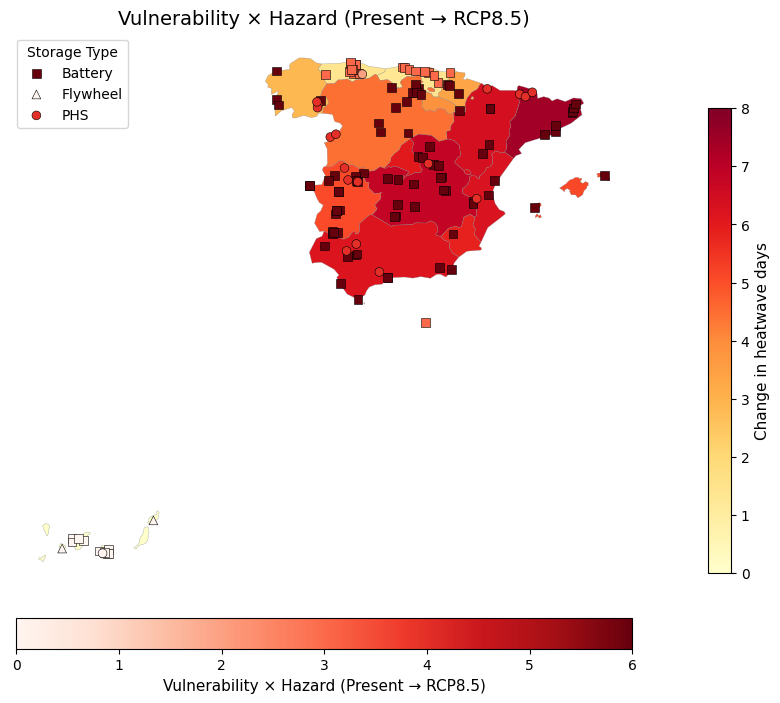

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability heatwave days"

HEATWAVEDAYS_CHANGE45 = "Heatwave days change RCP4.5"
HEATWAVEDAYS_CHANGE85 = "Heatwave days change RCP8.5"
HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[HEATWAVEDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    heatwave_days_change45_dict
)
regions_bg[HEATWAVEDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    heatwave_days_change85_dict
)


# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")
    norm_bg = mcolors.Normalize(vmin=0, vmax=8)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in heatwave days", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    #Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )
      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colourbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax

# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax

# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_27, ax_27 = plot_step5_optionA(
    HEATWAVEDAYS_CHANGE45,
    "Vulnerability & Change in Heatwave Days (Present → RCP4.5)"
)

fig_28, ax_28 = plot_step5_optionA(
    HEATWAVEDAYS_CHANGE85,
    "Vulnerability & Change in Heatwave Days (Present → RCP8.5)"
)
#I don't think I need these
fig_29, ax_29 = plot_step5_optionB(
    HEATWAVEDAYS_CHANGE45,
    "Vulnerability × Hazard (Present → RCP4.5)"
)

fig_30, ax_30 = plot_step5_optionB(
    HEATWAVEDAYS_CHANGE85,
    "Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_27, "Vulnerability & Change in heatwave days (Present → RCP4.5).jpg")
save_figure(fig_28, "Vulnerability & Change in heatwave days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in heatwave days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in heatwave days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

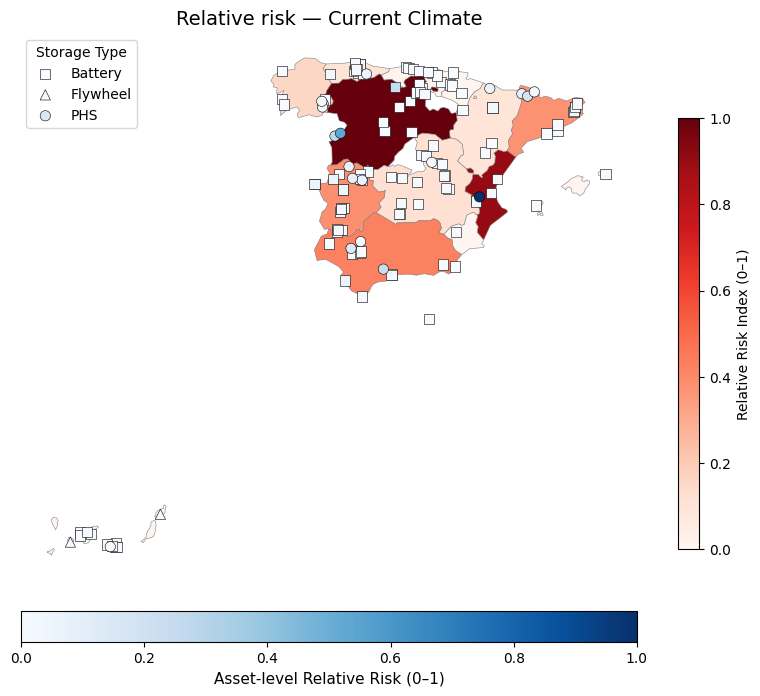

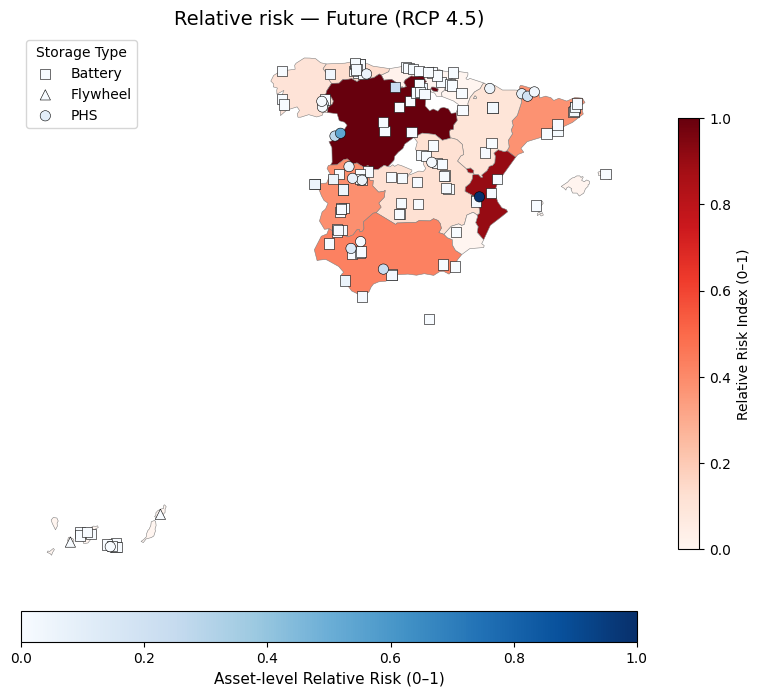

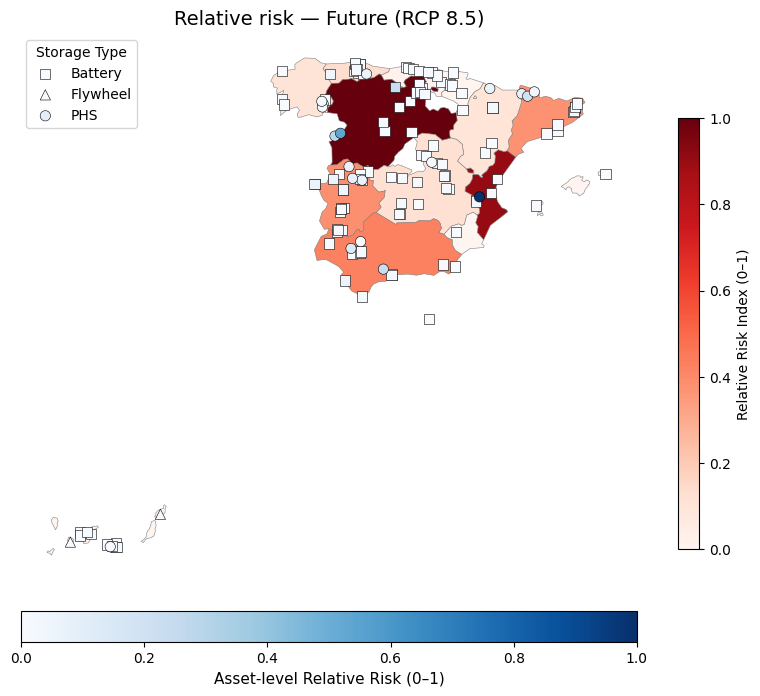

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability heatwave days"

HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HAZARD45_COL     = "Heatwave days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Heatwave days 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# MAP FUNCTION
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# GENERATE MAPS
# =========================================================

# Current climate
fig_31, ax_31 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_32, ax_32 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_33, ax_33 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_31, "Relative risk — Current Climate.jpg")
save_figure(fig_32, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_33, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

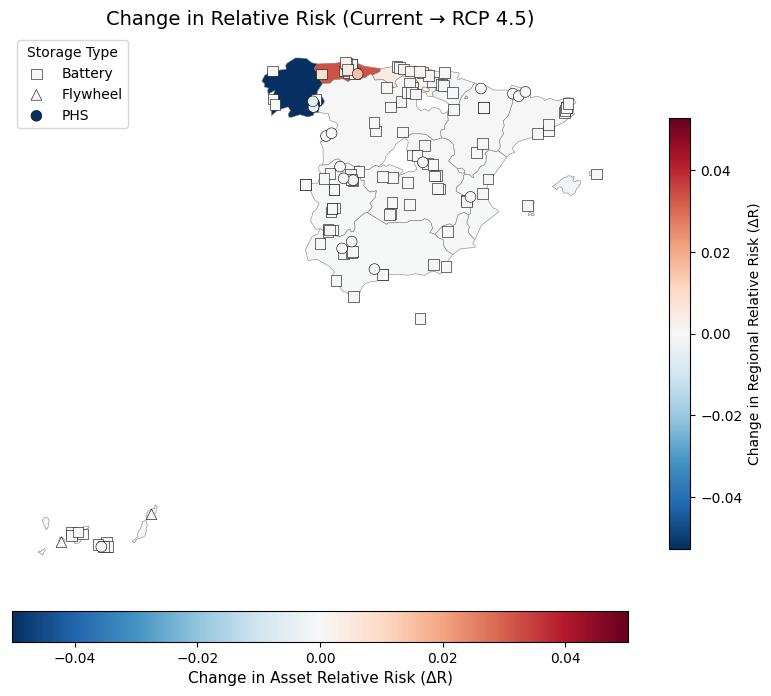

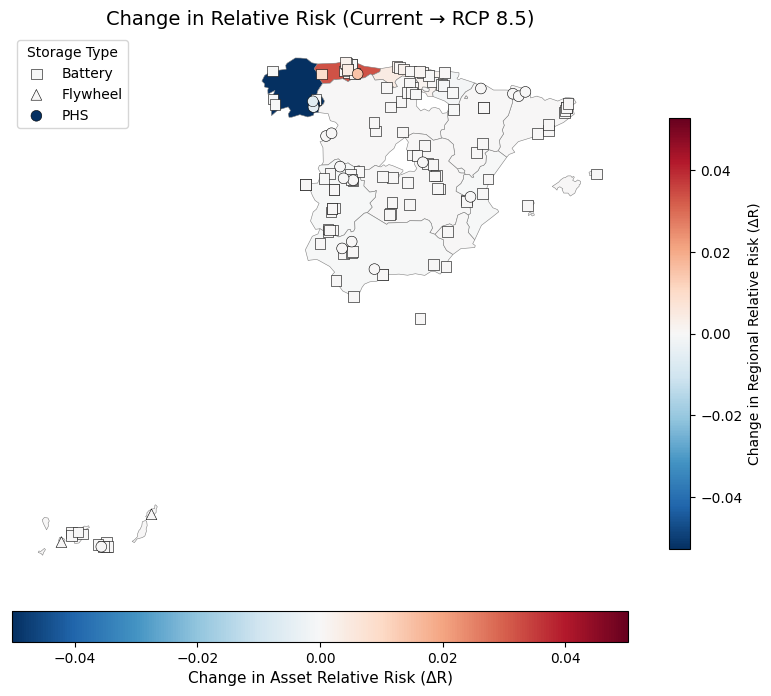

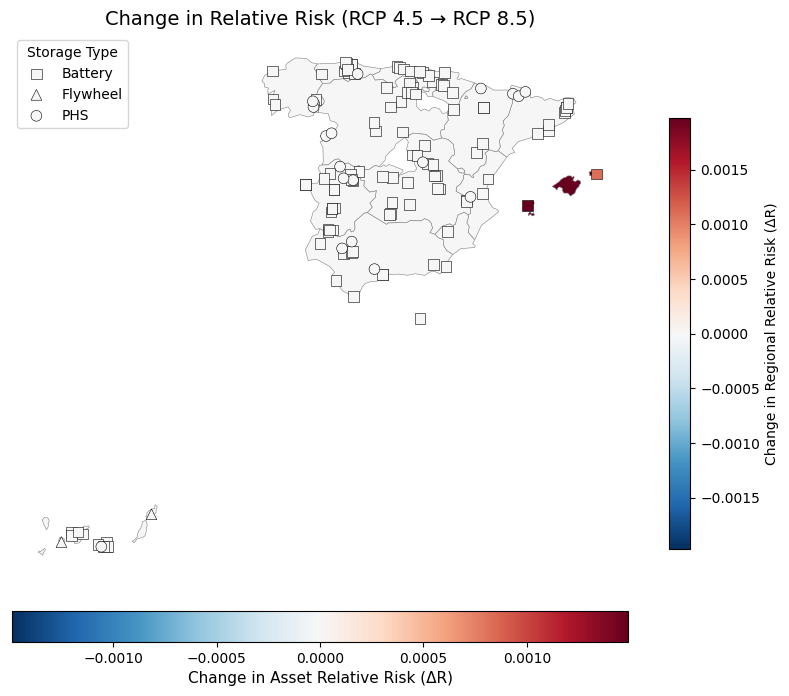

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_34, ax_34 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_35, ax_35 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_36, ax_36 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_34, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_35, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_36, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Castilla y León,213046.80,319570.20,319570.20,1.000000,1.000000,1.000000,0.000000e+00,0.000000e+00,0.000000
1,Comunitat Valenciana,192841.20,289261.80,289261.80,0.905159,0.905159,0.905159,-2.220446e-16,-2.220446e-16,0.000000
2,Andalucía,90903.48,136355.22,136355.22,0.426683,0.426683,0.426683,-1.110223e-16,-1.110223e-16,0.000000
3,Extremadura,81678.00,122517.00,122517.00,0.383381,0.383381,0.383381,-5.551115e-17,-5.551115e-17,0.000000
4,Cataluña,80060.40,120090.60,120090.60,0.375788,0.375788,0.375788,0.000000e+00,0.000000e+00,0.000000
5,Galicia,33714.00,33714.00,33714.00,0.158247,0.105498,0.105498,-5.274897e-02,-5.274897e-02,0.000000
6,Castilla-La Mancha,26620.32,39930.48,39930.48,0.124951,0.124951,0.124951,0.000000e+00,0.000000e+00,0.000000
7,Aragón,21588.00,32382.00,32382.00,0.101330,0.101330,0.101330,0.000000e+00,0.000000e+00,0.000000
8,Principado de Asturias,21563.46,43126.92,43126.92,0.101215,0.134953,0.134953,3.373822e-02,3.373822e-02,0.000000
9,Cantabria,2807.40,5614.80,5614.80,0.013177,0.017570,0.017570,4.392462e-03,4.392462e-03,0.000000


/tmp/ipython-input-1627232031.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


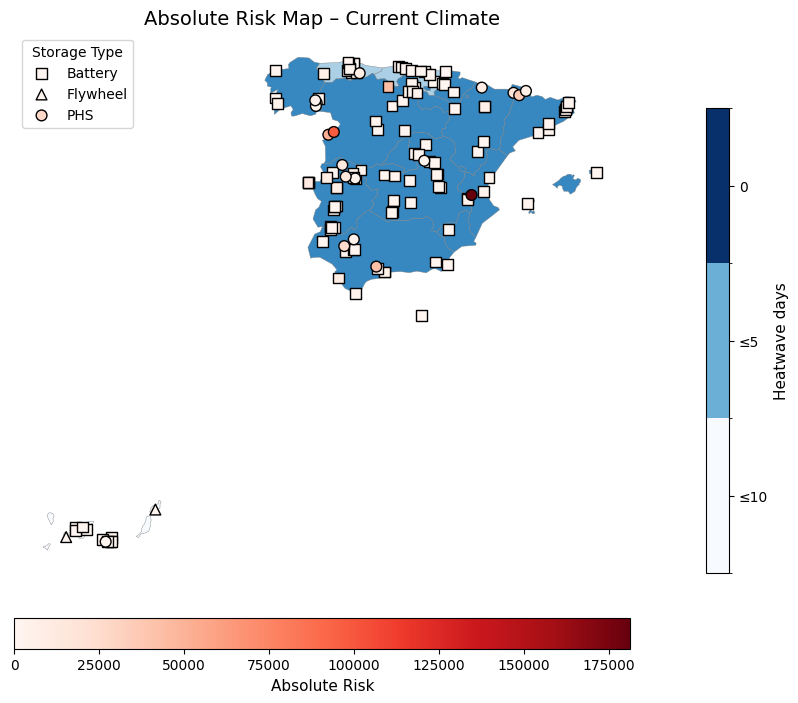

/tmp/ipython-input-1627232031.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


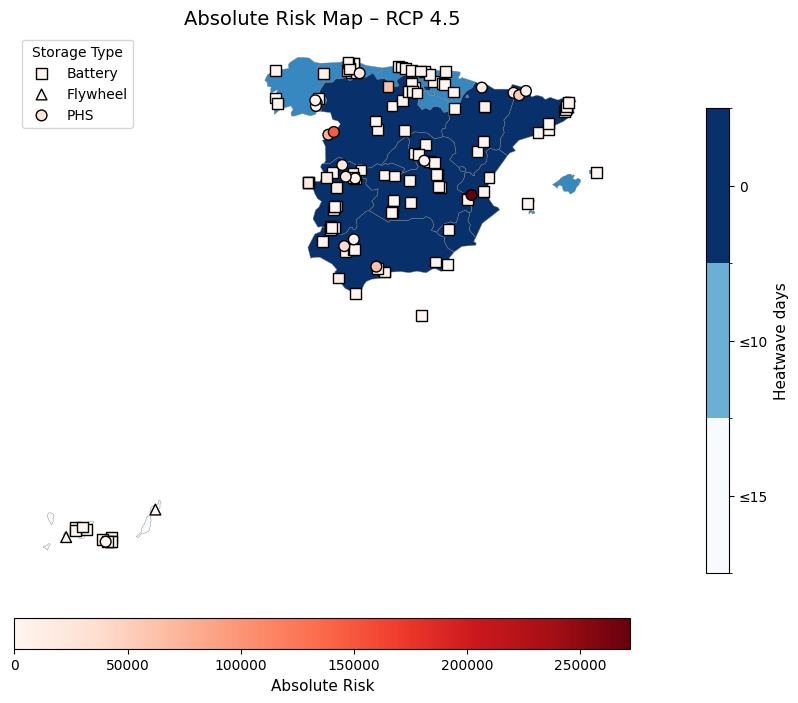

/tmp/ipython-input-1627232031.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


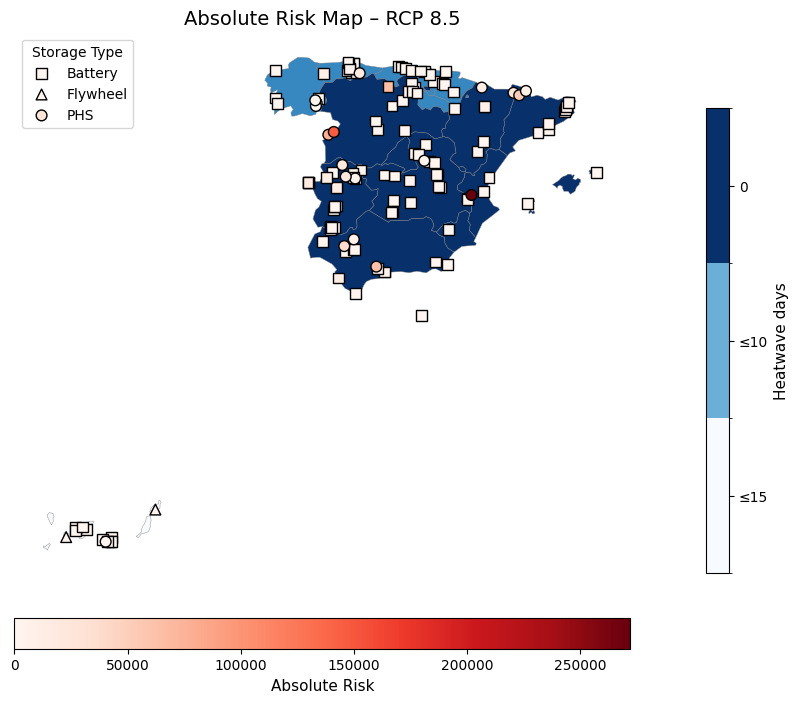

/tmp/ipython-input-1627232031.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


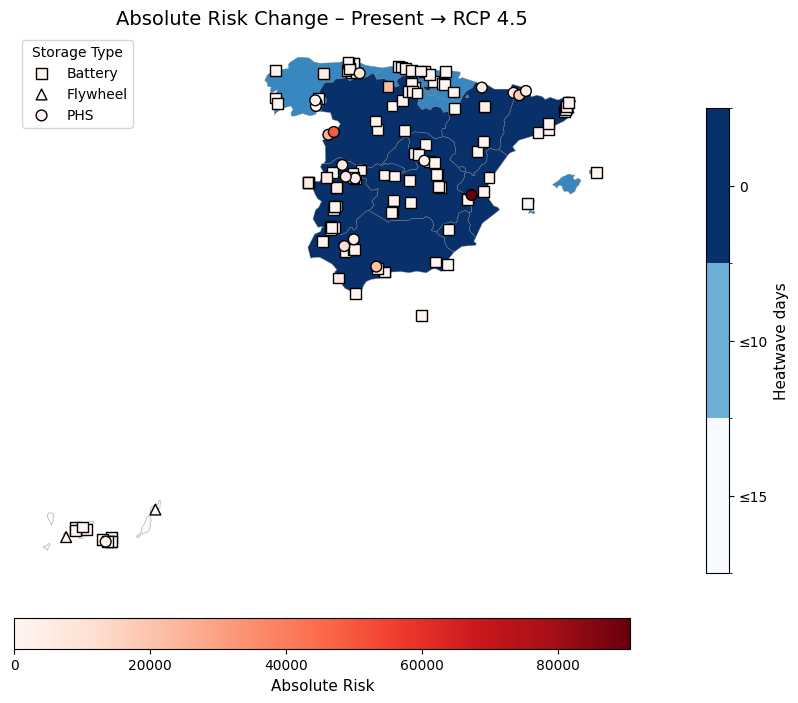

/tmp/ipython-input-1627232031.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


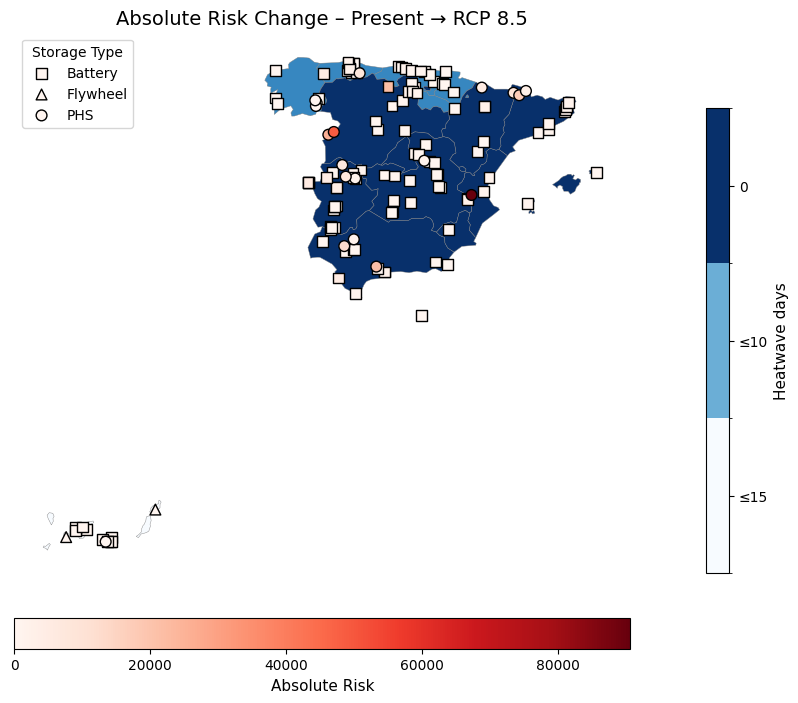

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability heatwave days"

HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HAZARD45_COL = "Heatwave days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL = "Heatwave days 2011-2040 hazard strength RCP8.5"

HEATWAVEDAYSCURRENT_COL = "Heatwave days 1991-2020"
HEATWAVEDAYS45_COL = "Heatwave days 2011-2040 RCP4.5"
HEATWAVEDAYS85_COL = "Heatwave days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 1, 5, 10, 15]
labels = ["0", "≤5", "≤10", "≤15"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[HEATWAVEDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_present_dict
)
regions_bg[HEATWAVEDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future45_dict
)
regions_bg[HEATWAVEDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)


# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="Blues",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("Blues", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Heatwave days", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYSCURRENT_COL,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS45_COL,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS85_COL,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS45_COL,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS85_COL,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Heatwave days 1991-2020,Heatwave days 1991-2020 hazard strength,Vulnerability heatwave days,Heatwave days change RCP4.5,Heatwave days change RCP8.5,Heatwave days 2011-2040 RCP4.5,Heatwave days 2011-2040 hazard strength RCP4.5,Heatwave days 2011-2040 RCP8.5,Heatwave days 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,6.27,2,3,3.15,2.85,9.41,2,8.95,2,6.0,15.50,186.00,186.00,186.00,0.001025,0.000684,0.000684
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,6.27,2,3,3.15,2.85,9.41,2,8.95,2,6.0,20.00,240.00,240.00,240.00,0.001323,0.000882,0.000882
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,6.27,2,3,3.15,2.85,9.41,2,8.95,2,6.0,5.00,60.00,60.00,60.00,0.000331,0.000221,0.000221
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,6.27,2,2,3.15,2.85,9.41,2,8.95,2,4.0,2280.00,27360.00,27360.00,27360.00,0.150824,0.100549,0.100549
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,6.27,2,2,3.15,2.85,9.41,2,8.95,2,4.0,215.00,2580.00,2580.00,2580.00,0.014222,0.009482,0.009482
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,6.27,2,2,3.15,2.85,9.41,2,8.95,2,4.0,263.00,3156.00,3156.00,3156.00,0.017398,0.011598,0.011598
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,6.27,2,3,3.15,2.85,9.41,2,8.95,2,6.0,11.00,132.00,132.00,132.00,0.000728,0.000485,0.000485
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,4.99,1,3,2.12,1.41,7.11,2,6.46,2,3.0,800.00,4800.00,9600.00,9600.00,0.026460,0.035280,0.035280
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,4.99,1,3,2.12,1.41,7.11,2,6.46,2,3.0,46.00,276.00,552.00,552.00,0.001521,0.002029,0.002029
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,4.99,1,3,2.12,1.41,7.11,2,6.46,2,3.0,60.00,360.00,720.00,720.00,0.001985,0.002646,0.002646


# Consecutive Dry Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Dry days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Dry days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Dry days 1991-2020 for each region
dry_days_present_dict = {
    "Galicia": 23.95,
    "Principado de Asturias": 16.69,
    "Cantabria": 16.51,
    "País Vasco": 16.26,
    "Comunidad Foral de Navarra": 22.05,
    "La Rioja": 22.19,
    "Aragón": 27.57,
    "Cataluña": 27.92,
    "Comunitat Valenciana": 39.36,
    "Región de Murcia": 52.54,
    "Andalucía": 63.92,
    "Castilla-La Mancha": 40.8,
    "Castilla y León": 30.34,
    "Comunidad de Madrid": 39.41,
    "Extremadura": 52.75,
    "Canarias": 131.13,
    "Illes Balears": 55.69,
    "Ciudad de Ceuta": 81.95,
    "Ciudad de Melilla": 83.8,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 1991-2020"] = data["Region"].map(dry_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data['Dry days 1991-2020 hazard strength'] = pd.cut(
    data['Dry days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_dry_days = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability dry days"] = data["Storage type"].map(vulnerability_dry_days)

In [ ]:
#Change in number of dry days from 1991-2020 to 2011-2040 RCP4.5 for each region
dry_days_change45_dict = {
    "Galicia": 0.82,
    "Principado de Asturias": 0.39,
    "Cantabria": 0.56,
    "País Vasco": 0.85,
    "Comunidad Foral de Navarra": 1.27,
    "La Rioja": 1.38,
    "Aragón": 1.57,
    "Cataluña": 1.22,
    "Comunitat Valenciana": 1.69,
    "Región de Murcia": 2.08,
    "Andalucía": 3.61,
    "Castilla-La Mancha": 2.73,
    "Castilla y León": 1.91,
    "Comunidad de Madrid": 2.11,
    "Extremadura": 3.99,
    "Canarias": -0.59,
    "Illes Balears": 0.94,
    "Ciudad de Ceuta": 0.37,
    "Ciudad de Melilla": 3.67,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days change RCP4.5"] = data["Region"].map(dry_days_change45_dict)

In [ ]:
#Change in number of dry days from 1991-2020 to 2011-2040 RCP8.5 for each region
dry_days_change85_dict = {
    "Galicia": 1.18,
    "Principado de Asturias": 0.56,
    "Cantabria": 0.67,
    "País Vasco": 0.8,
    "Comunidad Foral de Navarra": 1.31,
    "La Rioja": 1.22,
    "Aragón": 1.89,
    "Cataluña": 1.41,
    "Comunitat Valenciana": 1.61,
    "Región de Murcia": 2.6,
    "Andalucía": 5.18,
    "Castilla-La Mancha": 4.11,
    "Castilla y León": 2.67,
    "Comunidad de Madrid": 3.63,
    "Extremadura": 5.89,
    "Canarias": 0.12,
    "Illes Baleares": 0.49,
    "Ciudad de Ceuta": 1.17,
    "Ciudad de Melilla": 2.35,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days change RCP8.5"] = data["Region"].map(dry_days_change85_dict)

In [ ]:
#Dry days 2011-2040 RCP4.5 for each region
dry_days_future45_dict = {
    "Galicia": 24.94,
    "Principado de Asturias": 16.91,
    "Cantabria": 17.34,
    "País Vasco": 18.34,
    "Comunidad Foral de Navarra": 23.76,
    "La Rioja": 23.54,
    "Aragón": 30.22,
    "Cataluña": 29.73,
    "Comunitat Valenciana": 42.25,
    "Región de Murcia": 56.66,
    "Andalucía": 66.83,
    "Castilla-La Mancha": 45.14,
    "Castilla y León": 33.09,
    "Comunidad de Madrid": 43.78,
    "Extremadura": 59.22,
    "Canarias": 14.62,
    "Illes Balears": 58.94,
    "Ciudad de Ceuta": 77.6,
    "Ciudad de Melilla": 78.28,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP4.5"] = data["Region"].map(dry_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Dry days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Dry days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Dry days 2011-2040 RCP8.5 for each region
dry_days_future85_dict = {
    "Galicia": 25.42,
    "Principado de Asturias": 16.84,
    "Cantabria": 17.09,
    "País Vasco": 17.98,
    "Comunidad Foral de Navarra": 23.64,
    "La Rioja": 23.28,
    "Aragón": 29.89,
    "Cataluña": 29.39,
    "Comunitat Valenciana": 41.44,
    "Región de Murcia": 56.77,
    "Andalucía": 67.76,
    "Castilla-La Mancha": 45.9,
    "Castilla y León": 33.98,
    "Comunidad de Madrid": 44.35,
    "Extremadura": 60.27,
    "Canarias": 15.3,
    "Illes Balears": 57.56,
    "Ciudad de Ceuta": 77.55,
    "Ciudad de Melilla": 76.54,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Dry days 2011-2040 RCP8.5"] = data["Region"].map(dry_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 15, 30, 60, 140, float("inf")]
labels = [0, 1, 2, 3, 4]

data["Dry days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Dry days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Dry days 1991-2020 hazard strength',
    'Dry days 2011-2040 hazard strength RCP4.5',
    'Dry days 2011-2040 hazard strength RCP8.5',
    'Vulnerability dry days',
    'Dry days 1991-2020',
    'Dry days 2011-2040 RCP4.5',
    'Dry days 2011-2040 RCP8.5',
    'Dry days change RCP4.5',
    'Dry days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

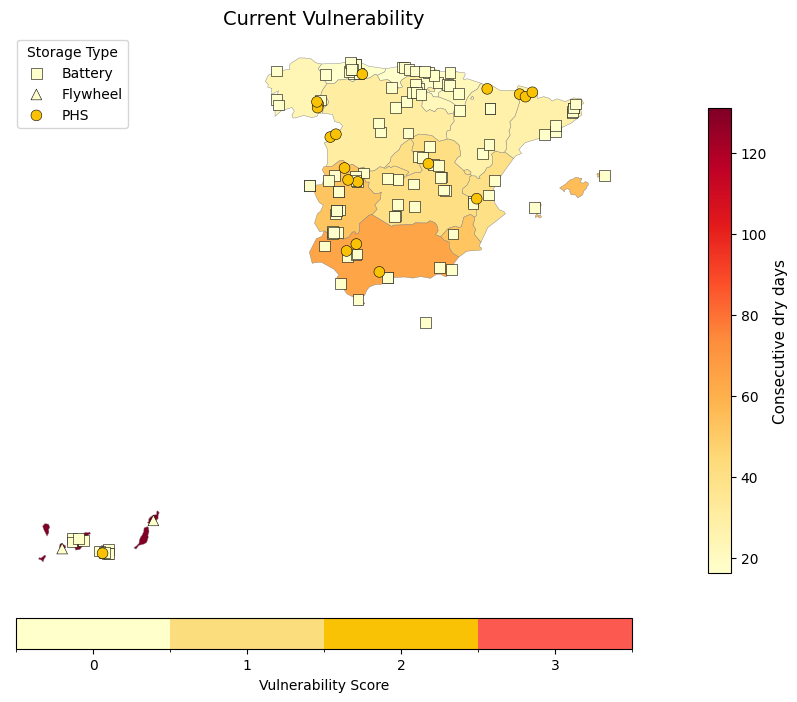

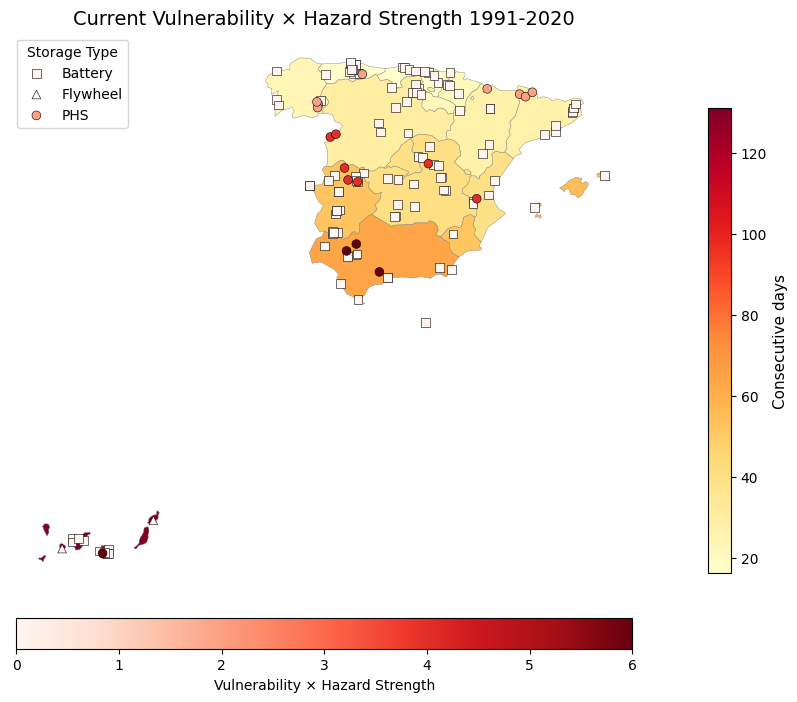

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability dry days"
HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"
DRYDAYSCURRENT_COL = "Dry days 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [1, 15, 30, 60, 140]
    labels = ["≤15", "≤30", "≤60", "60+"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[DRYDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    dry_days_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, DRYDAYSCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Consecutive dry days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Consecutive days", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_37, ax_37 = plot_current_optionA(
    bg_col=DRYDAYSCURRENT_COL,
    title="Current Vulnerability"
)

fig_38, ax_38 = plot_current_optionB(
    bg_col=DRYDAYSCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_37, "Current Vulnerability consecutive dry days.jpg")
save_figure(fig_38, "Current Vulnerability × Hazard Strength 1991-2020 consecutive dry days.jpg")

Saved: Current Vulnerability consecutive dry days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 consecutive dry days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

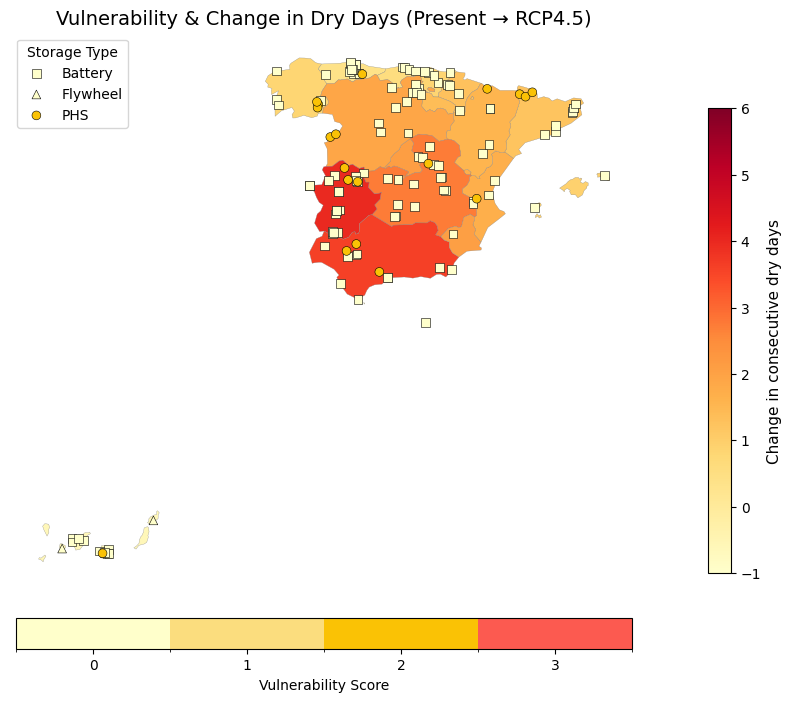

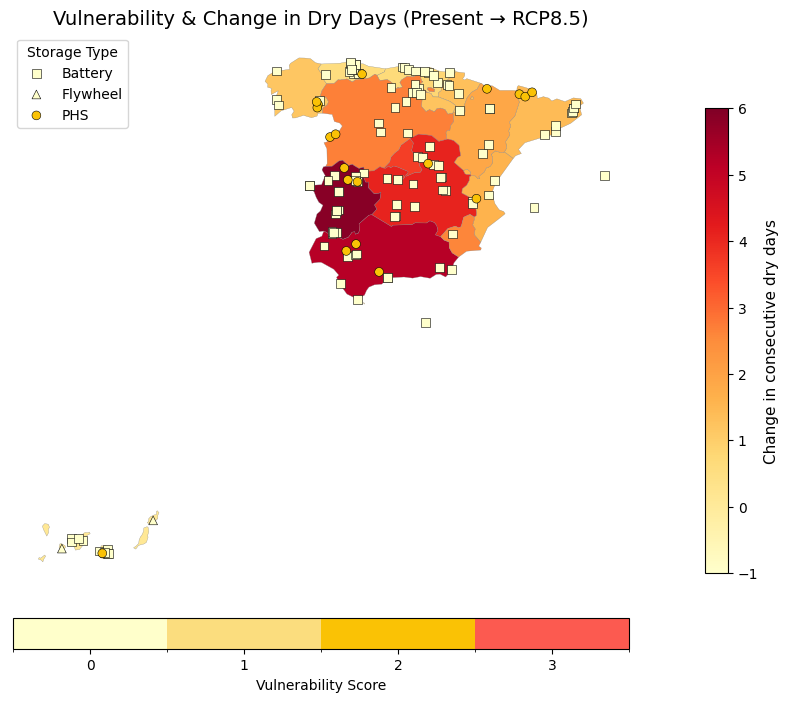

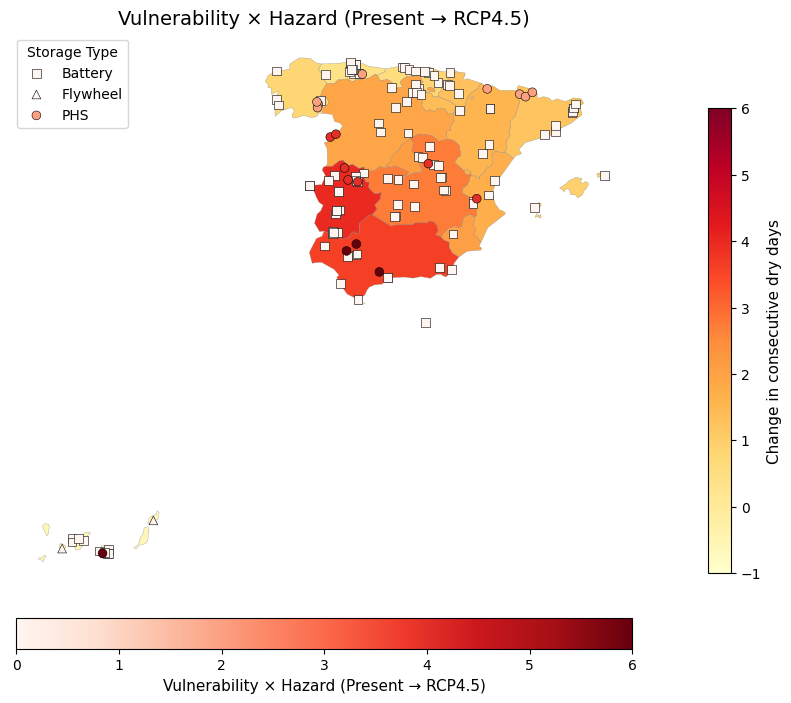

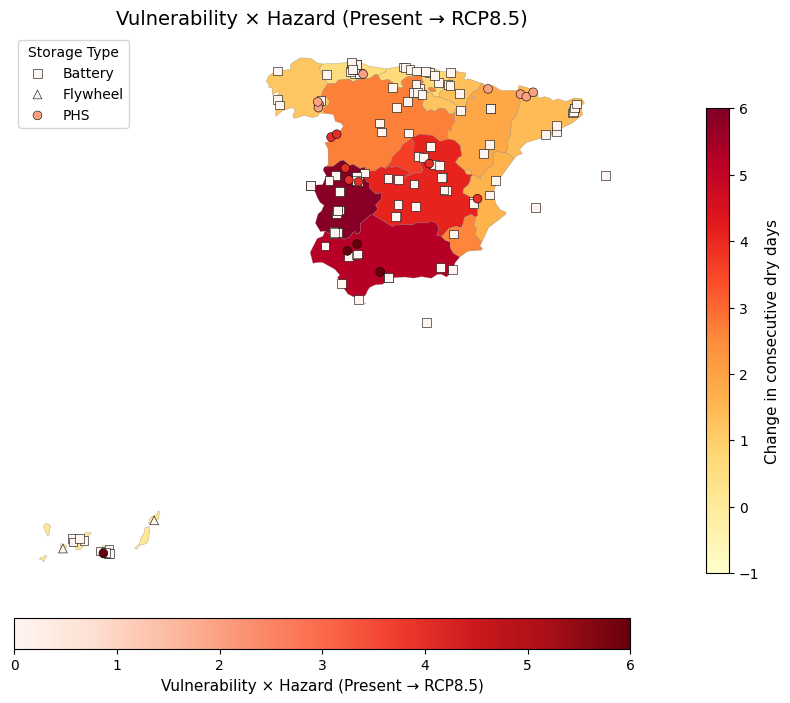

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability dry days"

DRYDAYS_CHANGE45 = "Dry days change RCP4.5"
DRYDAYS_CHANGE85 = "Dry days change RCP8.5"
HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[DRYDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    dry_days_change45_dict
)
regions_bg[DRYDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    dry_days_change85_dict
)


# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")
    norm_bg = mcolors.Normalize(vmin=-1, vmax=6)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in consecutive dry days", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )

      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colourbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_39, ax_39 = plot_step5_optionA(
    DRYDAYS_CHANGE45,
    "Vulnerability & Change in Dry Days (Present → RCP4.5)"
)

fig_40, ax_40 = plot_step5_optionA(
    DRYDAYS_CHANGE85,
    "Vulnerability & Change in Dry Days (Present → RCP8.5)"
)
#I don't think I need these
fig_41, ax_41 = plot_step5_optionB(
    DRYDAYS_CHANGE45,
    "Vulnerability × Hazard (Present → RCP4.5)"
)

fig_42, ax_42 = plot_step5_optionB(
    DRYDAYS_CHANGE85,
    "Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_39, "Vulnerability & Change in consecutive dry days (Present → RCP4.5).jpg")
save_figure(fig_40, "Vulnerability & Change in consecutive dry days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in consecutive dry days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in consecutive dry days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

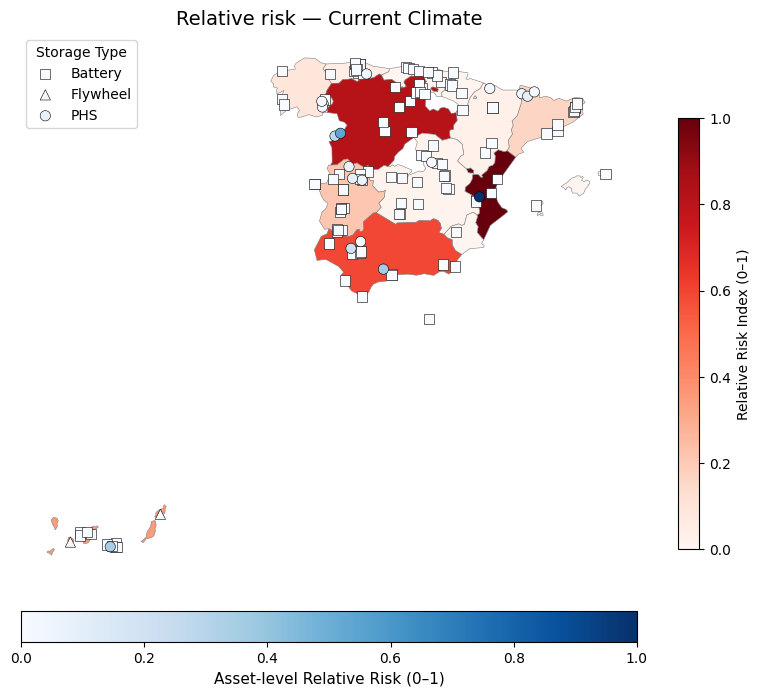

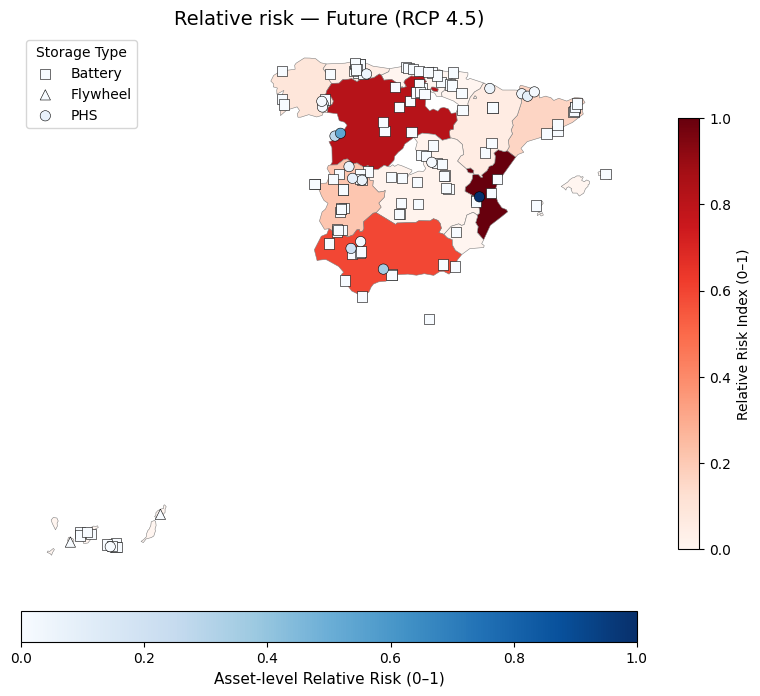

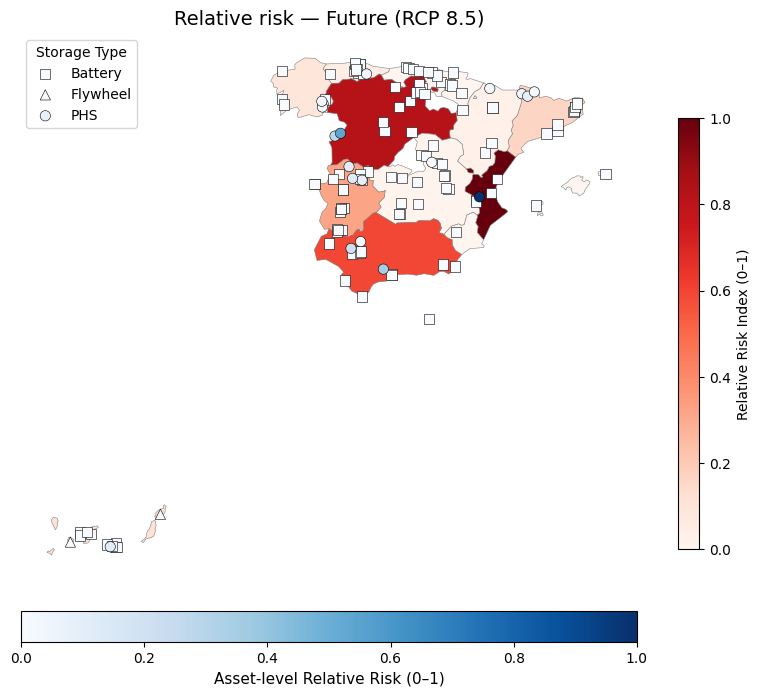

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability dry days"

HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"
HAZARD45_COL     = "Dry days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Dry days 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_43, ax_43 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_44, ax_44 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_45, ax_45 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_43, "Relative risk — Current Climate.jpg")
save_figure(fig_44, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_45, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

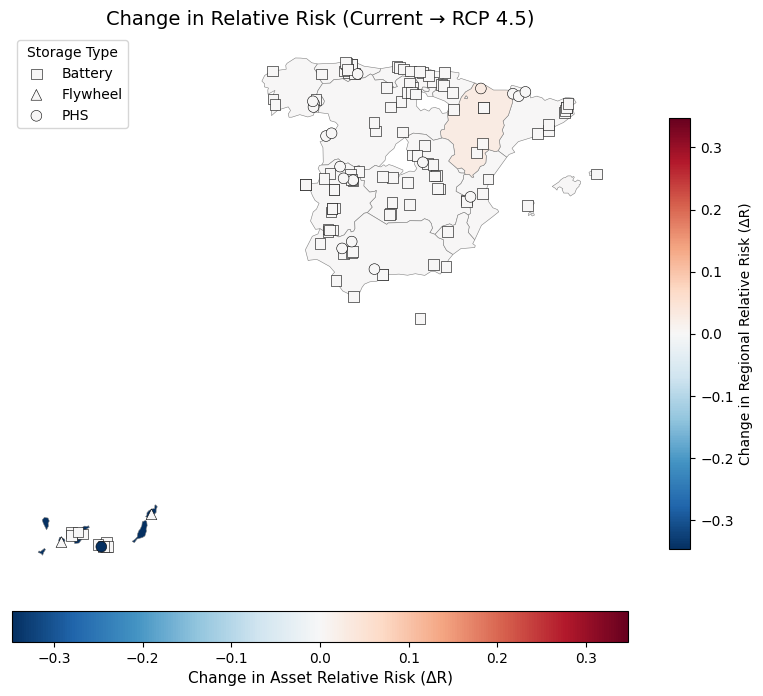

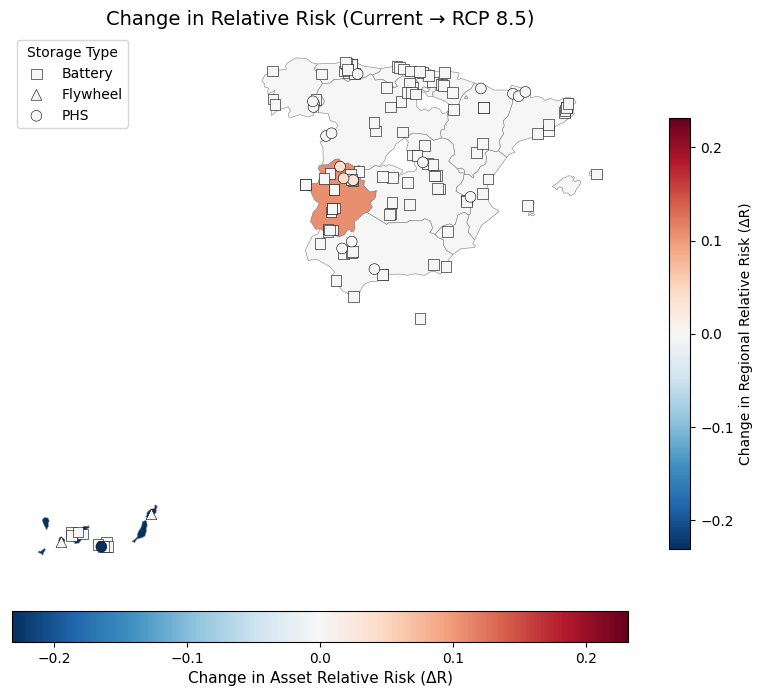

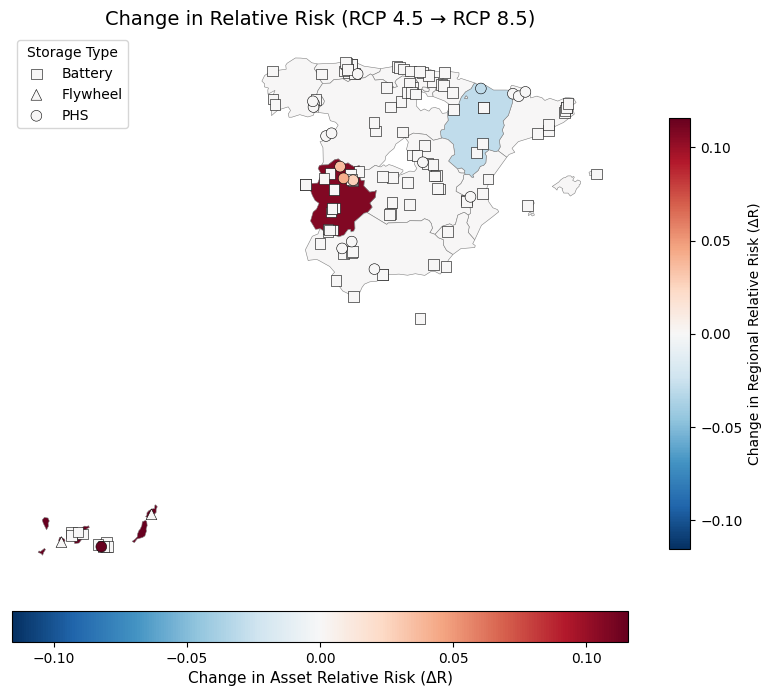

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_46, ax_46 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_47, ax_47 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_48, ax_48 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_46, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_47, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_48, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table

,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Comunitat Valenciana,181404.00,181404.00,181404.00,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
1,Castilla y León,148620.00,148620.00,148620.00,0.819276,0.819276,0.819276,0.000000,0.000000,0.000000
2,Andalucía,107395.20,107395.20,107395.20,0.592022,0.592022,0.592022,0.000000,0.000000,0.000000
3,Canarias,63000.00,0.00,21000.00,0.347291,0.000000,0.115764,-0.347291,-0.231527,0.115764
4,Extremadura,38906.88,38906.88,58360.32,0.214476,0.214476,0.321715,0.000000,0.107238,0.107238
5,Cataluña,29220.00,29220.00,29220.00,0.161077,0.161077,0.161077,0.000000,0.000000,0.000000
6,Galicia,16548.00,16548.00,16548.00,0.091222,0.091222,0.091222,0.000000,0.000000,0.000000
7,Principado de Asturias,7980.00,7980.00,7980.00,0.043990,0.043990,0.043990,0.000000,0.000000,0.000000
8,Aragón,5310.00,10620.00,5310.00,0.029272,0.058543,0.029272,0.029272,0.000000,-0.029272
9,Castilla-La Mancha,2640.00,2640.00,2640.00,0.014553,0.014553,0.014553,0.000000,0.000000,0.000000


/tmp/ipython-input-3919379436.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


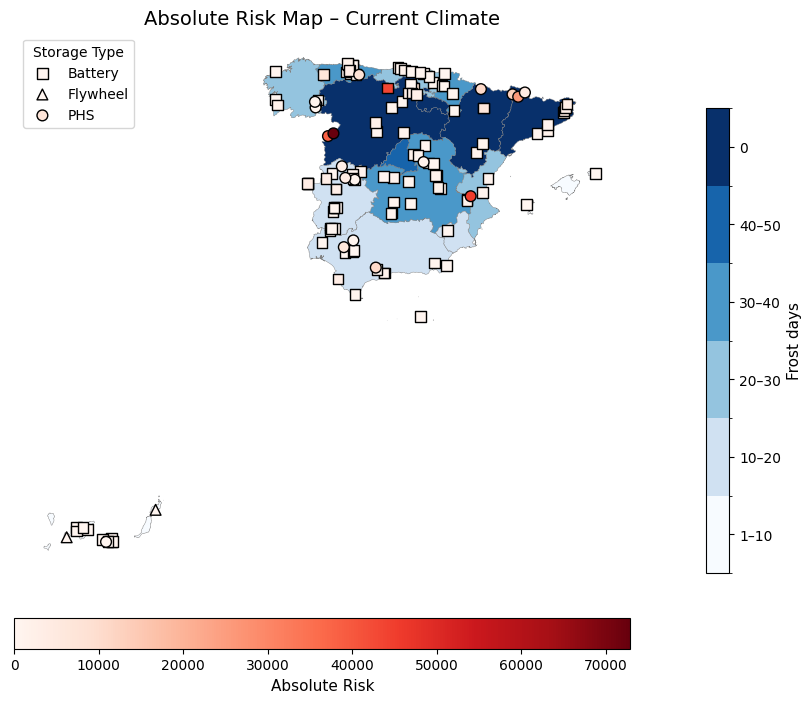

/tmp/ipython-input-3919379436.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


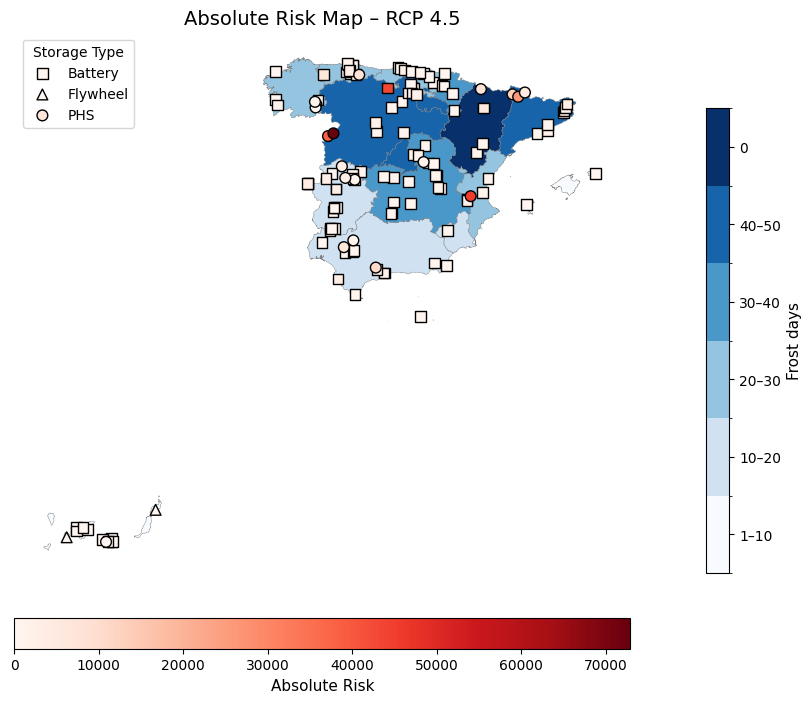

/tmp/ipython-input-3919379436.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


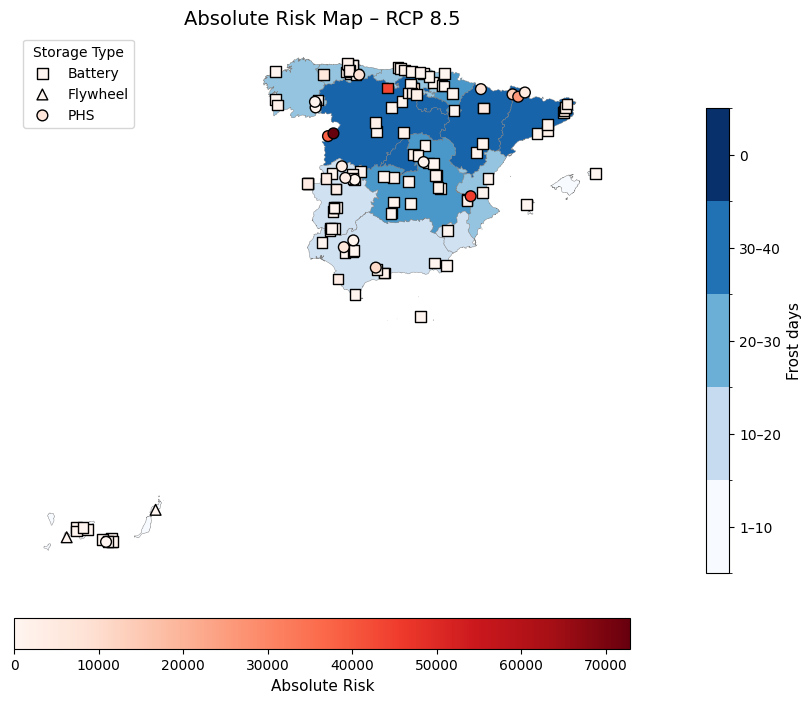

/tmp/ipython-input-3919379436.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


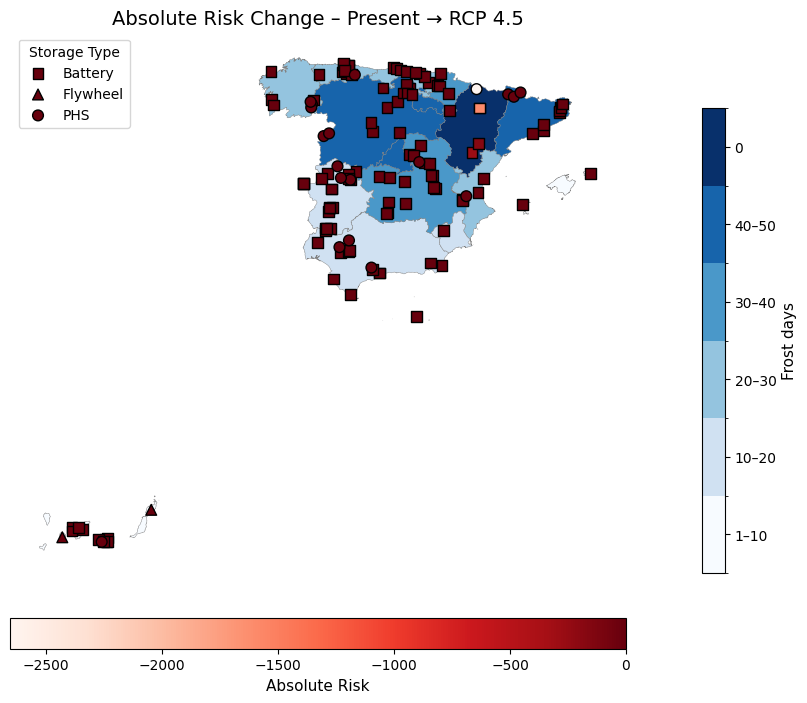

/tmp/ipython-input-3919379436.py:133: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("Blues", len(categories))


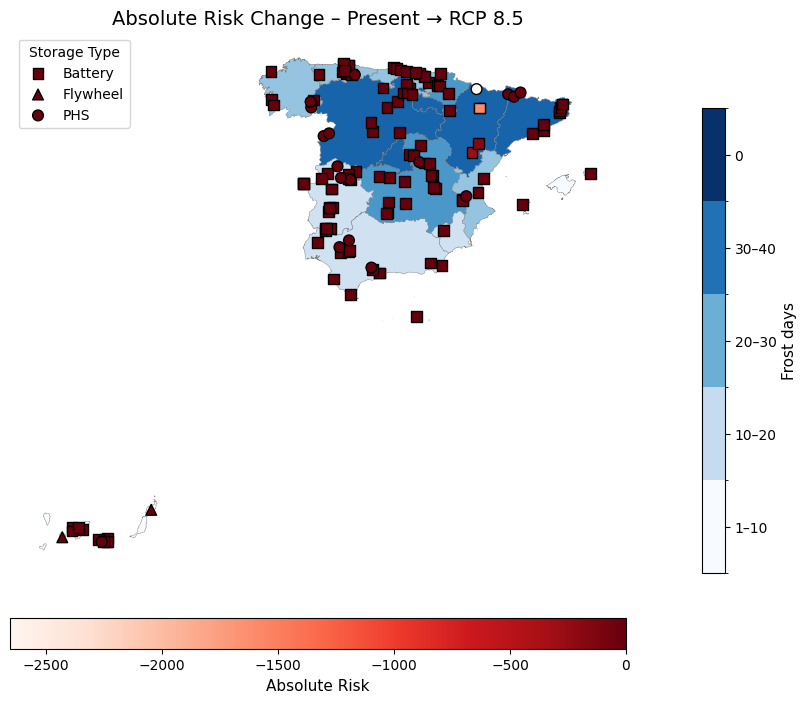

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability dry days"

HAZARDCURRENT_COL = "Dry days 1991-2020 hazard strength"
HAZARD45_COL = "Dry days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL = "Dry days 2011-2040 hazard strength RCP8.5"

DRYDAYSCURRENT_COL = "Dry days 1991-2020"
DRYDAYS45_COL = "Dry days 2011-2040 RCP4.5"
DRYDAYS85_COL = "Dry days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 1, 10, 20, 30, 40, 50]
labels = ["0", "1–10", "10–20", "20–30", "30–40", "40–50"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[DRYDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    dry_days_present_dict
)
regions_bg[DRYDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    dry_days_future45_dict
)
regions_bg[DRYDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    dry_days_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, DRYDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, DRYDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, DRYDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)


# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="Blues",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("Blues", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Consecutive dry days", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=DRYDAYSCURRENT_COL,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=DRYDAYS45_COL,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=DRYDAYS85_COL,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=DRYDAYS45_COL,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=DRYDAYS85_COL,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Dry days 1991-2020,Dry days 1991-2020 hazard strength,Vulnerability dry days,Dry days change RCP4.5,Dry days change RCP8.5,Dry days 2011-2040 RCP4.5,Dry days 2011-2040 hazard strength RCP4.5,Dry days 2011-2040 RCP8.5,Dry days 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,23.95,1,0,0.82,1.18,24.94,1,25.42,1,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,23.95,1,0,0.82,1.18,24.94,1,25.42,1,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,23.95,1,0,0.82,1.18,24.94,1,25.42,1,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,23.95,1,2,0.82,1.18,24.94,1,25.42,1,2.0,2280.00,13680.00,13680.00,13680.00,0.075412,0.075412,0.075412
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,23.95,1,2,0.82,1.18,24.94,1,25.42,1,2.0,215.00,1290.00,1290.00,1290.00,0.007111,0.007111,0.007111
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,23.95,1,2,0.82,1.18,24.94,1,25.42,1,2.0,263.00,1578.00,1578.00,1578.00,0.008699,0.008699,0.008699
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,23.95,1,0,0.82,1.18,24.94,1,25.42,1,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,16.69,1,0,0.39,0.56,16.91,1,16.84,1,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,16.69,1,0,0.39,0.56,16.91,1,16.84,1,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,16.69,1,0,0.39,0.56,16.91,1,16.84,1,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000


# Meteorological Drought Duration

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Drought.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Drought.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and data cleaning

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Drought months 1991-2020 for each region
drought_months_present_dict = {
    "Galicia": 1.9,
    "Principado de Asturias": 1.67,
    "Cantabria": 1.71,
    "País Vasco": 1.67,
    "Comunidad Foral de Navarra": 1.87,
    "La Rioja": 1.83,
    "Aragón": 2.1,
    "Cataluña": 2.0,
    "Comunitat Valenciana": 2.04,
    "Región de Murcia": 1.94,
    "Andalucía": 2.0,
    "Castilla-La Mancha": 2.06,
    "Castilla y León": 2.05,
    "Comunidad de Madrid": 2.11,
    "Extremadura": 2.14,
    "Canarias": 1.89,
    "Illes Balears": 5.9,
    "Ciudad de Ceuta": 2.09,
    "Ciudad de Melilla": 2.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 1991-2020"] = data["Region"].map(drought_months_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [-float("inf"), 1, 2, 3, float("inf")]
labels = [0, 1, 2, 3]

data['Drought months 1991-2020 hazard strength'] = pd.cut(
    data['Drought months 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_drought_months = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability drought months"] = data["Storage type"].map(vulnerability_drought_months)

In [ ]:
#Change in number of drought months from 1991-2020 to 2011-2040 RCP4.5 for each region
drought_months_change45_dict = {
    "Galicia": 0.25,
    "Principado de Asturias": 0.15,
    "Cantabria": 0.22,
    "País Vasco": 0.22,
    "Comunidad Foral de Navarra": 0.15,
    "La Rioja": 0.24,
    "Aragón": 0.24,
    "Cataluña": 0.11,
    "Comunitat Valenciana": 0.47,
    "Región de Murcia": 0.49,
    "Andalucía": 0.52,
    "Castilla-La Mancha": 0.38,
    "Castilla y León": 0.33,
    "Comunidad de Madrid": 0.29,
    "Extremadura": 0.43,
    "Canarias": 0.03,
    "Illes Balears": 0.26,
    "Ciudad de Ceuta": 0.68,
    "Ciudad de Melilla": 0.76,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months change RCP4.5"] = data["Region"].map(drought_months_change45_dict)

In [ ]:
#Change in number of drought months above 35°C from 1991-2020 to 2011-2040 RCP8.5 for each region
drought_months_change85_dict = {
    "Galicia": 0.5,
    "Principado de Asturias": 0.29,
    "Cantabria": 0.29,
    "País Vasco": 0.21,
    "Comunidad Foral de Navarra": 0.34,
    "La Rioja": 0.58,
    "Aragón": 0.55,
    "Cataluña": 0.38,
    "Comunitat Valenciana": 0.66,
    "Región de Murcia": 0.77,
    "Andalucía": 0.76,
    "Castilla-La Mancha": 0.71,
    "Castilla y León": 0.68,
    "Comunidad de Madrid": 0.64,
    "Extremadura": 0.75,
    "Canarias": 0.08,
    "Illes Balears": 0.3,
    "Ciudad de Ceuta": 0.96,
    "Ciudad de Melilla": 0.85,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months change RCP8.5"] = data["Region"].map(drought_months_change85_dict)

In [ ]:
#Drought months 2011-2040 RCP4.5 for each region
drought_months_future45_dict = {
    "Galicia": 2.05,
    "Principado de Asturias": 2.02,
    "Cantabria": 2.09,
    "País Vasco": 2.1,
    "Comunidad Foral de Navarra": 2.02,
    "La Rioja": 2.19,
    "Aragón": 2.18,
    "Cataluña": 2.06,
    "Comunitat Valenciana": 2.43,
    "Región de Murcia": 2.51,
    "Andalucía": 2.46,
    "Castilla-La Mancha": 2.31,
    "Castilla y León": 2.22,
    "Comunidad de Madrid": 2.16,
    "Extremadura": 2.24,
    "Canarias": 0.21,
    "Illes Balears": 2.11,
    "Ciudad de Ceuta": 2.58,
    "Ciudad de Melilla": 2.84,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP4.5"] = data["Region"].map(drought_months_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [-float("inf"), 1, 2, 3, float("inf")]
labels = [0, 1, 2, 3]

data["Drought months 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Drought months 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Drought months 2011-2040 RCP8.5 for each region
drought_months_future85_dict = {
    "Galicia": 2.32,
    "Principado de Asturias": 2.20,
    "Cantabria": 2.2,
    "País Vasco": 2.13,
    "Comunidad Foral de Navarra": 2.31,
    "La Rioja": 2.48,
    "Aragón": 2.48,
    "Cataluña": 2.31,
    "Comunitat Valenciana": 2.61,
    "Región de Murcia": 2.73,
    "Andalucía": 2.67,
    "Castilla-La Mancha": 2.65,
    "Castilla y León": 2.5,
    "Comunidad de Madrid": 2.55,
    "Extremadura": 2.63,
    "Canarias": 0.28,
    "Illes Balears": 2.1,
    "Ciudad de Ceuta": 2.73,
    "Ciudad de Melilla": 2.88,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Drought months 2011-2040 RCP8.5"] = data["Region"].map(drought_months_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [-float("inf"), 1, 2, 3, float("inf")]
labels = [0, 1, 2, 3]

data["Drought months 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Drought months 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Drought months 1991-2020 hazard strength',
    'Drought months 2011-2040 hazard strength RCP4.5',
    'Drought months 2011-2040 hazard strength RCP8.5',
    'Vulnerability drought months',
    'Drought months 1991-2020',
    'Drought months 2011-2040 RCP4.5',
    'Drought months 2011-2040 RCP8.5',
    'Drought months change RCP4.5',
    'Drought months change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

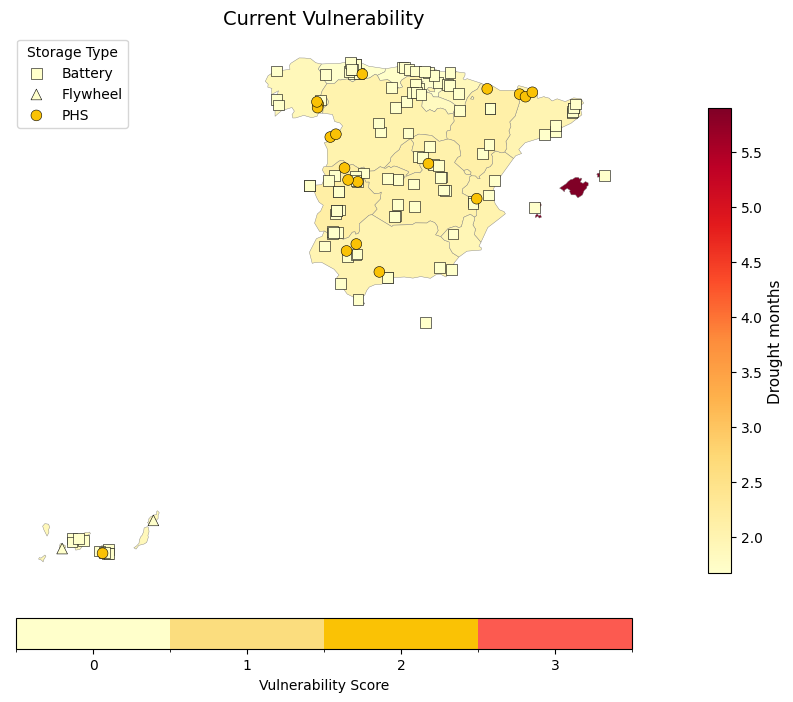

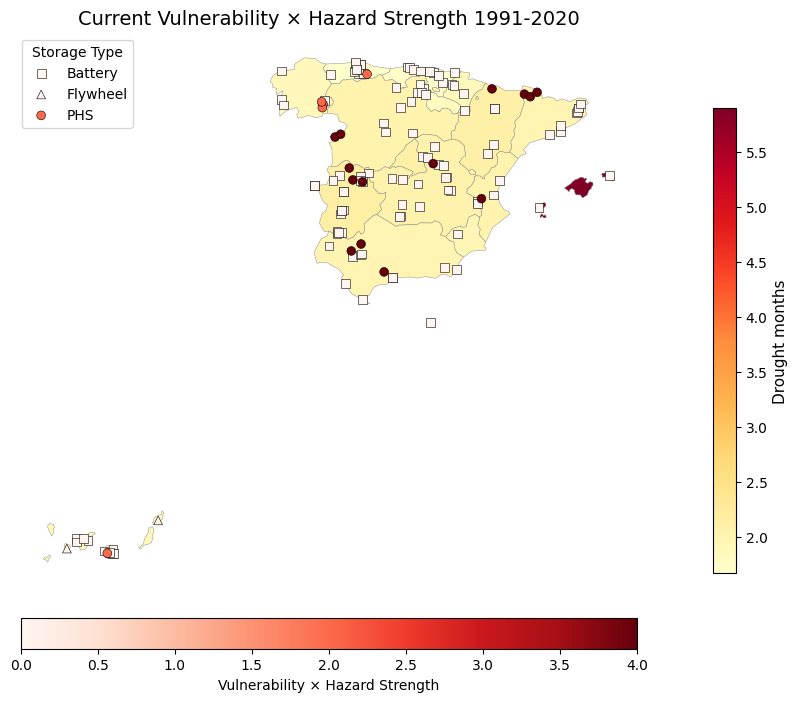

In [ ]:
#CURRENT VULNERABILITY

# =========================
# Configuration
# =========================
# Ensure HOTDAYSCURRENT_COL and other necessary config variables are defined
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability drought months"
HAZARDCURRENT_COL = "Drought months 1991-2020 hazard strength"
DROUGHTMONTHSCURRENT_COL = "Drought months 1991-2020"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [0, 1, 1.5, 2, 2.5, 3]
    labels = ["≤1", "≤1.5", "≤2", "≤2.5", "≤3"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[DROUGHTMONTHSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    drought_months_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, DROUGHTMONTHSCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------
def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Drought months", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Drought months", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_49, ax_49 = plot_current_optionA(
    bg_col=DROUGHTMONTHSCURRENT_COL,
    title="Current Vulnerability"
)

fig_50, ax_50 = plot_current_optionB(
    bg_col=DROUGHTMONTHSCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_49, "Current Vulnerability drought months.jpg")
save_figure(fig_50, "Current Vulnerability × Hazard Strength 1991-2020 drought months.jpg")

Saved: Current Vulnerability drought months.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 drought months.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

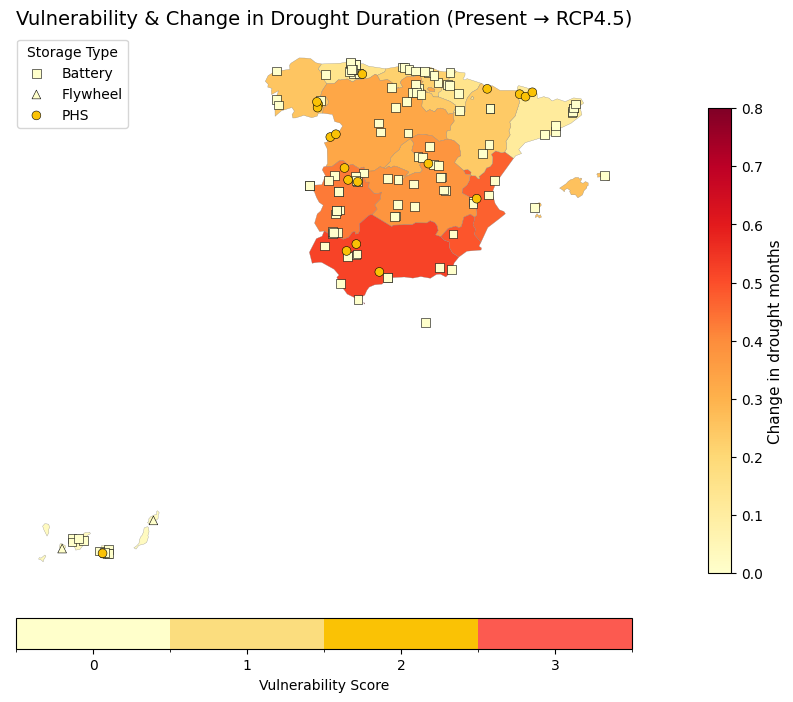

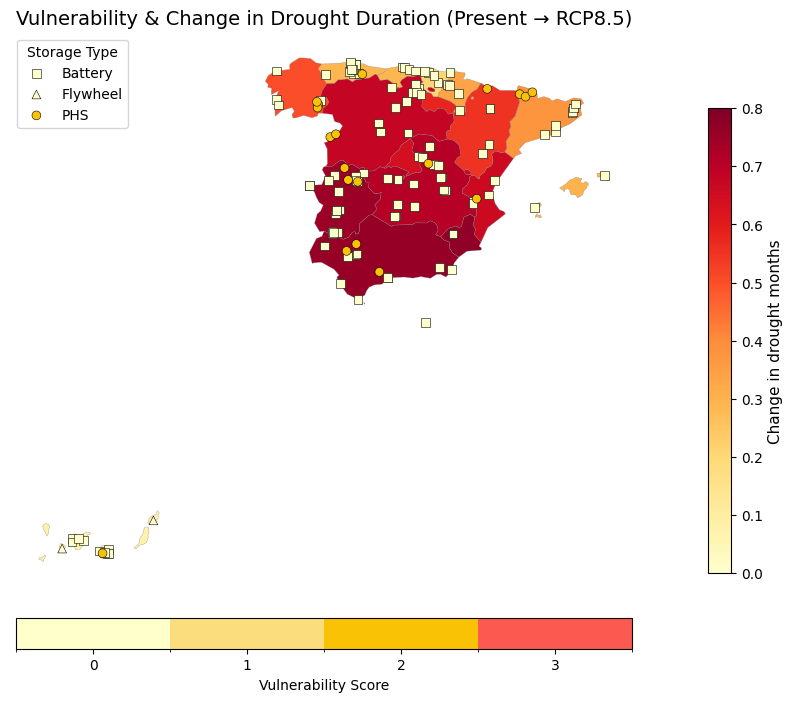

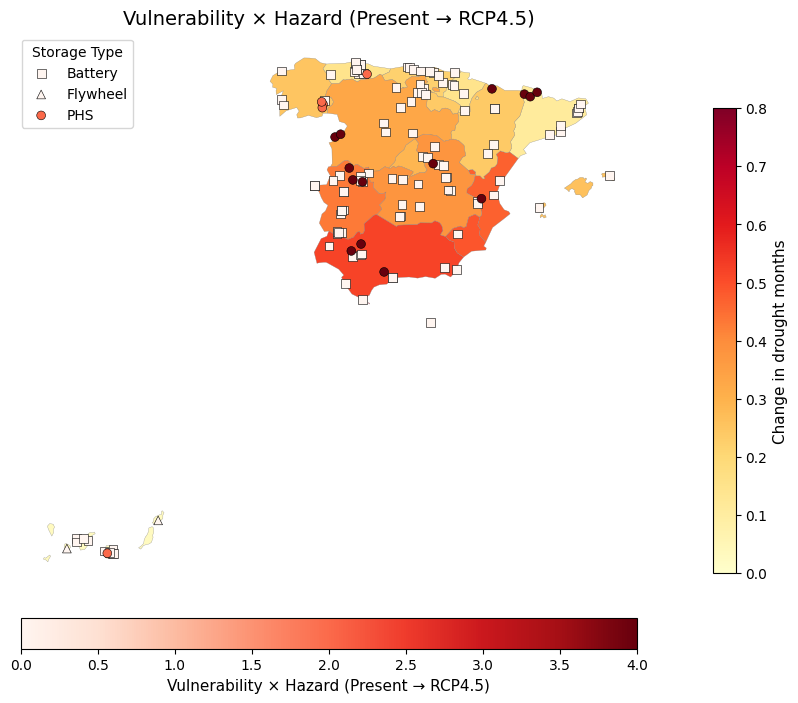

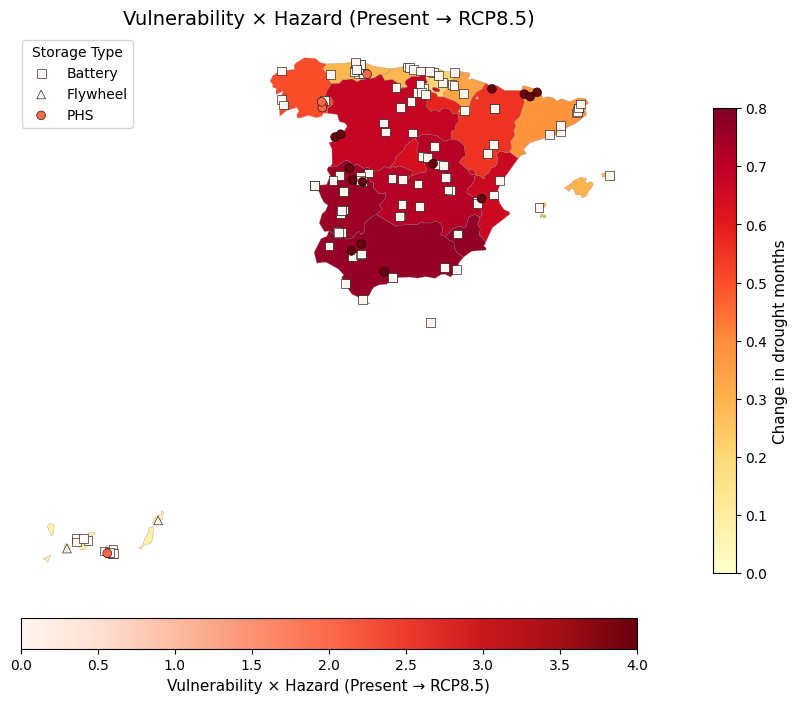

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS (HOT DAYS >35C)
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability drought months"

DROUGHTMONTHS_CHANGE45 = "Drought months change RCP4.5"
DROUGHTMONTHS_CHANGE85 = "Drought months change RCP8.5"
HAZARDCURRENT_COL = "Drought months 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[DROUGHTMONTHS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    drought_months_change45_dict
)
regions_bg[DROUGHTMONTHS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    drought_months_change85_dict
)

# =========================================================
# Discrete vulnerability colormap (unchanged)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")
    norm_bg = mcolors.Normalize(vmin=0, vmax=0.8)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in drought months", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )

      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colorbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_51, ax_51 = plot_step5_optionA(
    DROUGHTMONTHS_CHANGE45,
    "Vulnerability & Change in Drought Duration (Present → RCP4.5)"
)

fig_52, ax_52 = plot_step5_optionA(
    DROUGHTMONTHS_CHANGE85,
    "Vulnerability & Change in Drought Duration (Present → RCP8.5)"
)
#I don't think I need these
fig_53, ax_53 = plot_step5_optionB(
    DROUGHTMONTHS_CHANGE45,
    "Vulnerability × Hazard (Present → RCP4.5)"
)

fig_54, ax_54 = plot_step5_optionB(
    DROUGHTMONTHS_CHANGE85,
    "Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_51, "Vulnerability & Change in drought months (Present → RCP4.5).jpg")
save_figure(fig_52, "Vulnerability & Change in drought months (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in drought months (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in drought months (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

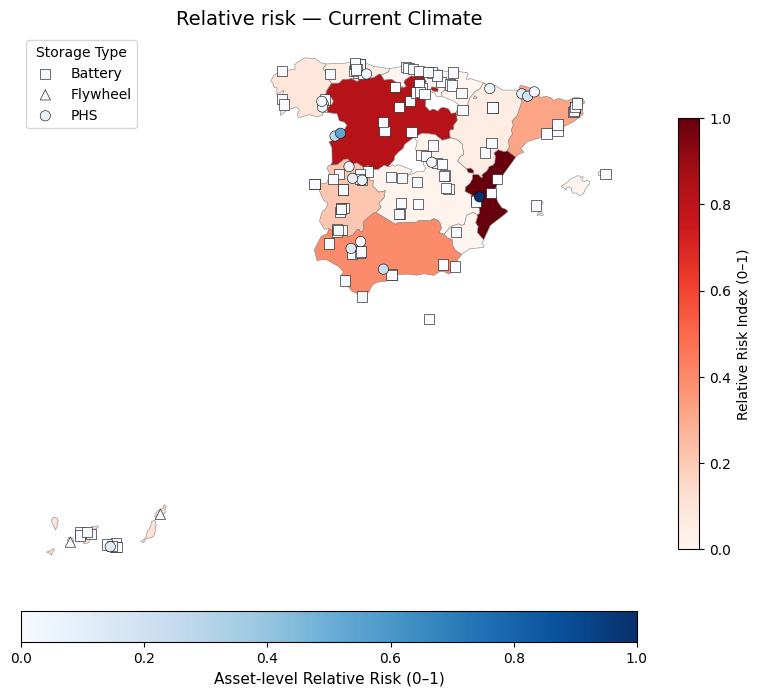

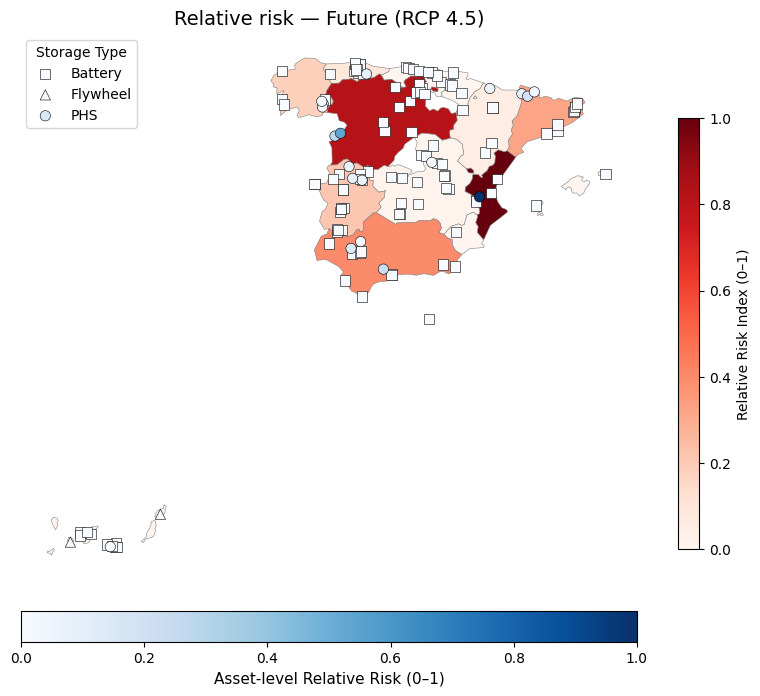

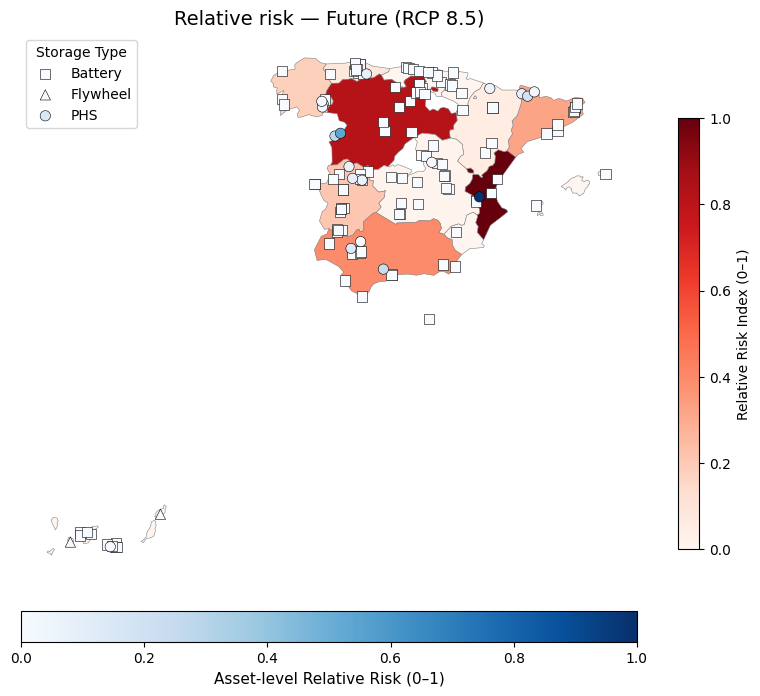

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability drought months"

HAZARDCURRENT_COL = "Drought months 1991-2020 hazard strength"
HAZARD45_COL     = "Drought months 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Drought months 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_55, ax_55 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_56, ax_56 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_57, ax_57 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_55, "Relative risk — Current Climate.jpg")
save_figure(fig_56, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_57, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

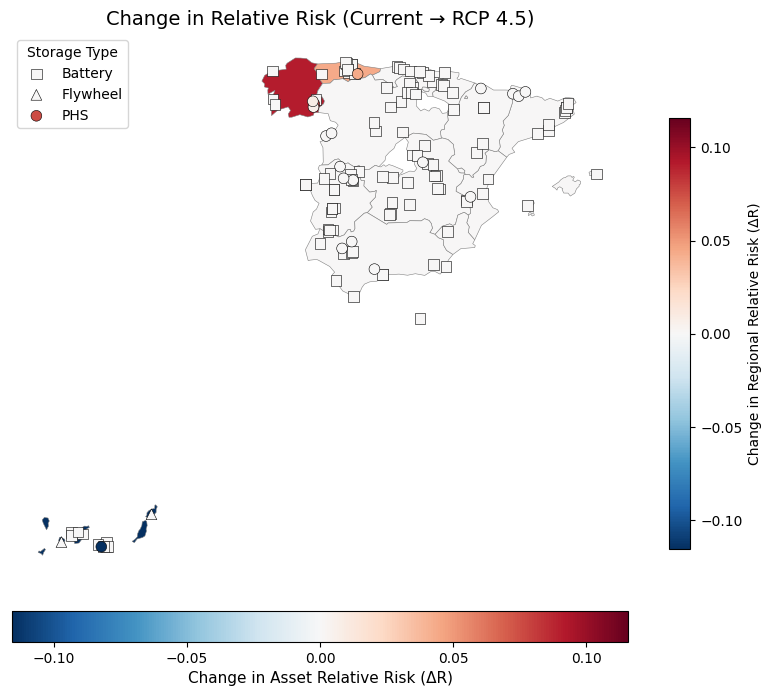

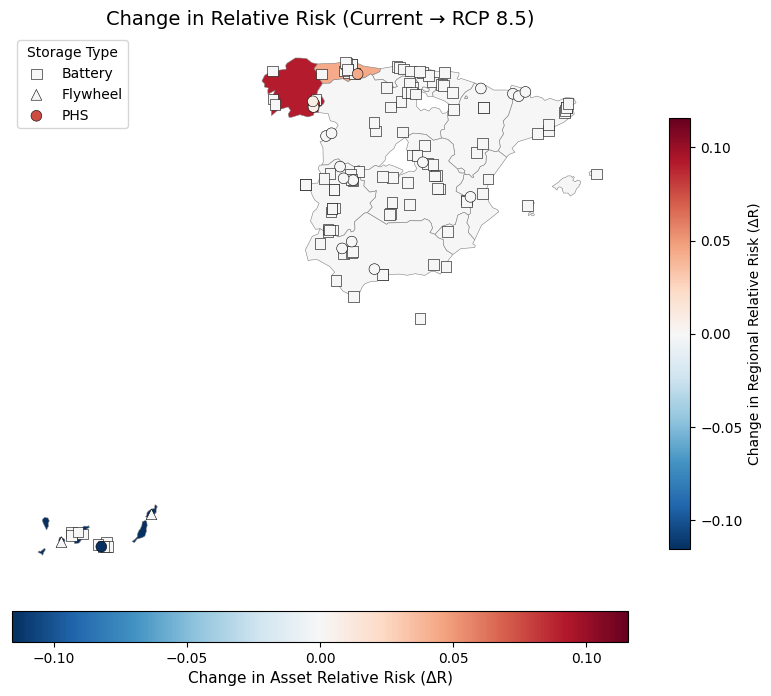

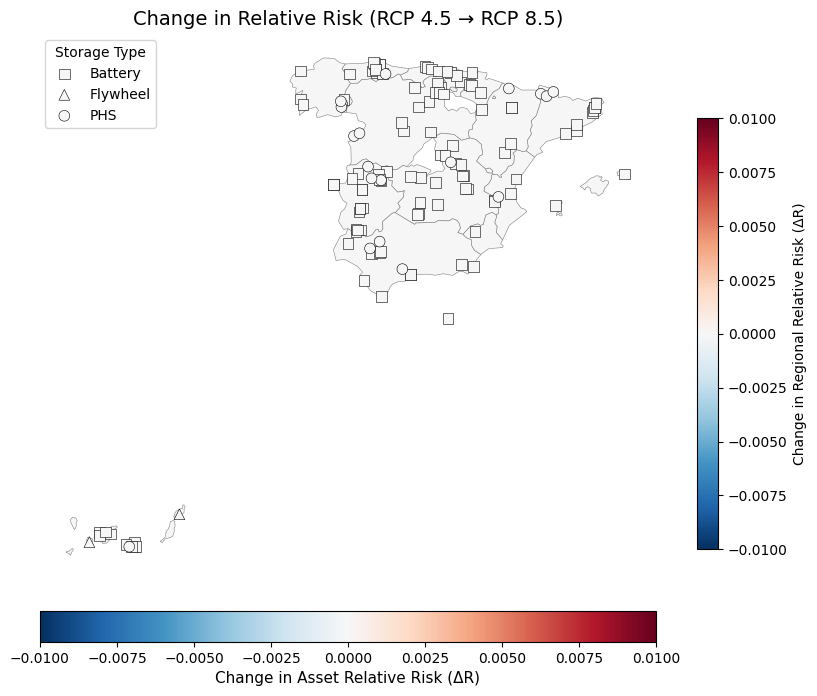

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_58, ax_58 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_59, ax_59 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_60, ax_60 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_58, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_59, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_60, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Comunitat Valenciana,181404.00,181404.00,181404.00,1.000000,1.000000,1.000000,0.000000,0.000000,0.0
1,Castilla y León,148620.00,148620.00,148620.00,0.819276,0.819276,0.819276,0.000000,0.000000,0.0
2,Andalucía,71596.80,71596.80,71596.80,0.394681,0.394681,0.394681,0.000000,0.000000,0.0
3,Cataluña,58440.00,58440.00,58440.00,0.322154,0.322154,0.322154,0.000000,0.000000,0.0
4,Extremadura,38906.88,38906.88,38906.88,0.214476,0.214476,0.214476,0.000000,0.000000,0.0
5,Canarias,21000.00,0.00,0.00,0.115764,0.000000,0.000000,-0.115764,-0.115764,0.0
6,Galicia,16548.00,33096.00,33096.00,0.091222,0.182444,0.182444,0.091222,0.091222,0.0
7,Aragón,10620.00,10620.00,10620.00,0.058543,0.058543,0.058543,0.000000,0.000000,0.0
8,Principado de Asturias,7980.00,15960.00,15960.00,0.043990,0.087980,0.087980,0.043990,0.043990,0.0
9,Castilla-La Mancha,2640.00,2640.00,2640.00,0.014553,0.014553,0.014553,0.000000,0.000000,0.0


In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability drought months"

HAZARDCURRENT_COL = "Heatwave days 1991-2020 hazard strength"
HAZARD45_COL = "Heatwave days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL = "Heatwave days 2011-2040 hazard strength RCP8.5"

HEATWAVEDAYSCURRENT_COL = "Heatwave days 1991-2020"
HEATWAVEDAYS45_COL = "Heatwave days 2011-2040 RCP4.5"
HEATWAVEDAYS85_COL = "Heatwave days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 1, 5, 10, 15]
labels = ["0", "≤5", "≤10", "≤15"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[HEATWAVEDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_present_dict
)
regions_bg[HEATWAVEDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future45_dict
)
regions_bg[HEATWAVEDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    heatwave_days_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, HEATWAVEDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)


# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="Blues",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("Blues", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Heatwave days", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYSCURRENT_COL,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS45_COL,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS85_COL,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS45_COL,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=HEATWAVEDAYS85_COL,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


NameError: name 'heatwave_days_present_dict' is not defined

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data

,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Drought months 1991-2020,Drought months 1991-2020 hazard strength,Vulnerability drought months,Drought months change RCP4.5,Drought months change RCP8.5,Drought months 2011-2040 RCP4.5,Drought months 2011-2040 hazard strength RCP4.5,Drought months 2011-2040 RCP8.5,Drought months 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,1.90,1,0,0.25,0.50,2.05,2,2.32,2,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,1.90,1,0,0.25,0.50,2.05,2,2.32,2,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,1.90,1,0,0.25,0.50,2.05,2,2.32,2,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,1.90,1,2,0.25,0.50,2.05,2,2.32,2,2.0,2280.00,13680.00,27360.00,27360.00,0.075412,0.150824,0.150824
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,1.90,1,2,0.25,0.50,2.05,2,2.32,2,2.0,215.00,1290.00,2580.00,2580.00,0.007111,0.014222,0.014222
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,1.90,1,2,0.25,0.50,2.05,2,2.32,2,2.0,263.00,1578.00,3156.00,3156.00,0.008699,0.017398,0.017398
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,1.90,1,0,0.25,0.50,2.05,2,2.32,2,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,1.67,1,0,0.15,0.29,2.02,2,2.20,2,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,1.67,1,0,0.15,0.29,2.02,2,2.20,2,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,1.67,1,0,0.15,0.29,2.02,2,2.20,2,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000


# Extreme Precipitation Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Extreme precipitation.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Extreme precipitation.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Extreme precipitation days above 1991-2020 for each region
extprecip_days_present_dict = {
    "Galicia": 7.42,
    "Principado de Asturias": 8.84,
    "Cantabria": 8.56,
    "País Vasco": 8.15,
    "Comunidad Foral de Navarra": 6.7,
    "La Rioja": 6.45,
    "Aragón": 5.02,
    "Cataluña": 5.2,
    "Comunitat Valenciana": 3.71,
    "Región de Murcia": 2.97,
    "Andalucía": 3.6,
    "Castilla-La Mancha": 4.22,
    "Castilla y León": 5.69,
    "Comunidad de Madrid": 4.54,
    "Extremadura": 3.98,
    "Canarias": 1.85,
    "Illes Balears": 3.47,
    "Ciudad de Melilla": 3.91,
    "Ciudad de Melilla": 2.87,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 1991-2020"] = data["Region"].map(extprecip_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data['Extreme precipitation days 1991-2020 hazard strength'] = pd.cut(
    data['Extreme precipitation days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_extprecip_days = {
    "Battery": 1,
    "PHS": 1,
    "Flywheel": 0
}

data["Vulnerability extreme precipitation"] = data["Storage type"].map(vulnerability_extprecip_days)

In [ ]:
#Change in number of extreme precipitation days from 1991-2020 to 2011-2040 RCP4.5 for each region
extprecip_days_change45_dict = {
    "Galicia": 0.12,
    "Principado de Asturias": 0.3,
    "Cantabria": 0.33,
    "País Vasco": 0.29,
    "Comunidad Foral de Navarra": 0.35,
    "La Rioja": 0.06,
    "Aragón": -0.2,
    "Cataluña": 0.09,
    "Comunitat Valenciana": -0.19,
    "Región de Murcia": 0.0,
    "Andalucía": -0.1,
    "Castilla-La Mancha": -0.03,
    "Castilla y León": 0.16,
    "Comunidad de Madrid": 0.25,
    "Extremadura": 0.01,
    "Canarias": 0.0,
    "Illes Balears": 0.1,
    "Ciudad de Ceuta": -0.19,
    "Ciudad de Melilla": -0.22,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days change RCP4.5"] = data["Region"].map(extprecip_days_change45_dict)

In [ ]:
#Change in number of extreme precipitation days from 1991-2020 to 2011-2040 RCP8.5 for each region
extprecip_days_change85_dict = {
    "Galicia": -0.02,
    "Principado de Asturias": -0.17,
    "Cantabria": -0.04,
    "País Vasco": -0.11,
    "Comunidad Foral de Navarra": -0.18,
    "La Rioja": -0.43,
    "Aragón": -0.08,
    "Cataluña": 0.0,
    "Comunitat Valenciana": -0.21,
    "Región de Murcia": -0.12,
    "Andalucía": -0.23,
    "Castilla-La Mancha": -0.07,
    "Castilla y León": -0.16,
    "Comunidad de Madrid": -0.03,
    "Extremadura": -0.23,
    "Canarias": -0.01,
    "Illes Balears": -0.13,
    "Ciudad de Ceuta": -0.6,
    "Ciudad de Melilla": -0.4,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days change RCP8.5"] = data["Region"].map(extprecip_days_change85_dict)

In [ ]:
#Extreme precipitation days 2011-2040 RCP4.5 for each region
extprecip_days_future45_dict = {
    "Galicia": 7.44,
    "Principado de Asturias": 8.99,
    "Cantabria": 8.73,
    "País Vasco": 8.33,
    "Comunidad Foral de Navarra": 6.97,
    "La Rioja": 6.42,
    "Aragón": 4.97,
    "Cataluña": 5.28,
    "Comunitat Valenciana": 3.56,
    "Región de Murcia": 2.97,
    "Andalucía": 3.53,
    "Castilla-La Mancha": 4.21,
    "Castilla y León": 5.79,
    "Comunidad de Madrid": 4.77,
    "Extremadura": 4.0,
    "Canarias": 0.11,
    "Illes Balears": 3.35,
    "Ciudad de Ceuta": 3.79,
    "Ciudad de Melilla": 2.7,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP4.5"] = data["Region"].map(extprecip_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data["Extreme precipitation days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Extreme precipitation days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Extreme precipitation days 2011-2040 RCP8.5 for each region
extprecip_days_future85_dict = {
    "Galicia": 7.31,
    "Principado de Asturias": 8.54,
    "Cantabria": 8.37,
    "País Vasco": 7.93,
    "Comunidad Foral de Navarra": 4.93,
    "La Rioja": 5.94,
    "Aragón": 4.93,
    "Cataluña": 5.22,
    "Comunitat Valenciana": 3.55,
    "Región de Murcia": 2.87,
    "Andalucía": 3.4,
    "Castilla-La Mancha": 4.17,
    "Castilla y León": 5.48,
    "Comunidad de Madrid": 4.5,
    "Extremadura": 3.76,
    "Canarias": 0.1,
    "Illes Balears": 3.33,
    "Ciudad de Ceuta": 3.37,
    "Ciudad de Melilla": 2.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Extreme precipitation days 2011-2040 RCP8.5"] = data["Region"].map(extprecip_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 1, 5, 10, float("inf")]
labels = [0, 1, 2, 3]

data["Extreme precipitation days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Extreme precipitation days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Extreme precipitation days 1991-2020 hazard strength',
    'Extreme precipitation days 2011-2040 hazard strength RCP4.5',
    'Extreme precipitation days 2011-2040 hazard strength RCP8.5',
    'Vulnerability extreme precipitation',
    'Extreme precipitation days 1991-2020',
    'Extreme precipitation days 2011-2040 RCP4.5',
    'Extreme precipitation days 2011-2040 RCP8.5',
    'Extreme precipitation days change RCP4.5',
    'Extreme precipitation days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

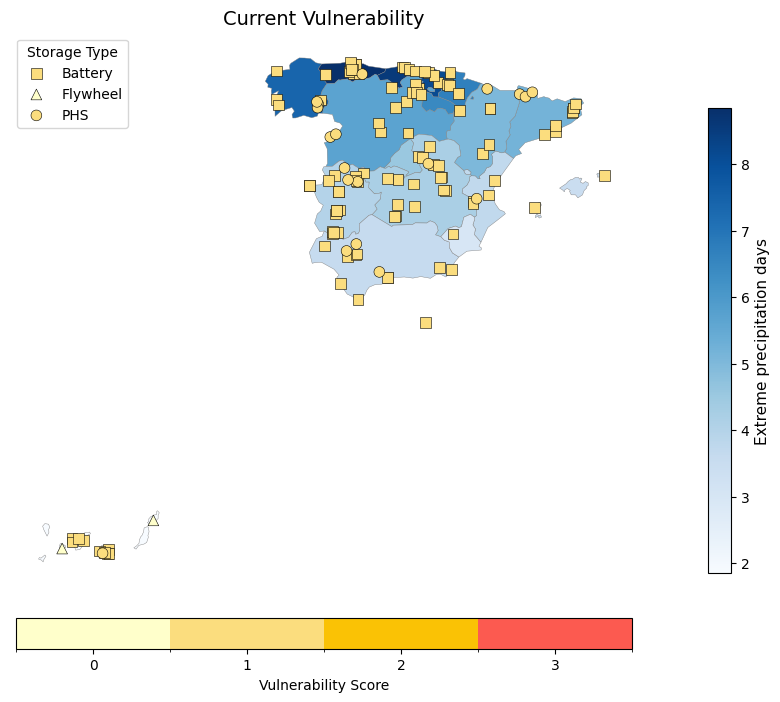

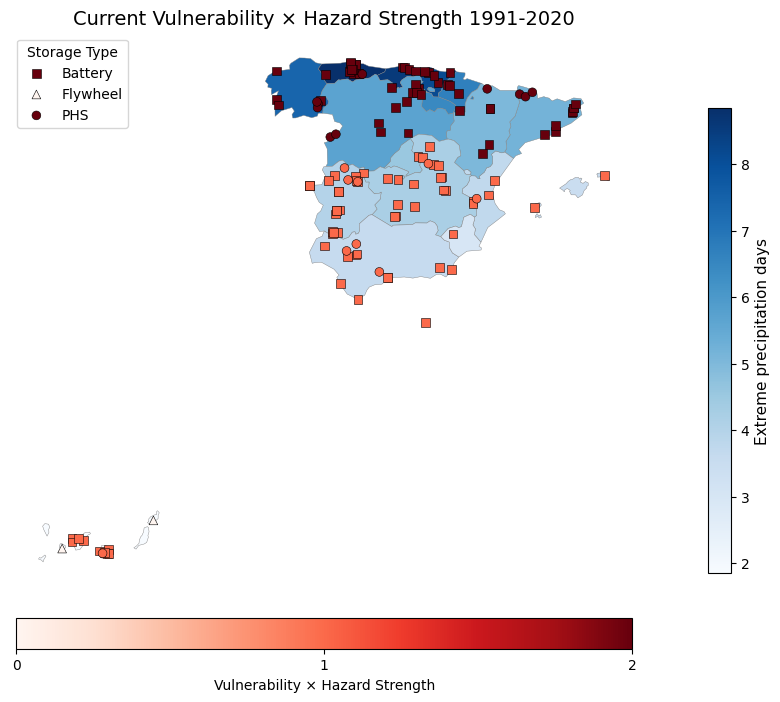

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability extreme precipitation"
HAZARDCURRENT_COL = "Extreme precipitation days 1991-2020 hazard strength"
EXTPRECIPCURRENT_COL = "Extreme precipitation days 1991-2020"

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [0, 1, 5, 10]
    labels = ["≤1", "≤5", "≤10"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[EXTPRECIPCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    extprecip_days_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, EXTPRECIPCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Extreme precipitation days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Extreme precipitation days", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, ticks=[0, 1, 2]).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_61, ax_61 = plot_current_optionA(
    bg_col=EXTPRECIPCURRENT_COL,
    title="Current Vulnerability"
)

fig_62, ax_62 = plot_current_optionB(
    bg_col=EXTPRECIPCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_61, "Current Vulnerability extreme precipitation.jpg")
save_figure(fig_62, "Current Vulnerability × Hazard Strength 1991-2020 extreme precipitation.jpg")

Saved: Current Vulnerability extreme precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 extreme precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

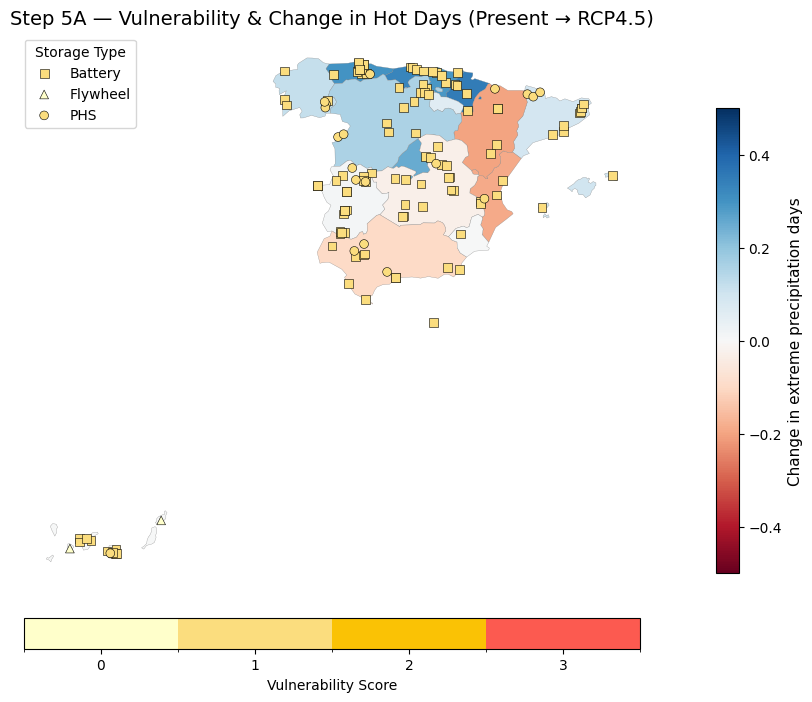

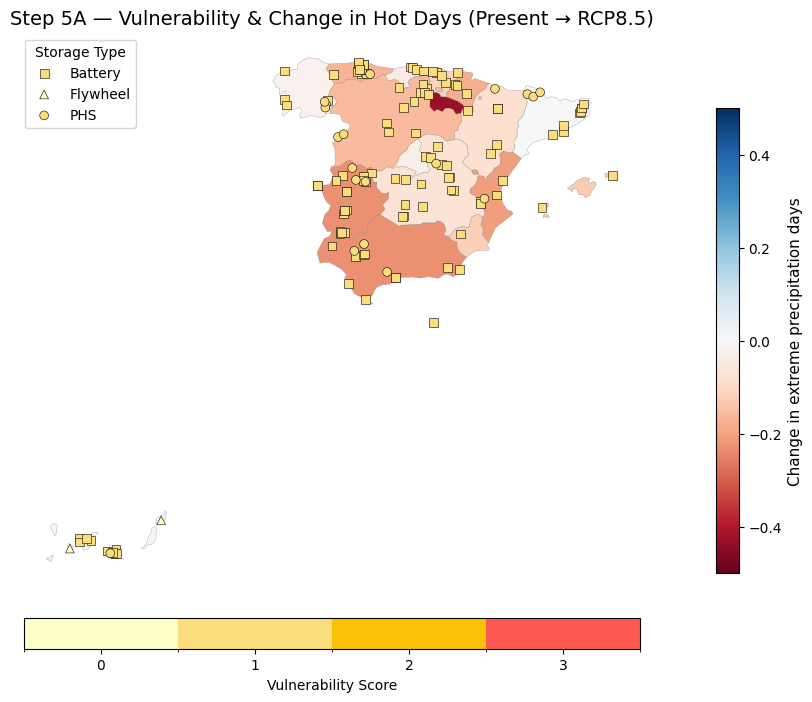

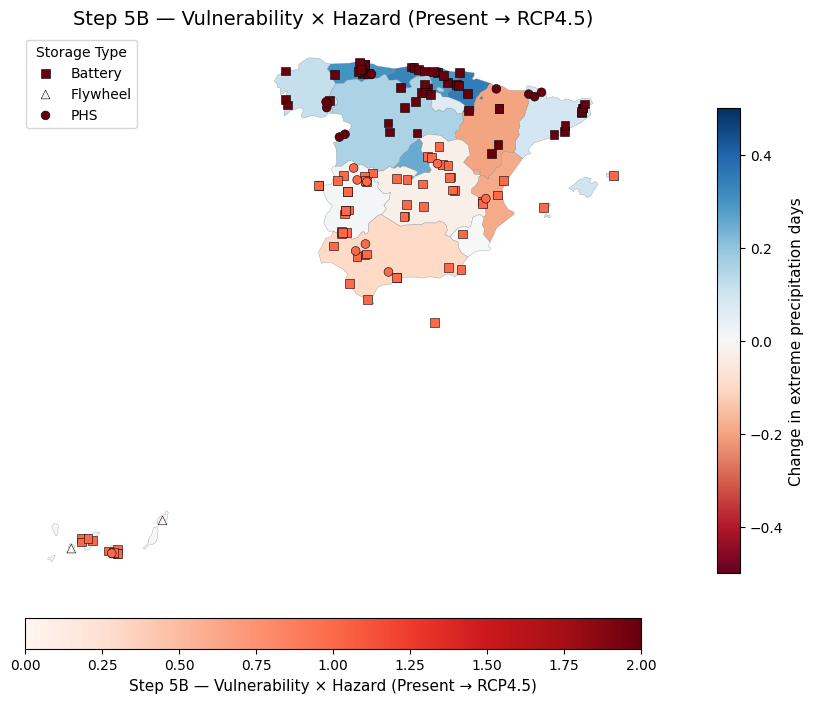

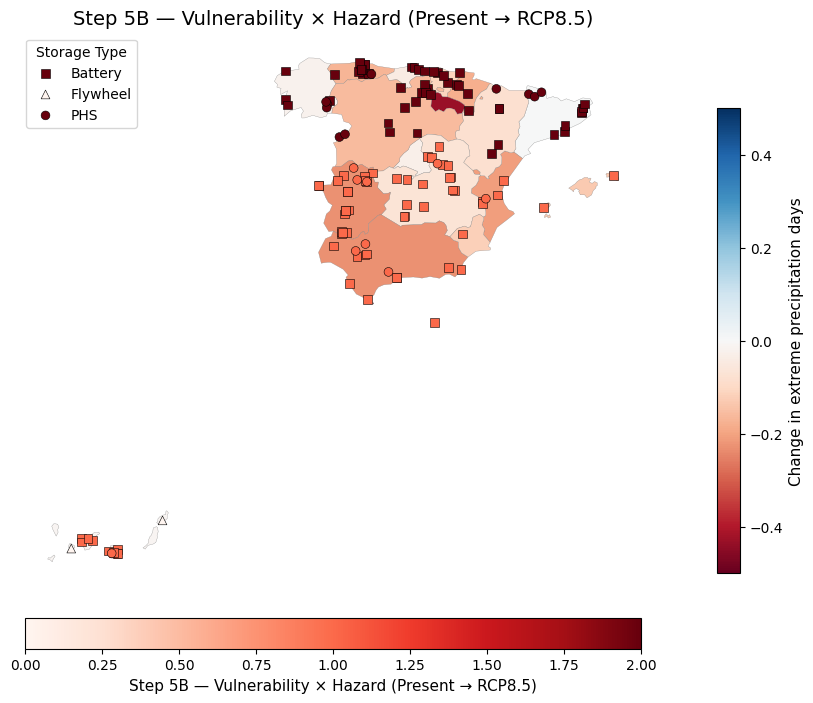

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability extreme precipitation"

EXTPRECIP_CHANGE45 = "Extreme precipitation days change RCP4.5"
EXTPRECIP_CHANGE85 = "Extreme precipitation days change RCP8.5"
EXTPRECIPCURRENT_COL = "Extreme precipitation days 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[EXTPRECIP_CHANGE45] = regions_bg["NUTS_NAME"].map(
    extprecip_days_change45_dict
)
regions_bg[EXTPRECIP_CHANGE85] = regions_bg["NUTS_NAME"].map(
    extprecip_days_change85_dict
)

# =========================================================
# Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("RdBu")
    norm_bg = mcolors.Normalize(vmin=-0.5, vmax=0.5)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in extreme precipitation days", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )

      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colorbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_63, ax_63 = plot_step5_optionA(
    EXTPRECIP_CHANGE45,
    "Step 5A — Vulnerability & Change in Hot Days (Present → RCP4.5)"
)

fig_64, ax_64 = plot_step5_optionA(
    EXTPRECIP_CHANGE85,
    "Step 5A — Vulnerability & Change in Hot Days (Present → RCP8.5)"
)
#I don't think I need these
fig_65, ax_66 = plot_step5_optionB(
    EXTPRECIP_CHANGE45,
    "Step 5B — Vulnerability × Hazard (Present → RCP4.5)"
)

fig_66, ax_66 = plot_step5_optionB(
    EXTPRECIP_CHANGE85,
    "Step 5B — Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_63, "Vulnerability & Change in extreme precipitation days (Present → RCP4.5).jpg")
save_figure(fig_64, "Vulnerability & Change in extreme precipitation days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in extreme precipitation days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in extreme precipitation days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

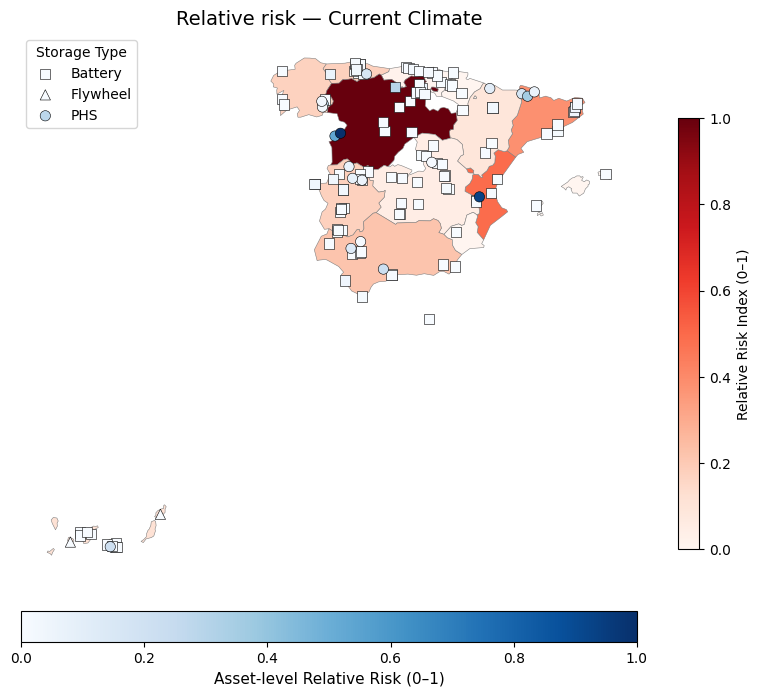

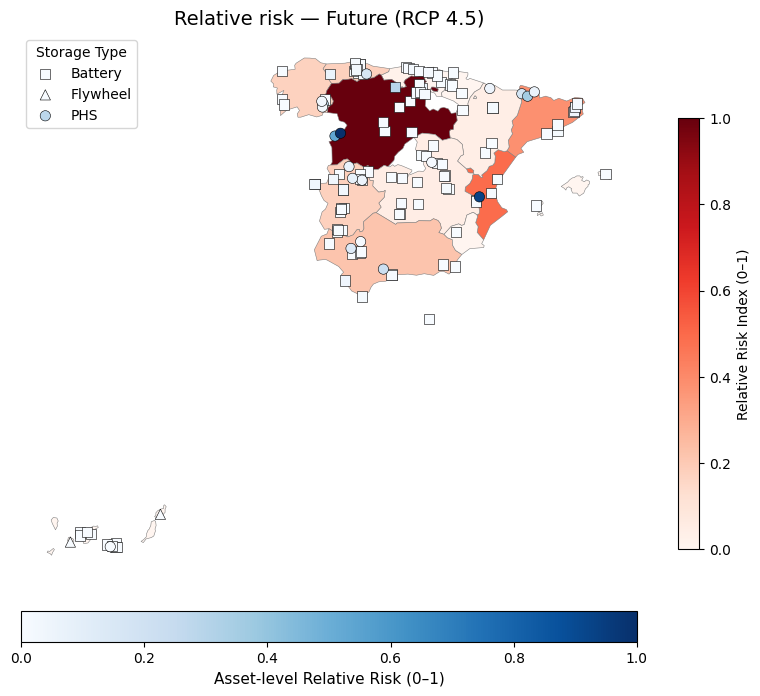

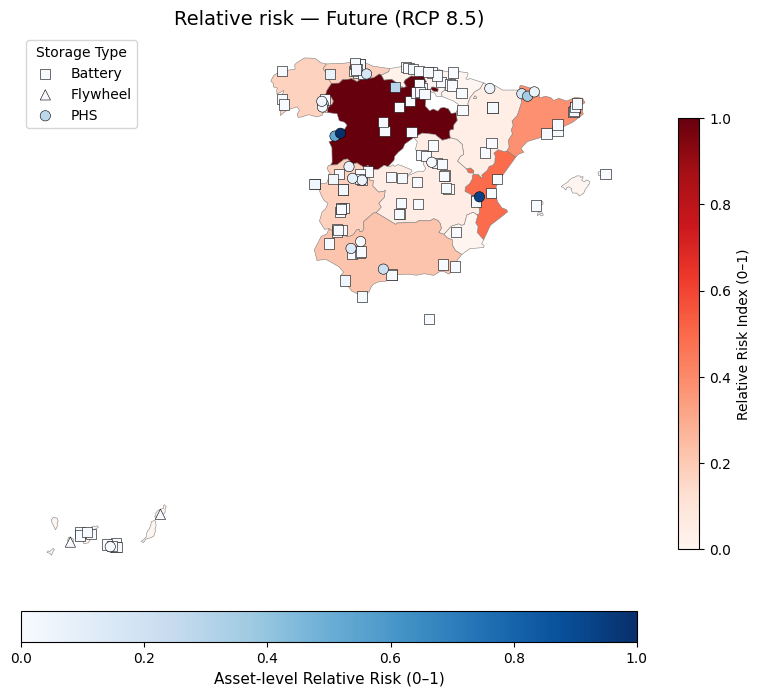

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability extreme precipitation"

HAZARDCURRENT_COL = "Extreme precipitation days 1991-2020 hazard strength"
HAZARD45_COL     = "Extreme precipitation days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Extreme precipitation days 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_67, ax_67 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_68, ax_68 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_69, ax_69 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_67, "Relative risk — Current Climate.jpg")
save_figure(fig_68, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_69, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

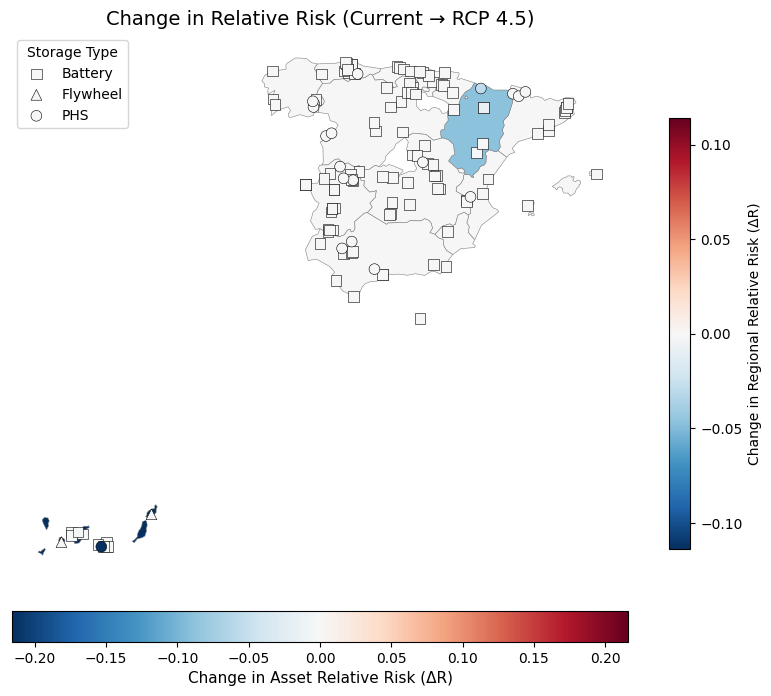

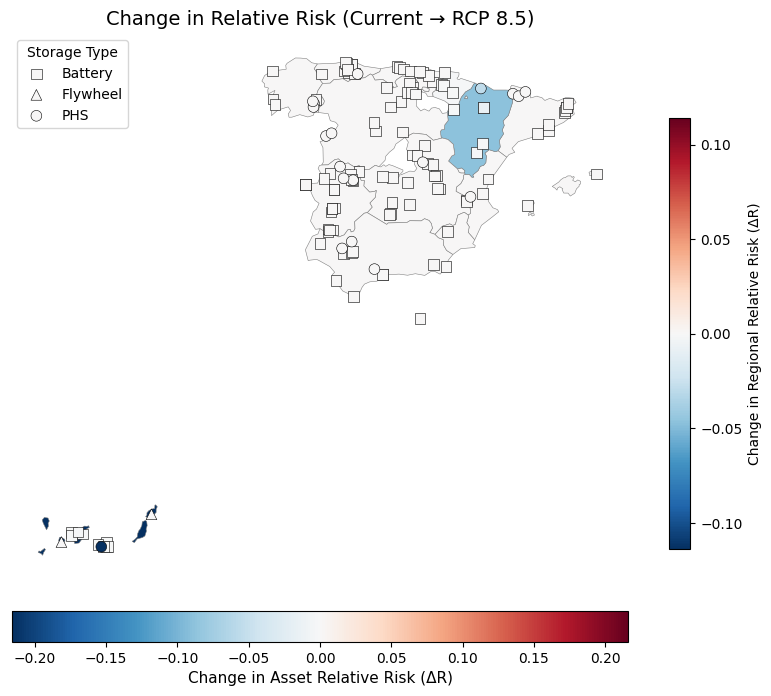

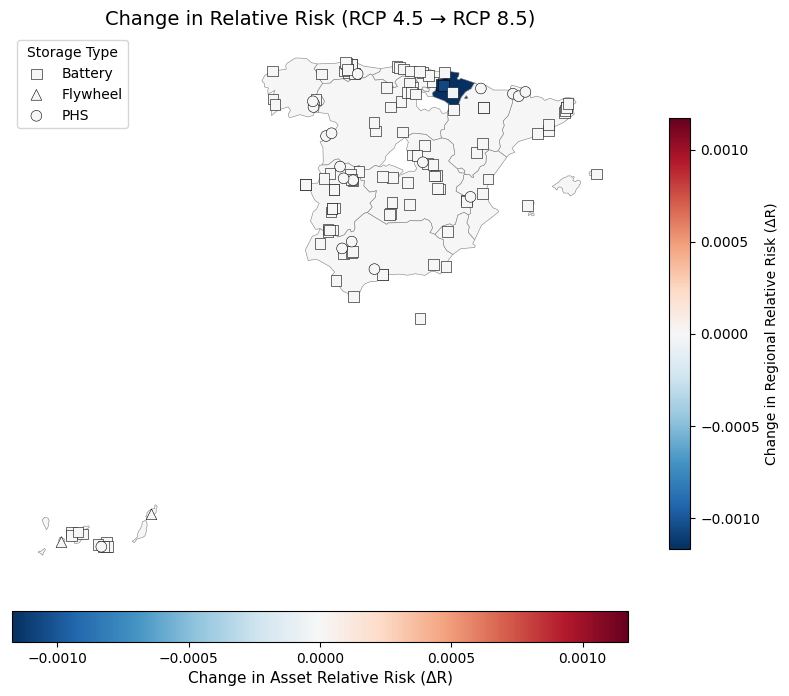

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_70, ax_70 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_71, ax_71 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_72, ax_72 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_70, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_71, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_72, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Castilla y León,95785.60,95785.60,95785.60,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
1,Comunitat Valenciana,47257.20,47257.20,47257.20,0.493346,0.493364,0.493364,0.000018,0.000018,0.000000
2,Cataluña,36426.80,36426.80,36426.80,0.380273,0.380295,0.380295,0.000022,0.000022,0.000000
3,Andalucía,21116.98,21116.98,21116.98,0.220433,0.220461,0.220461,0.000028,0.000028,0.000000
4,Principado de Asturias,17035.64,17035.64,17035.64,0.177823,0.177852,0.177852,0.000029,0.000029,0.000000
5,Extremadura,16855.24,16855.24,16855.24,0.175939,0.175968,0.175968,0.000029,0.000029,0.000000
6,Galicia,16754.00,16754.00,16754.00,0.174882,0.174911,0.174911,0.000029,0.000029,0.000000
7,Canarias,10920.58,0.00,0.00,0.113979,0.000000,0.000000,-0.113979,-0.113979,0.000000
8,Aragón,8966.00,4483.00,4483.00,0.093573,0.046802,0.046802,-0.046770,-0.046770,0.000000
9,Castilla-La Mancha,4656.72,4656.72,4656.72,0.048582,0.048616,0.048616,0.000034,0.000034,0.000000


/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


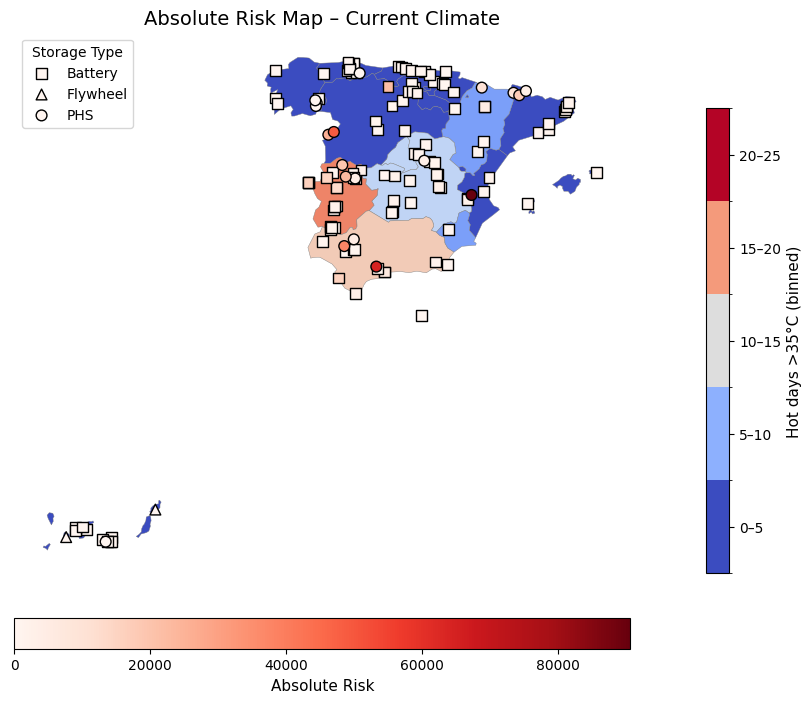

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


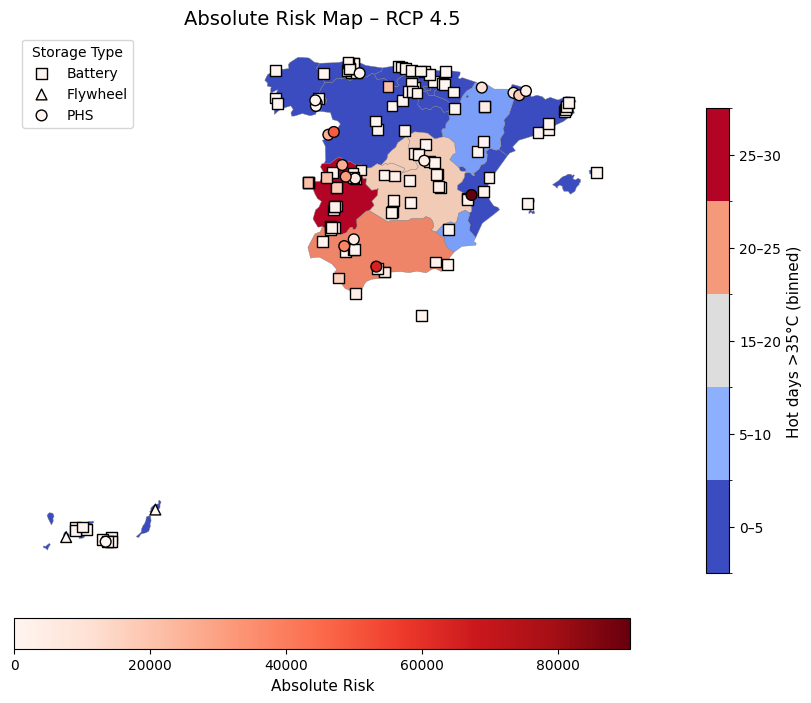

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


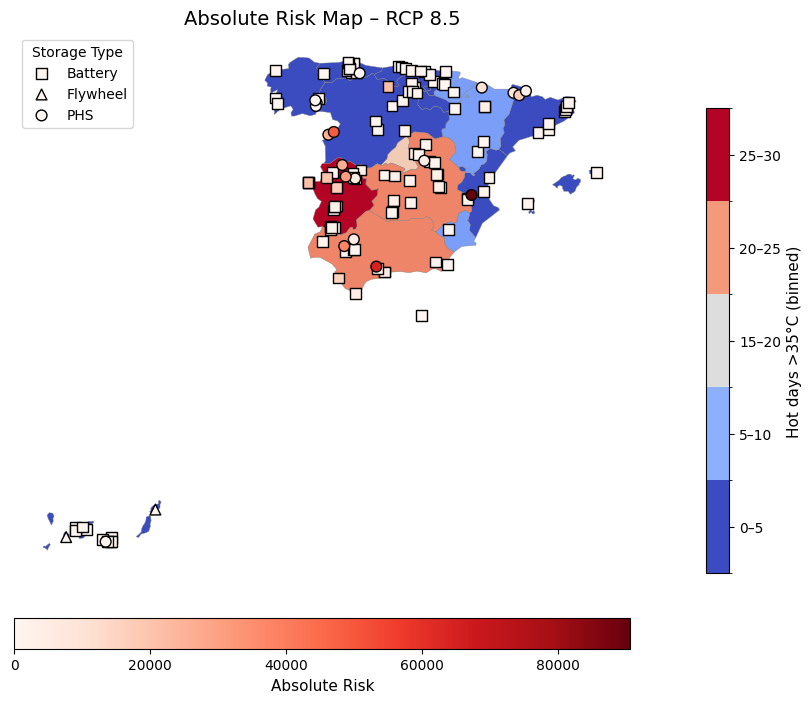

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


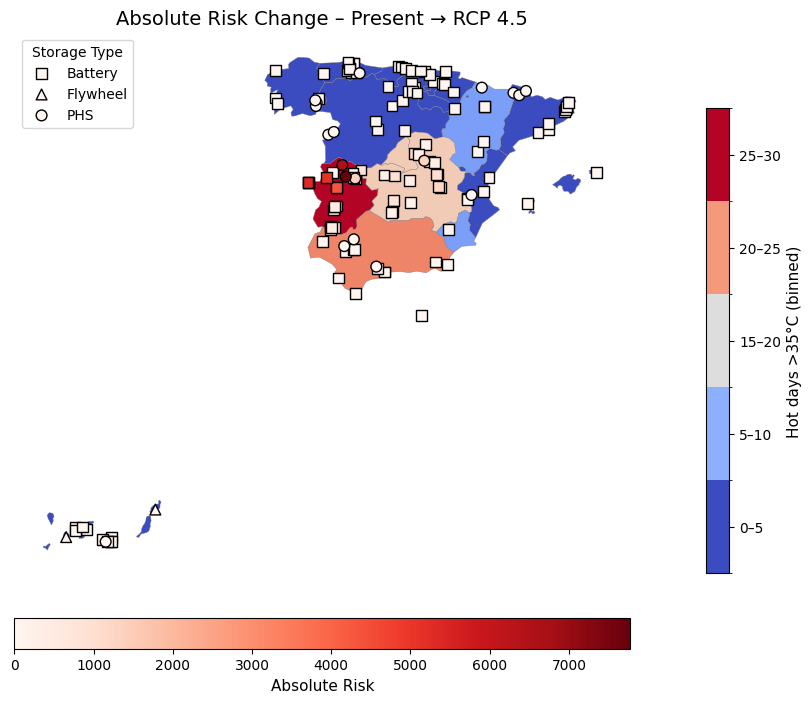

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


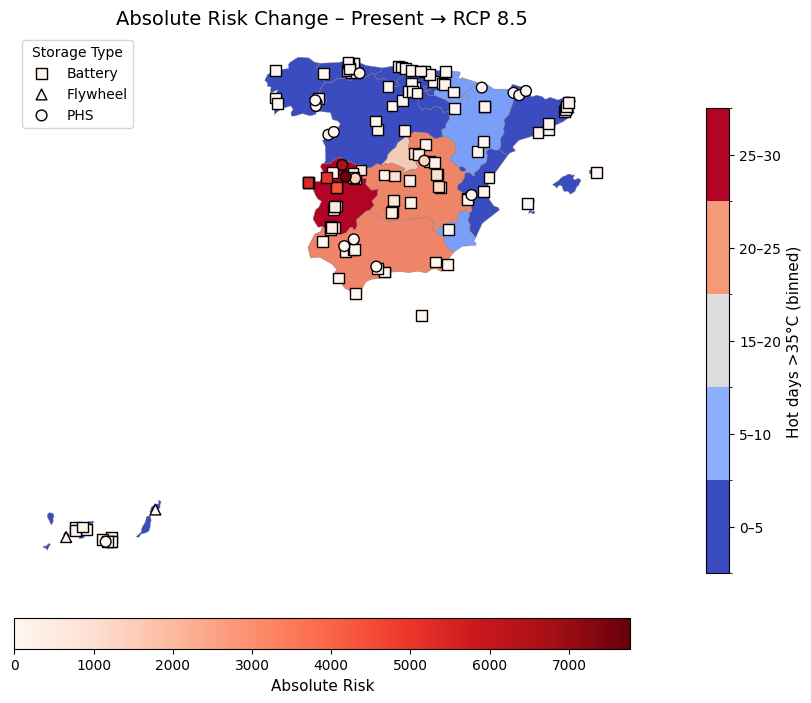

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

HAZ_CUR = "Hot days >35C 1991-2020 hazard strength"
HAZ_45 = "Hot days >35C 2011-2040 hazard strength RCP4.5"
HAZ_85 = "Hot days >35C 2011-2040 hazard strength RCP8.5"

HOT_CUR = "Hot days >35C 1991-2020"
HOT_45 = "Hot days >35C 2011-2040 RCP4.5"
HOT_85 = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 5, 10, 15, 20, 25, 30]
labels = ["0–5", "5–10", "10–15", "15–20", "20–25", "25–30"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)
regions_bg[HOTDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future45_dict
)
regions_bg[HOTDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, HOTDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZ_CUR].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZ_45].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZ_85].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# ============================================
# 5. BINNING HOT DAYS (for consistent background)
# ============================================
def bin_hot_days(df, col):
    bins = [0, 5, 10, 15, 20, 25, 30, np.inf]
    labels = ["0–4", "5–9", "10–14", "15–19", "20–24", "25–29", "30+"]
    df[col + "_binned"] = pd.cut(df[col], bins=bins, labels=labels, right=False)
    return df

for col in [HOT_CUR, HOT_45, HOT_85]:
    data = bin_hot_days(data, col)

# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="coolwarm",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("coolwarm", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Hot days >35°C (binned)", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=HOT_CUR,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Extreme precipitation days 1991-2020,Extreme precipitation days 1991-2020 hazard strength,Vulnerability extreme precipitation,Extreme precipitation days change RCP4.5,Extreme precipitation days change RCP8.5,Extreme precipitation days 2011-2040 RCP4.5,Extreme precipitation days 2011-2040 hazard strength RCP4.5,Extreme precipitation days 2011-2040 RCP8.5,Extreme precipitation days 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,15.50,62.00,62.00,62.00,0.001276,0.001276,0.001276
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,20.00,80.00,80.00,80.00,0.001646,0.001646,0.001646
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,5.00,20.00,20.00,20.00,0.000412,0.000412,0.000412
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,2280.00,13680.00,13680.00,13680.00,0.281481,0.281481,0.281481
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,215.00,1290.00,1290.00,1290.00,0.026543,0.026543,0.026543
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,263.00,1578.00,1578.00,1578.00,0.032469,0.032469,0.032469
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,7.42,2,1,0.12,-0.02,7.44,2,7.31,2,2.0,11.00,44.00,44.00,44.00,0.000905,0.000905,0.000905
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,2.0,800.00,3200.00,3200.00,3200.00,0.065844,0.065844,0.065844
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,2.0,46.00,184.00,184.00,184.00,0.003786,0.003786,0.003786
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,8.84,2,1,0.30,-0.17,8.99,2,8.54,2,2.0,60.00,240.00,240.00,240.00,0.004938,0.004938,0.004938


# High Fire Danger Days

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Fire days.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Fire days.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#High fire danger days above 1991-2020 for each region
fire_days_present_dict = {
    "Galicia": 8.32,
    "Principado de Asturias": 0.66,
    "Cantabria": 4.36,
    "País Vasco": 3.64,
    "Comunidad Foral de Navarra": 29.23,
    "La Rioja": 24.14,
    "Aragón": 64.54,
    "Cataluña": 34.39,
    "Comunitat Valenciana": 81.02,
    "Región de Murcia": 121.8,
    "Andalucía": 109.96,
    "Castilla-La Mancha": 100.69,
    "Castilla y León": 51.57,
    "Comunidad de Madrid": 90.54,
    "Extremadura": 102.54,
    "Canarias": 83.23,
    "Illes Balears": 61.75,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 1991-2020"] = data["Region"].map(fire_days_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 15, 30, 60, 90, float('inf')]
labels = [0, 1, 2, 3, 4]

data['High fire danger days 1991-2020 hazard strength'] = pd.cut(
    data['High fire danger days 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_extprecip_days = {
    "Battery": 1,
    "PHS": 0,
    "Flywheel": 0
}

data["Vulnerability fire days"] = data["Storage type"].map(vulnerability_extprecip_days)

In [ ]:
#Change in number of high fire danger days from 1991-2020 to 2011-2040 RCP4.5 for each region
fire_days_change45_dict = {
    "Galicia": 2.65,
    "Principado de Asturias": 0.41,
    "Cantabria": 0.73,
    "País Vasco": 1.08,
    "Comunidad Foral de Navarra": 4.29,
    "La Rioja": 4.2,
    "Aragón": 6.59,
    "Cataluña": 4.56,
    "Comunitat Valenciana": 7.57,
    "Región de Murcia": 9.58,
    "Andalucía": 8.97,
    "Castilla-La Mancha": 8.0,
    "Castilla y León": 4.67,
    "Comunidad de Madrid": 5.77,
    "Extremadura": 7.53,
    "Illes Balears": 4.41,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days change RCP4.5"] = data["Region"].map(fire_days_change45_dict)

In [ ]:
#Change in number of high fire danger days from 1991-2020 to 2011-2040 RCP8.5 for each region
fire_days_change85_dict = {
    "Galicia": 3.57,
    "Principado de Asturias": 0.41,
    "Cantabria": 0.62,
    "País Vasco": 1.11,
    "Comunidad Foral de Navarra": 4.8,
    "La Rioja": 4.68,
    "Aragón": 7.48,
    "Cataluña": 4.29,
    "Comunitat Valenciana": 8.45,
    "Región de Murcia": 9.32,
    "Andalucía": 10.13,
    "Castilla-La Mancha": 9.67,
    "Castilla y León": 6.8,
    "Comunidad de Madrid": 8.28,
    "Extremadura": 9.82,
    "Illes Balears": 4.52,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days change RCP8.5"] = data["Region"].map(fire_days_change85_dict)

In [ ]:
#High fire danger days 2011-2040 RCP4.5 for each region
fire_days_future45_dict = {
    "Galicia": 10.14,
    "Principado de Asturias": 1.15,
    "Cantabria": 2.65,
    "País Vasco": 4.06,
    "Comunidad Foral de Navarra": 29.13,
    "La Rioja": 21.41,
    "Aragón": 59.81,
    "Cataluña": 33.26,
    "Comunitat Valenciana": 76.48,
    "Región de Murcia": 118.43,
    "Andalucía": 105.56,
    "Castilla-La Mancha": 93.5,
    "Castilla y León": 46.26,
    "Comunidad de Madrid": 83.1,
    "Extremadura": 99.75,
    "Illes Balears": 53.64,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP4.5"] = data["Region"].map(fire_days_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 15, 30, 60, 90, float("inf")]
labels = [0, 1, 2, 3, 4]

data["High fire danger days 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["High fire danger days 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#High fire danger days 2011-2040 RCP8.5 for each region
fire_days_future85_dict = {
    "Galicia": 11.3,
    "Principado de Asturias": 1.11,
    "Cantabria": 2.45,
    "País Vasco": 4.0,
    "Comunidad Foral de Navarra": 29.69,
    "La Rioja": 22.11,
    "Aragón": 60.51,
    "Cataluña": 32.78,
    "Comunitat Valenciana": 76.97,
    "Región de Murcia": 117.61,
    "Andalucía": 108.69,
    "Castilla-La Mancha": 95.64,
    "Castilla y León": 86.34,
    "Comunidad de Madrid": 4.5,
    "Extremadura": 103.43,
    "Illes Balears": 52.91,
    "Canarias": 0.0,
    "Ciudad de Ceuta": 0.0,
    "Ciudad de Melilla": 0.0,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["High fire danger days 2011-2040 RCP8.5"] = data["Region"].map(fire_days_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 15, 30, 60, 90, float("inf")]
labels = [0, 1, 2, 3, 4]

data["High fire danger days 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["High fire danger days 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'High fire danger days 1991-2020 hazard strength',
    'High fire danger days 2011-2040 hazard strength RCP4.5',
    'High fire danger days 2011-2040 hazard strength RCP8.5',
    'Vulnerability fire days',
    'High fire danger days 1991-2020',
    'High fire danger days 2011-2040 RCP4.5',
    'High fire danger days 2011-2040 RCP8.5',
    'High fire danger days change RCP4.5',
    'High fire danger days change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

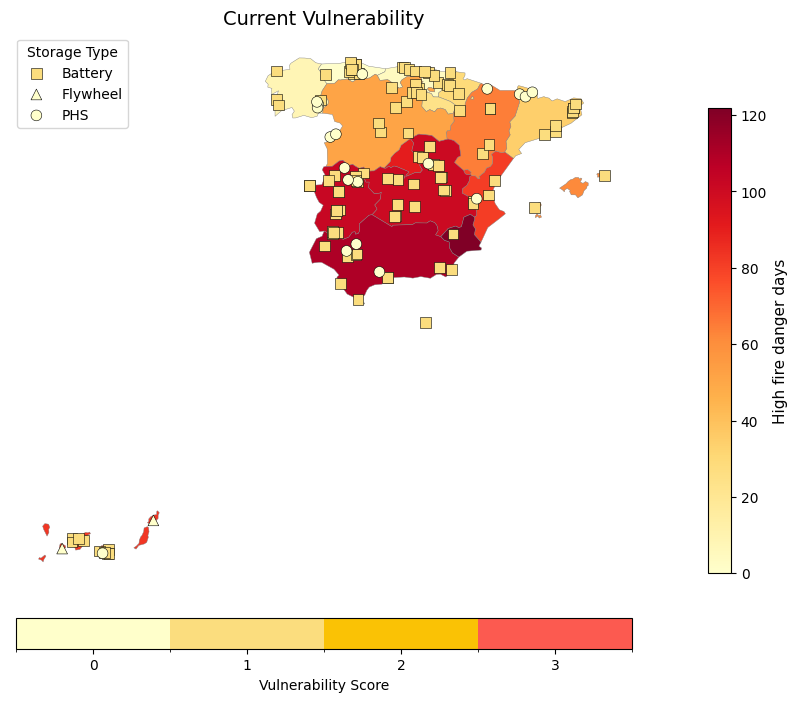

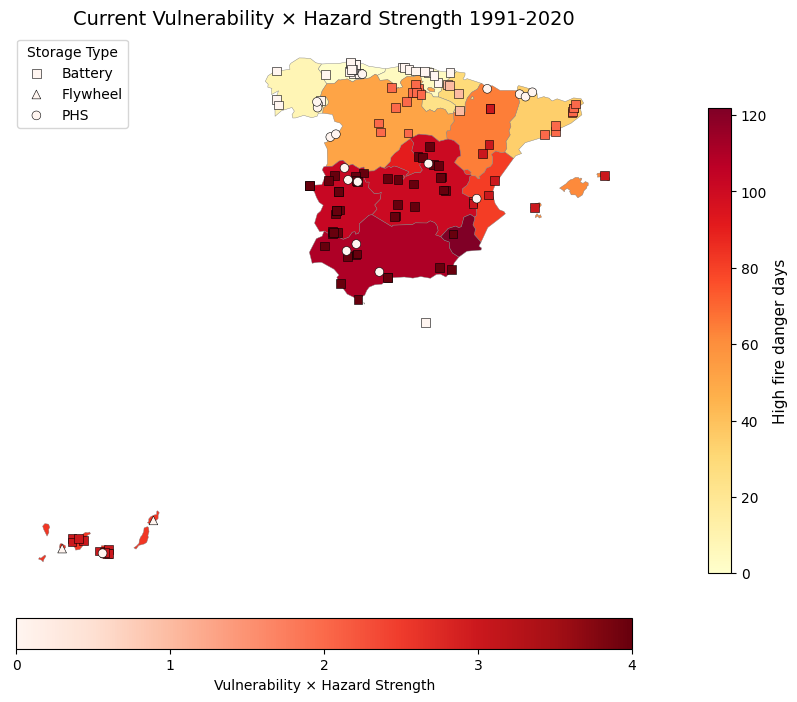

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability fire days"
HAZARDCURRENT_COL = "High fire danger days 1991-2020 hazard strength"
FIREDAYSCURRENT_COL = "High fire danger days 1991-2020"

# -------------------------------
# 1. Bin function (define FIRST)
# -------------------------------
def apply_leq_bins(df, col):
    df = df.copy()

    bins = [0, 15, 30, 60, 90, float("inf")]
    labels = ["≤15", "≤30", "≤60", "≤90", ">90"]

    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    return df


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[FIREDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    fire_days_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, FIREDAYSCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("High fire danger days", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")

    # Plot polygons
    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    # Background colour bar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("High fire danger days", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, ticks=[0, 1, 2, 3, 4]).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_73, ax_73 = plot_current_optionA(
    bg_col=FIREDAYSCURRENT_COL,
    title="Current Vulnerability"
)

fig_74, ax_74 = plot_current_optionB(
    bg_col=FIREDAYSCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_73, "Current Vulnerability fire danger days.jpg")
save_figure(fig_74, "Current Vulnerability × Hazard Strength 1991-2020 fire danger days.jpg")

Saved: Current Vulnerability fire danger days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 fire danger days.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

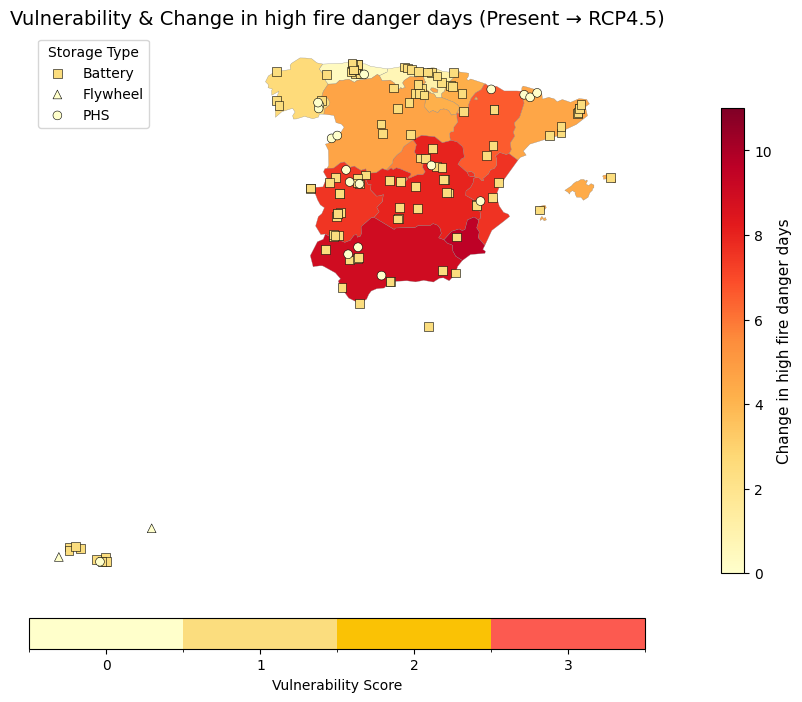

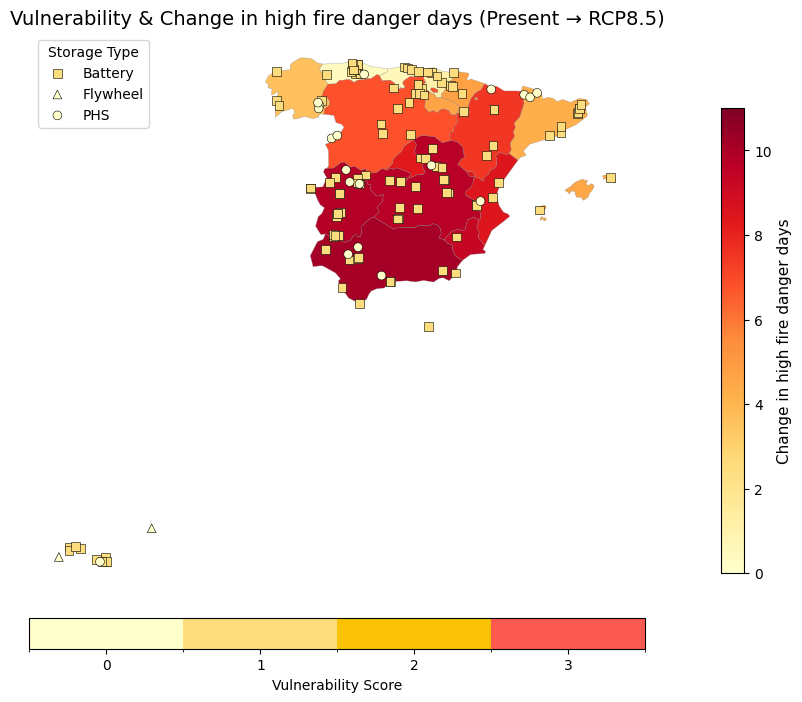

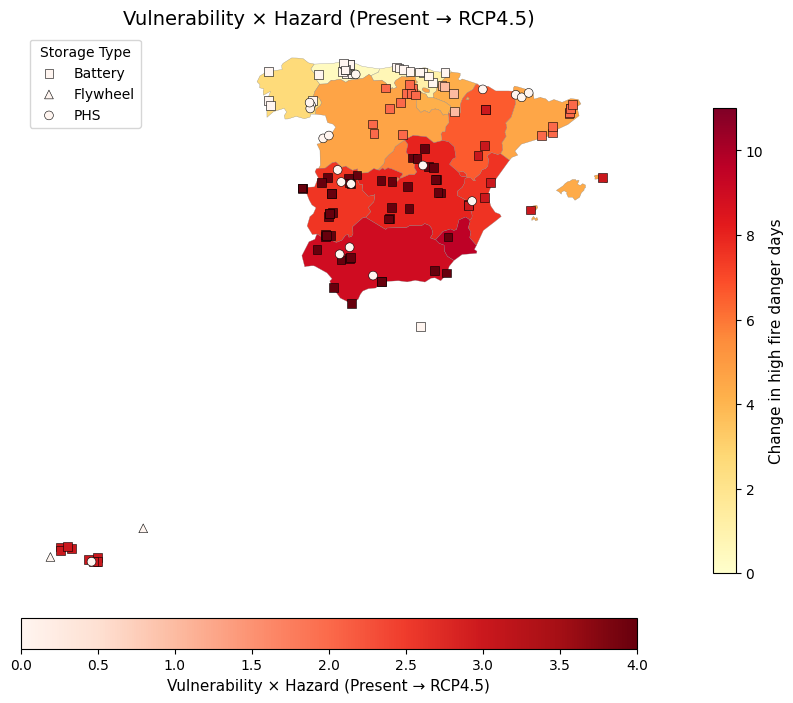

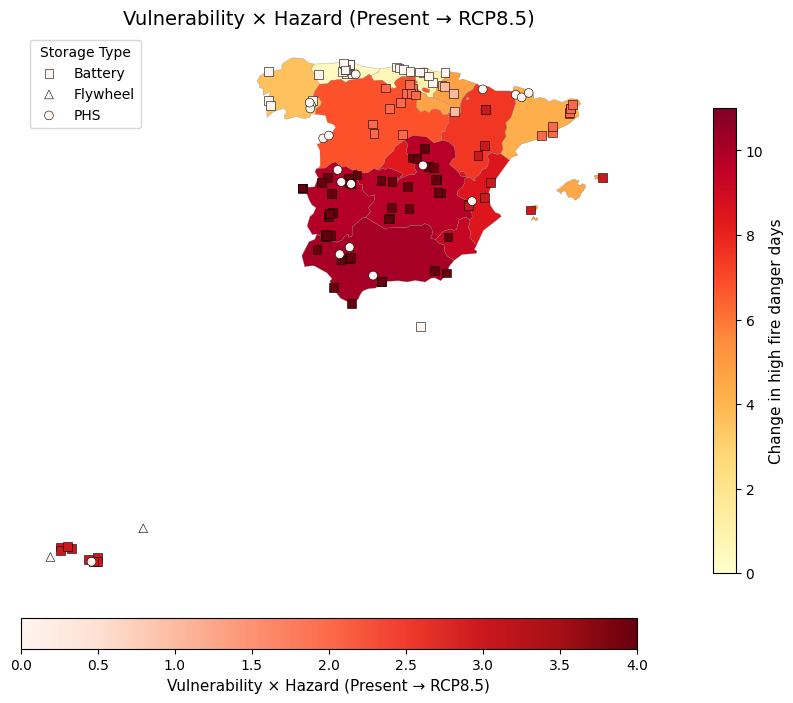

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability fire days"

FIREDAYS_CHANGE45 = "High fire danger days change RCP4.5"
FIREDAYS_CHANGE85 = "High fire danger days change RCP8.5"
FIREDAYSCURRENT_COL = "High fire danger days 1991-2020 hazard strength"


# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region bakcgrounds
regions_bg = regions.copy()

regions_bg[FIREDAYS_CHANGE45] = regions_bg["NUTS_NAME"].map(
    fire_days_change45_dict
)

regions_bg[FIREDAYS_CHANGE85] = regions_bg["NUTS_NAME"].map(
    fire_days_change85_dict
)

# =========================================================
# 3. Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("YlOrRd")
    norm_bg = mcolors.Normalize(vmin=0, vmax=11)

    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in high fire danger days", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )

      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colourbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_75, ax_75 = plot_step5_optionA(
    FIREDAYS_CHANGE45,
    "Vulnerability & Change in high fire danger days (Present → RCP4.5)"
)

fig_76, ax_76 = plot_step5_optionA(
    FIREDAYS_CHANGE85,
    "Vulnerability & Change in high fire danger days (Present → RCP8.5)"
)
#I don't think I need these
fig_77, ax_77 = plot_step5_optionB(
    FIREDAYS_CHANGE45,
    "Vulnerability × Hazard (Present → RCP4.5)"
)

fig_78, ax_78 = plot_step5_optionB(
    FIREDAYS_CHANGE85,
    "Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_75, "Vulnerability & Change in fire danger days (Present → RCP4.5).jpg")
save_figure(fig_76, "Vulnerability & Change in fire danger days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in fire danger days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in fire danger days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

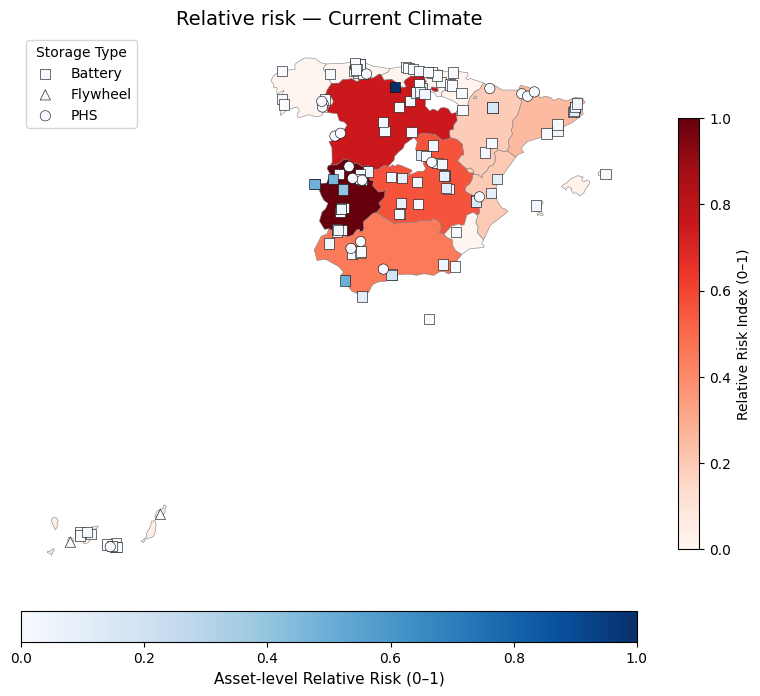

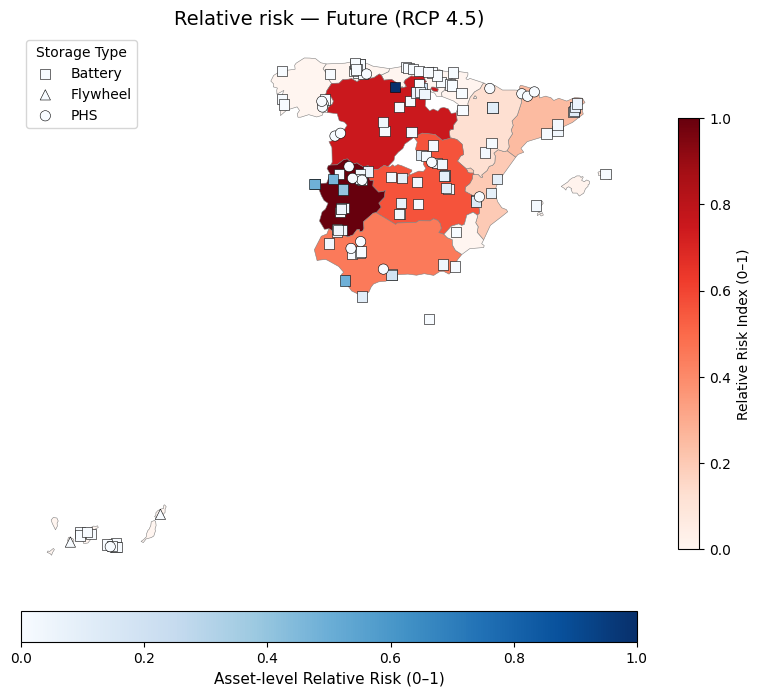

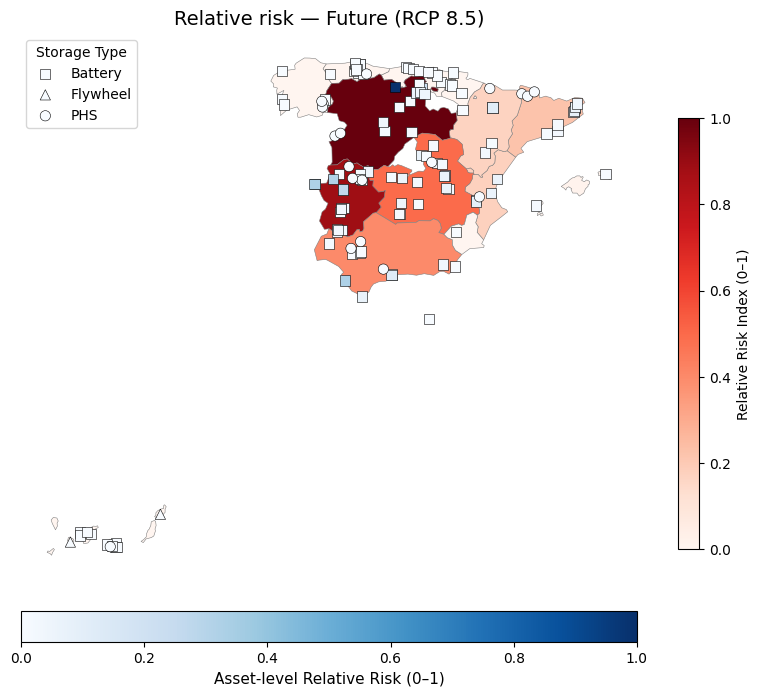

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability fire days"

HAZARDCURRENT_COL = "High fire danger days 1991-2020 hazard strength"
HAZARD45_COL     = "High fire danger days 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "High fire danger days 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_79, ax_79 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_80, ax_80 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_81, ax_81 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_79, "Relative risk — Current Climate.jpg")
save_figure(fig_80, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_81, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

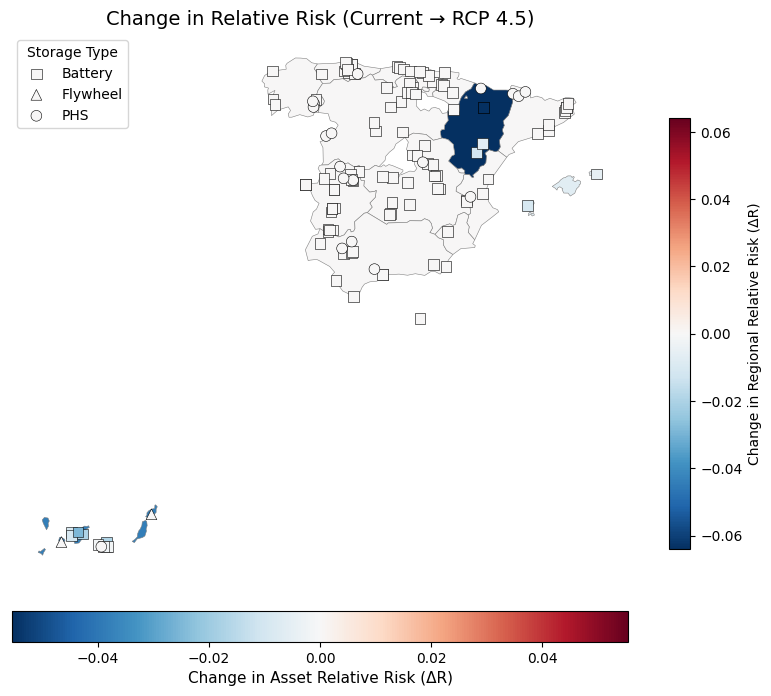

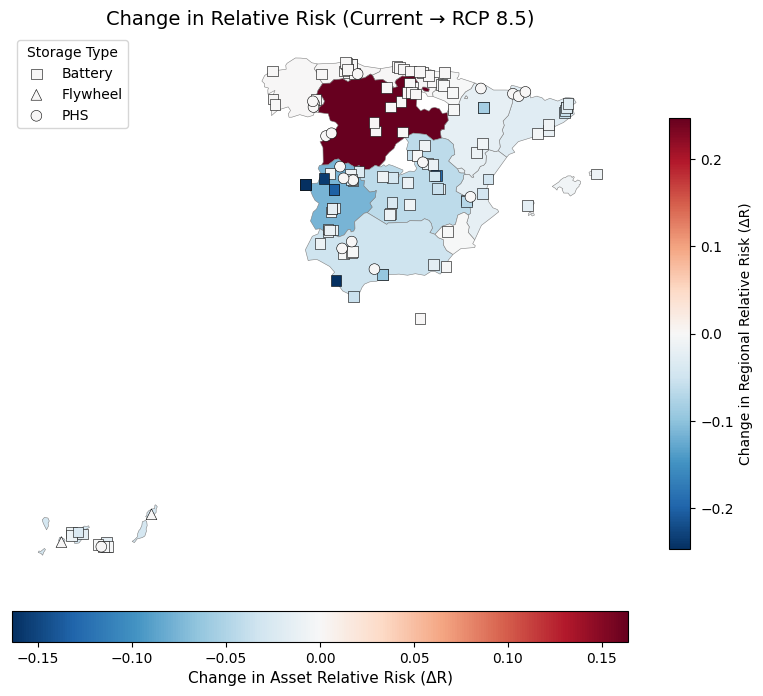

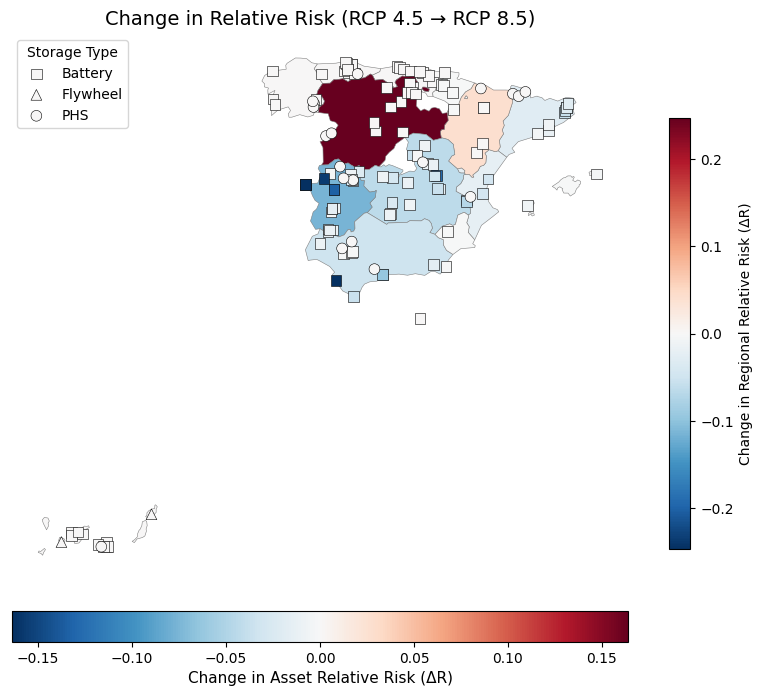

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax



# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_82, ax_82 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_83, ax_83 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_84, ax_84 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_82, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_83, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_84, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Extremadura,28514.08,28514.08,28514.08,1.000000,1.000000,0.885162,0.000000,-0.114838,-0.114838
1,Castilla y León,21475.60,21475.60,32213.40,0.753158,0.753158,1.000000,0.000000,0.246842,0.246842
2,Castilla-La Mancha,15986.88,15986.88,15986.88,0.560666,0.560666,0.496280,0.000000,-0.064386,-0.064386
3,Andalucía,12871.12,12871.12,12871.12,0.451395,0.451395,0.399558,0.000000,-0.051837,-0.051837
4,Cataluña,7206.80,7206.80,7206.80,0.252745,0.252745,0.223721,0.000000,-0.029025,-0.029025
5,Comunitat Valenciana,5718.60,5718.60,5718.60,0.200554,0.200554,0.177522,0.000000,-0.023031,-0.023031
6,Aragón,5484.00,3656.00,5484.00,0.192326,0.128217,0.170240,-0.064109,-0.022086,0.042022
7,Canarias,1261.74,0.00,0.00,0.044250,0.000000,0.000000,-0.044250,-0.044250,0.000000
8,Illes Balears,630.00,420.00,420.00,0.022094,0.014730,0.013038,-0.007365,-0.009056,-0.001692
9,Comunidad Foral de Navarra,112.16,112.16,112.16,0.003933,0.003933,0.003482,0.000000,-0.000452,-0.000452


In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability fire days"

HAZARD_CUR = "High fire danger days 1991-2020 hazard strength"
HAZARD_45 = "High fire danger days 2011-2040 hazard strength RCP4.5"
HAZARD_85 = "High fire danger days 2011-2040 hazard strength RCP8.5"

FIREDAYSCURRENT_COL = "High fire danger days 1991-2020"
FIREDAYS45_COL = "High fire danger days 2011-2040 RCP4.5"
FIREDAYS85_COL = "High fire danger days 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 15, 30, 60, 90, 120]
labels = ["0–15", "15-30", "30-60", "60-90", ">90"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[FIREDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    fire_days_present_dict
)
regions_bg[FIREDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    fire_days_future45_dict
)
regions_bg[FIREDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    fire_days_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, FIREDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, FIREDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, FIREDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[FIREDAYSCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[FIREDAYS45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[FIREDAYS85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# ============================================
# 5. BINNING HOT DAYS (for consistent background)
# ============================================
def bin_hot_days(df, col):
    bins = [0, 5, 10, 15, 20, 25, 30, np.inf]
    labels = ["0–4", "5–9", "10–14", "15–19", "20–24", "25–29", "30+"]
    df[col + "_binned"] = pd.cut(df[col], bins=bins, labels=labels, right=False)
    return df

for col in [FIREDAYSCURRENT_COL, FIREDAYS45_C0L, FIREDAYS85_COL]:
    data = bin_hot_days(data, col)

# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="coolwarm",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("coolwarm", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Hot days >35°C (binned)", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=FIREDAYSCURRENT_COL,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=FIREDAYS45_COL,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=FIREDAYS85_COL,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=FIREDAYS45_COL,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=FIREDAYS85_COL,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


NameError: name 'FIREDAYS45_C0L' is not defined

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,High fire danger days 1991-2020,High fire danger days 1991-2020 hazard strength,Vulnerability fire days,High fire danger days change RCP4.5,High fire danger days change RCP8.5,High fire danger days 2011-2040 RCP4.5,High fire danger days 2011-2040 hazard strength RCP4.5,High fire danger days 2011-2040 RCP8.5,High fire danger days 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,8.32,0,1,2.65,3.57,10.14,0,11.30,0,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,8.32,0,1,2.65,3.57,10.14,0,11.30,0,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,8.32,0,1,2.65,3.57,10.14,0,11.30,0,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,8.32,0,0,2.65,3.57,10.14,0,11.30,0,0.0,2280.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,8.32,0,0,2.65,3.57,10.14,0,11.30,0,0.0,215.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,8.32,0,0,2.65,3.57,10.14,0,11.30,0,0.0,263.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,8.32,0,1,2.65,3.57,10.14,0,11.30,0,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,0.66,0,1,0.41,0.41,1.15,0,1.11,0,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,0.66,0,1,0.41,0.41,1.15,0,1.11,0,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,0.66,0,1,0.41,0.41,1.15,0,1.11,0,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000


# Total precipitation

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Template storage data to analyse.csv to Template storage data to analyse.csv


In [ ]:
import os

old_name = "Template storage data to analyse.csv"
new_name = "Precipitation.csv"

os.rename(old_name, new_name)

In [ ]:
data = pd.read_csv("Precipitation.csv", sep=';', decimal=",", encoding='latin1')
data.head()

,ï»¿ID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.5,2.00,2
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.0,4.00,2
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.0,1.00,2
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.0,8.44,3
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3


Fixing and cleaning data

In [ ]:
#Fix Storage ID name
data.columns = data.columns.str.replace('ï»¿', 'Storage')

#Identify region names
data.columns = data.columns.str.strip()
data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'PaÃ\xads Vasco',
       'Comunidad Foral de Navarra', 'AragÃ³n', 'CataluÃ±a',
       'Illes Balears', 'Comunitat Valenciana', 'RegiÃ³n de Murcia',
       'AndalucÃ\xada', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y LeÃ³n', 'Castilla-La Mancha'], dtype=object)

In [ ]:
#Fix region names
region_fix = {
    "PaÃ\xads Vasco": "País Vasco",
    "AragÃ³n": "Aragón",
    "CataluÃ±a": "Cataluña",
    "RegiÃ³n de Murcia": "Región de Murcia",
    "AndalucÃ\xada": "Andalucía",
    "Castilla y LeÃ³n": "Castilla y León"}

data["Region"] = data["Region"].replace(region_fix)

data["Region"].unique()

array(['Galicia', 'Principado de Asturias', 'Cantabria', 'País Vasco',
       'Comunidad Foral de Navarra', 'Aragón', 'Cataluña',
       'Illes Balears', 'Comunitat Valenciana', 'Región de Murcia',
       'Andalucía', 'Ciudad de Melilla', 'Canarias', 'Extremadura',
       'Castilla y León', 'Castilla-La Mancha'], dtype=object)

In [ ]:
# Remove BOM, whitespace, invisible characters
data['Storage type'] = (
    data['Storage type']
    .astype(str)
    .str.encode('utf-8', 'ignore')
    .str.decode('utf-8')
    .str.replace('\u200b', '', regex=False)  # zero-width space
    .str.replace('\xa0', ' ', regex=False)   # non-breaking space
    .str.strip()
)

In [ ]:
# Split coordinates into latitude and longitude
data[['lat','lon']] = data['Coordinates'].str.split(',', expand=True).astype(float)

In [ ]:
# Convert coordinates to geodataframe
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data['lon'], data['lat']),
    crs="EPSG:4326"
)

Inputting data

In [ ]:
#Precipitation 1991-2020 for each region
precip_present_dict = {
    "Galicia": 1290.5,
    "Principado de Asturias": 1300.64,
    "Cantabria": 1133.78,
    "País Vasco": 1090.03,
    "Comunidad Foral de Navarra": 904.33,
    "La Rioja": 729.39,
    "Aragón": 638.36,
    "Cataluña": 756.52,
    "Comunitat Valenciana": 482.57,
    "Región de Murcia": 356.52,
    "Andalucía": 519.26,
    "Castilla-La Mancha": 510.74,
    "Castilla y León": 696.41,
    "Comunidad de Madrid": 537.9,
    "Extremadura": 595.72,
    "Canarias": 182.02,
    "Illes Balears": 436.39,
    "Ciudad de Ceuta": 623.12,
    "Ciudad de Melilla": 349.5,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 1991-2020"] = data["Region"].map(precip_present_dict)

In [ ]:
#Define bins for hazard strength
bins = [0, 500, 1000, float("inf")]
labels = [2, 1, 0]

data['Precipitation 1991-2020 hazard strength'] = pd.cut(
    data['Precipitation 1991-2020'].astype(float),
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
).astype(int)

In [ ]:
#Vulnerability score
vulnerability_precip = {
    "Battery": 0,
    "PHS": 2,
    "Flywheel": 0
}

data["Vulnerability precipitation"] = data["Storage type"].map(vulnerability_precip)

In [ ]:
#Change in precipitation (%) from 1991-2020 to 2011-2040 RCP4.5 for each region
precip_change45_dict = {
    "Galicia": -0.72,
    "Principado de Asturias": 0.75,
    "Cantabria": 0.93,
    "País Vasco": 1.05,
    "Comunidad Foral de Navarra": 1.17,
    "La Rioja": -0.39,
    "Aragón": -1.05,
    "Cataluña": -0.74,
    "Comunitat Valenciana": -4.13,
    "Región de Murcia": -3.47,
    "Andalucía": -4.49,
    "Castilla-La Mancha": -2.74,
    "Castilla y León": -0.86,
    "Comunidad de Madrid": -0.74,
    "Extremadura": -3.02,
    "Canarias": -4.06,
    "Illes Balears": -2.51,
    "Ciudad de Ceuta": -6.03,
    "Ciudad de Melilla": -6.82,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation change RCP4.5"] = data["Region"].map(precip_change45_dict)

In [ ]:
#Change in precipitation (%) from 1991-2020 to 2011-2040 RCP8.5 for each region
precip_change85_dict = {
    "Galicia": -2.99,
    "Principado de Asturias": -1.78,
    "Cantabria": -1.01,
    "País Vasco": -0.71,
    "Comunidad Foral de Navarra": -1.53,
    "La Rioja": -3.21,
    "Aragón": -2.81,
    "Cataluña": -1.66,
    "Comunitat Valenciana": -4.37,
    "Región de Murcia": -4.91,
    "Andalucía": -6.57,
    "Castilla-La Mancha": -4.77,
    "Castilla y León": -3.84,
    "Comunidad de Madrid": -3.75,
    "Extremadura": -5.86,
    "Canarias": -8.01,
    "Illes Balears": -2.99,
    "Ciudad de Ceuta": -8.87,
    "Ciudad de Melilla": -9.91,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation change RCP8.5"] = data["Region"].map(precip_change85_dict)

In [ ]:
#Precipitation 2011-2040 RCP4.5 for each region
precip_future45_dict = {
    "Galicia": 1265.69,
    "Principado de Asturias": 1277.94,
    "Cantabria": 1113.81,
    "País Vasco": 1081.52,
    "Comunidad Foral de Navarra": 911.15,
    "La Rioja": 718.37,
    "Aragón": 634.45,
    "Cataluña": 750.07,
    "Comunitat Valenciana": 472.14,
    "Región de Murcia": 345.95,
    "Andalucía": 502.99,
    "Castilla-La Mancha": 505.17,
    "Castilla y León": 684.97,
    "Comunidad de Madrid": 538.42,
    "Extremadura": 583.65,
    "Canarias": 12.28,
    "Illes Balears": 419.53,
    "Ciudad de Ceuta": 597.95,
    "Ciudad de Melilla": 320.26,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP4.5"] = data["Region"].map(precip_future45_dict)

In [ ]:
#Define bins for future hazard strength RCP4.5
bins = [0, 100, 500, 1000, float("inf")]
labels = [3, 2, 1, 0]

data["Precipitation 2011-2040 hazard strength RCP4.5"] = pd.cut(
    data["Precipitation 2011-2040 RCP4.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Precipitation 2011-2040 RCP8.5 for each region
precip_future85_dict = {
    "Galicia": 1232.8,
    "Principado de Asturias": 1245.74,
    "Cantabria": 1096.8,
    "País Vasco": 1065.86,
    "Comunidad Foral de Navarra": 890.7,
    "La Rioja": 702.7,
    "Aragón": 626.35,
    "Cataluña": 747.07,
    "Comunitat Valenciana": 474.29,
    "Región de Murcia": 343.51,
    "Andalucía": 491.83,
    "Castilla-La Mancha": 494.92,
    "Castilla y León": 665.11,
    "Comunidad de Madrid": 523.07,
    "Extremadura": 565.1,
    "Canarias": 12.1,
    "Illes Balears": 418.59,
    "Ciudad de Ceuta": 580.75,
    "Ciudad de Melilla": 313.36,
}

# Clean column names by stripping whitespace
data.columns = data.columns.str.strip()

# Add a new column based on region
data["Precipitation 2011-2040 RCP8.5"] = data["Region"].map(precip_future85_dict)

In [ ]:
#Define bins for future hazard strength RCP8.5
bins = [0, 100, 500, 1000, float("inf")]
labels = [3, 2, 1, 0]

data["Precipitation 2011-2040 hazard strength RCP8.5"] = pd.cut(
    data["Precipitation 2011-2040 RCP8.5"].astype(float),
    bins=bins,
    labels=labels,
    right=False,     # makes intervals: [0,1), [1,5), [5,15), ...
    include_lowest=True
).astype(int)

In [ ]:
#Ensure numeric columns
cols_to_numeric = [
    'Precipitation 1991-2020 hazard strength',
    'Precipitation 2011-2040 hazard strength RCP4.5',
    'Precipitation 2011-2040 hazard strength RCP8.5',
    'Vulnerability precipitation',
    'Precipitation 1991-2020',
    'Precipitation 2011-2040 RCP4.5',
    'Precipitation 2011-2040 RCP8.5',
    'Precipitation change RCP4.5',
    'Precipitation change RCP8.5',
    'Importance score',
]
for col in cols_to_numeric:
    data[col] = pd.to_numeric(data[col], errors='coerce')

Mapping the data

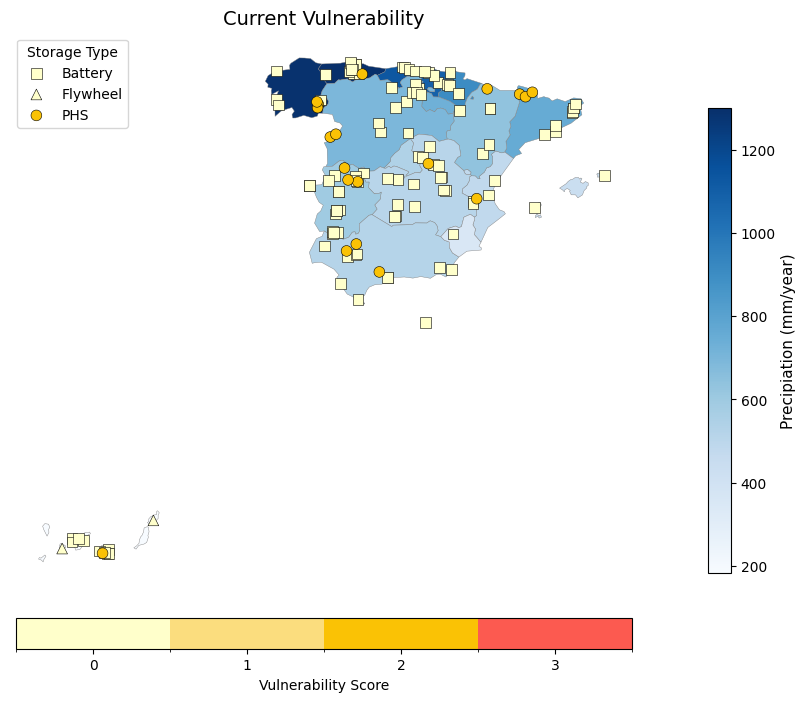

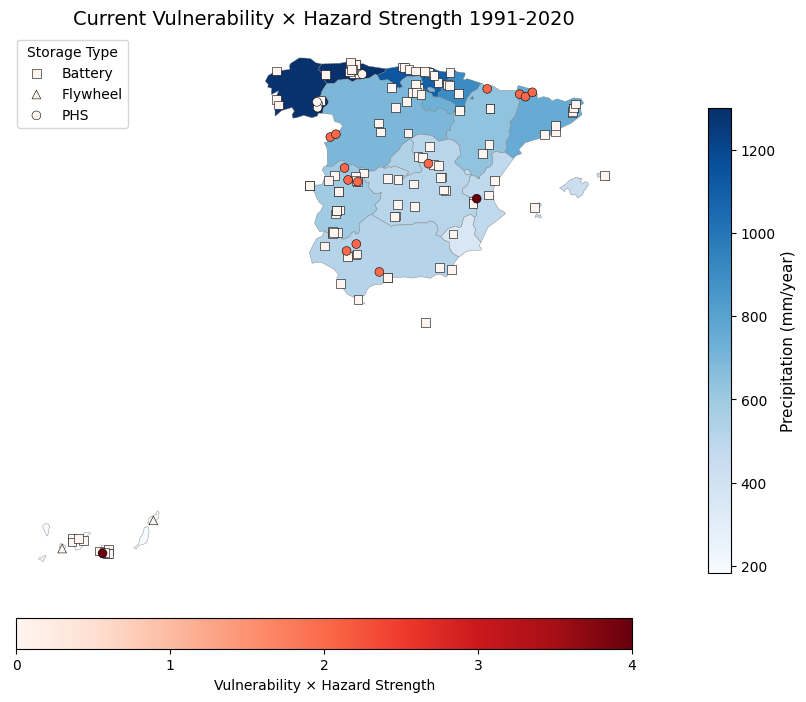

In [ ]:
#CURRENT VULNERABILITY

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
VULN_COL = "Vulnerability precipitation"
HAZARDCURRENT_COL = "Precipitation 1991-2020 hazard strength"
PRECIPCURRENT_COL = "Precipitation 1991-2020"


# -------------------------------
# 2. Create region background ONLY from regions
# -------------------------------
regions_bg = regions.copy()

regions_bg[PRECIPCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    precip_present_dict
)

# -------------------------------
# 3. Apply binning to ALL regions
# -------------------------------
regions_bg = apply_leq_bins(regions_bg, PRECIPCURRENT_COL)


# -------------------------------
# SAFE helper to get sorted category list for legend
# -------------------------------
def sorted_category_list(cat_series):
    # convert to strings, dropna, unique, try to sort by numeric if possible
    cats = [str(x) for x in pd.Series(cat_series.unique()).dropna()]
    try:
        # attempt to extract numeric start for ordering, fallback to lexicographic
        cats_sorted = sorted(cats, key=lambda s: float(s.replace('≤','').split('–')[0]))
    except Exception:
        cats_sorted = sorted(cats)
    return cats_sorted

# =========================================================
# DISCRETE VULNERABILITY COLOURS (0,1,2,3)
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# -------------------------------
# Plotting functions using regions_bg
# -------------------------------

def plot_current_optionA(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # Use the pre-built regions_bg that contains the _binned column
    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons (categorical)
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        ax=ax,
        edgecolor="grey",
        linewidth=0.3,
        legend=False
    )

    # Background colourbar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Precipiation (mm/year)", fontsize=11)

    # Storage markers
    markers = {'Battery': 's', 'Flywheel': '^', 'PHS': 'o'}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[VULN_COL].astype(float),
            cmap=vuln_cmap,
            norm=vuln_norm,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
    cbar_v = plt.colorbar(
        sm_v,
        ax=ax,
        orientation="horizontal",
        fraction=0.05,
        pad=0.05,
        ticks=[0.5, 1.5, 2.5, 3.5]
    )

    cbar_v.set_ticklabels(["0", "1", "2", "3"])
    cbar_v.set_label("Vulnerability Score")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


def plot_current_optionB(bg_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # DYNAMIC normalisation
    vals = merged[bg_col].astype(float)
    norm_bg = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    cmap_bg = matplotlib.colormaps.get_cmap("Blues")

    # Plot polygons
    merged.plot(column=bg_col, cmap=cmap_bg, norm=norm_bg, ax=ax, edgecolor="grey", linewidth=0.3)

    # Background colour bar
    sm = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Precipitation (mm/year)", fontsize=11)

    # compute VulnHazard_current if not already present
    if "VulnHazard_current" not in data.columns:
        data["VulnHazard_current"] = data[VULN_COL].astype(float) * data[HAZARDCURRENT_COL].astype(float)

    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}
    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset["VulnHazard_current"].astype(float),
            cmap="Reds",
            norm=norm_pts,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    sm_pts = plt.cm.ScalarMappable(cmap="Reds", norm=norm_pts)
    plt.colorbar(sm_pts, ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, ticks=[0, 1, 2, 3, 4]).set_label("Vulnerability × Hazard Strength")

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

fig_85, ax_85 = plot_current_optionA(
    bg_col=PRECIPCURRENT_COL,
    title="Current Vulnerability"
)

fig_86, ax_86 = plot_current_optionB(
    bg_col=PRECIPCURRENT_COL,
    title="Current Vulnerability × Hazard Strength 1991-2020"
)


In [ ]:
save_figure(fig_85, "Current Vulnerability low precipitation.jpg")
save_figure(fig_86, "Current Vulnerability × Hazard Strength 1991-2020 low precipitation.jpg")

Saved: Current Vulnerability low precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Current Vulnerability × Hazard Strength 1991-2020 low precipitation.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

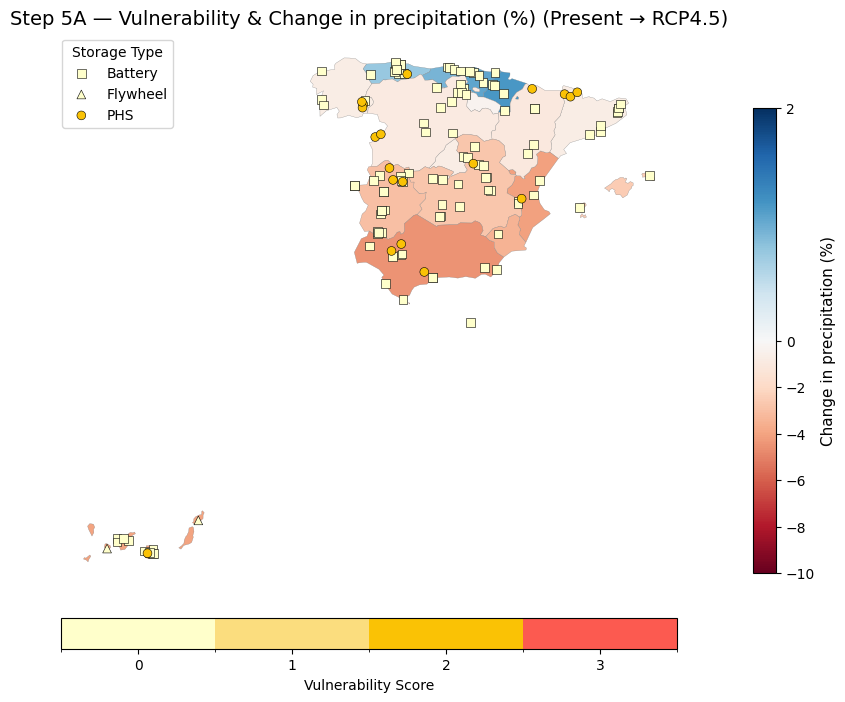

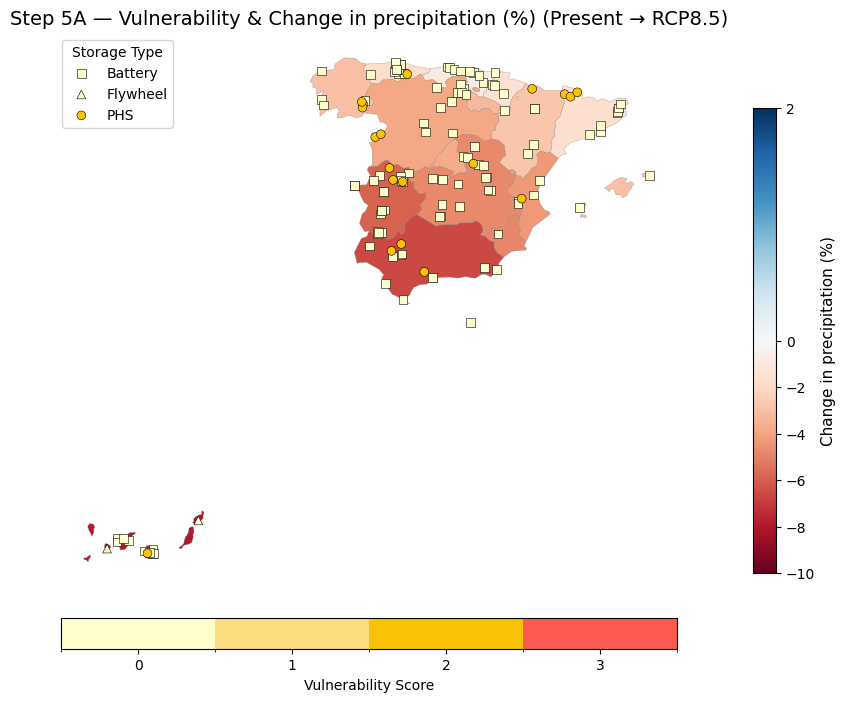

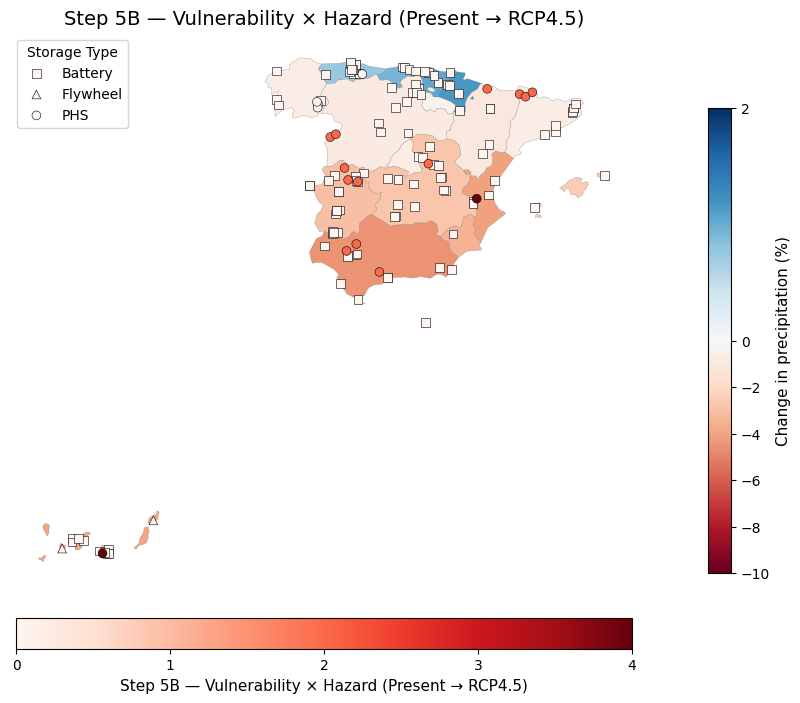

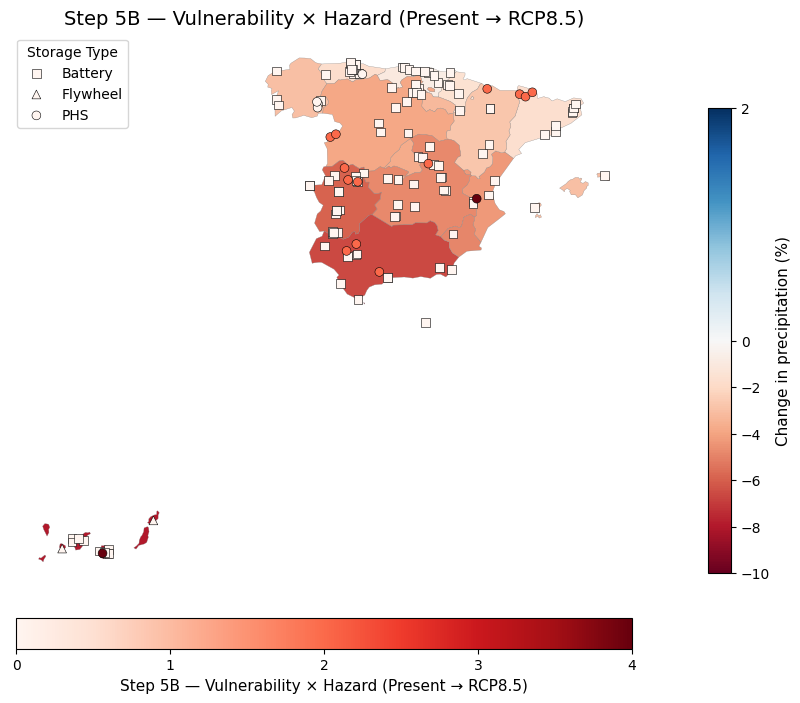

In [ ]:
# =========================================================
# ASSESSING POTENTIAL IMPACTS OF CLIMATE CHANGE  ON STORAGE PROJECTS
# =========================================================
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
REGION_COL      = "Region"
ASSET_TYPE_COL  = "Storage type"
VULN_COL        = "Vulnerability precipitation"

PRECIP_CHANGE45 = "Precipitation change RCP4.5"
PRECIP_CHANGE85 = "Precipitation change RCP8.5"
PRECIPCURRENT_COL = "Precipitation 1991-2020 hazard strength"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
#Create region background from regions

regions_bg = regions.copy()

regions_bg[PRECIP_CHANGE45] = regions_bg["NUTS_NAME"].map(
    precip_change45_dict
)
regions_bg[PRECIP_CHANGE85] = regions_bg["NUTS_NAME"].map(
    precip_change85_dict
)


# =========================================================
# 3. Discrete vulnerability colormap
# =========================================================
vuln_colors = ["#FFFFCB", "#FBDD7E", "#FAC205", "#FC5A50"]
vuln_cmap = mcolors.ListedColormap(vuln_colors)
vuln_norm = mcolors.BoundaryNorm([0,1,2,3,4], vuln_cmap.N)


# =========================================================
# Function for both Option A & B
# =========================================================
def plot_step5(bg_col, title, color_points_by, cmap_points, norm_points, show_vuln_cbar=False,
    show_points_cbar=False):

    fig, ax = plt.subplots(figsize=(10, 8))

    merged = regions_bg

    # Dynamic background colour
    vals_bg = merged[bg_col].astype(float)
    cmap_bg = matplotlib.colormaps.get_cmap("RdBu")
    norm_bg = mcolors.TwoSlopeNorm(vmin=-10, vcenter=0, vmax=2)


    # Plot background
    merged.plot(
        column=bg_col,
        cmap=cmap_bg,
        norm=norm_bg,
        edgecolor="grey",
        linewidth=0.2,
        ax=ax,
        legend=False
    )

    # Colorbar for background
    sm_bg = plt.cm.ScalarMappable(cmap=cmap_bg, norm=norm_bg)
    sm_bg.set_array([])
    cbar = plt.colorbar(
        sm_bg, ax=ax,
        fraction=0.03, pad=0.02
    )
    cbar.set_label("Change in precipitation (%)", fontsize=11)

    # Plot storage assets
    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for t, marker in markers.items():
        subset = data[data[ASSET_TYPE_COL] == t]
        ax.scatter(
            subset["lon"], subset["lat"],
            c=subset[color_points_by],
            cmap=cmap_points,
            norm=norm_points,
            marker=marker,
            s=40,
            edgecolor="black",
            linewidth=0.4,
            label=t
        )

    # Vulnerability colourbar
    if show_vuln_cbar:
      sm_v = plt.cm.ScalarMappable(cmap=vuln_cmap, norm=vuln_norm)
      cbar_v = plt.colorbar(
          sm_v,
          ax=ax,
          orientation="horizontal",
          fraction=0.05,
          pad=0.05,
          ticks=[0.5, 1.5, 2.5, 3.5]
      )
      cbar_v.set_ticklabels(["0", "1", "2", "3"])
      cbar_v.set_label("Vulnerability Score")

    # Colourbar for points
    if show_points_cbar:
      sm_pts = plt.cm.ScalarMappable(cmap=cmap_points, norm=norm_points)
      cbar2 = plt.colorbar(
          sm_pts, ax=ax, orientation="horizontal",
          fraction=0.05, pad=0.05, ticks=[0, 1, 2, 3, 4]
      )
      cbar2.set_label(title.split(":")[-1].strip(), fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax


# =========================================================
# 4. OPTION A — Vulnerability
# =========================================================
def plot_step5_optionA(bg_col, title):
    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by=VULN_COL,
        cmap_points=vuln_cmap,
        norm_points=vuln_norm,
        show_vuln_cbar=True,
        show_points_cbar=False
    )

    return fig, ax


# =========================================================
# 5. OPTION B — Vulnerability × HazardStrengthCurrent
# =========================================================
data["VulnHazard_current"] = (
    data[VULN_COL].astype(float) *
    data[HAZARDCURRENT_COL].astype(float)
)

def plot_step5_optionB(bg_col, title):
    vals = data["VulnHazard_current"]
    norm_pts = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    fig, ax = plot_step5(
        bg_col,
        title,
        color_points_by="VulnHazard_current",
        cmap_points="Reds",
        norm_points=norm_pts,
        show_vuln_cbar=False,
        show_points_cbar=True
    )

    return fig, ax


# =========================================================
# 6. GENERATE ALL MAPS
# =========================================================

fig_87, ax_87 = plot_step5_optionA(
    PRECIP_CHANGE45,
    "Step 5A — Vulnerability & Change in precipitation (%) (Present → RCP4.5)"
)

fig_88, ax_88 = plot_step5_optionA(
    PRECIP_CHANGE85,
    "Step 5A — Vulnerability & Change in precipitation (%) (Present → RCP8.5)"
)
#I don't think I need these
fig_89, ax_89 = plot_step5_optionB(
    PRECIP_CHANGE45,
    "Step 5B — Vulnerability × Hazard (Present → RCP4.5)"
)

fig_90, ax_90 = plot_step5_optionB(
    PRECIP_CHANGE85,
    "Step 5B — Vulnerability × Hazard (Present → RCP8.5)"
)


In [ ]:
save_figure(fig_87, "Vulnerability & Change in low precipitation days (Present → RCP4.5).jpg")
save_figure(fig_88, "Vulnerability & Change in low precipitation days (Present → RCP8.5).jpg")

Saved: Vulnerability & Change in low precipitation days (Present → RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Vulnerability & Change in low precipitation days (Present → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

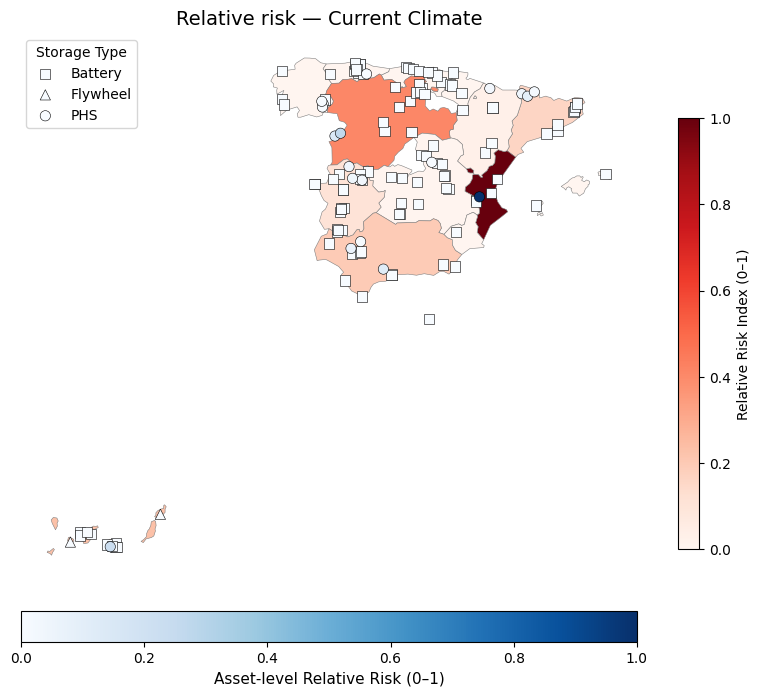

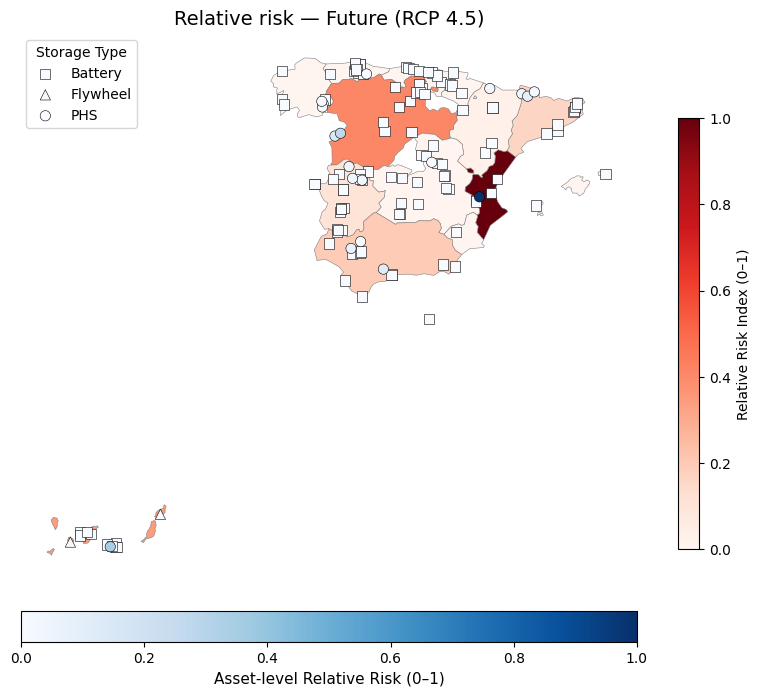

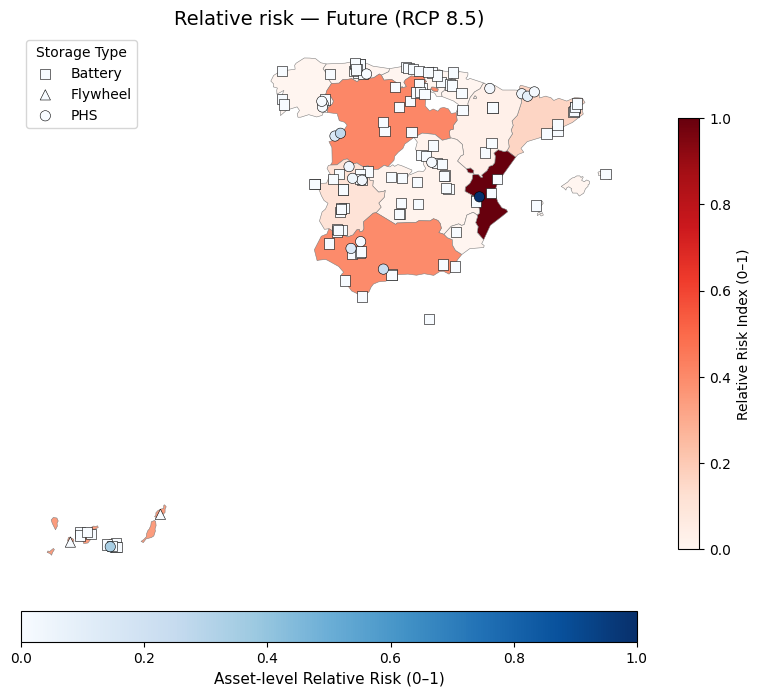

In [ ]:
#RELATIVE RISK
# =========================================================
# CONFIG
# =========================================================
REGION_COL = "Region"
ASSET_TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability precipitation"

HAZARDCURRENT_COL = "Precipitation 1991-2020 hazard strength"
HAZARD45_COL     = "Precipitation 2011-2040 hazard strength RCP4.5"
HAZARD85_COL     = "Precipitation 2011-2040 hazard strength RCP8.5"

# =========================================================
# 1. Choose exposure measure (MWh > MW > count)
# =========================================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZARDCURRENT_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZARD45_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZARD85_COL].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

region_risk = (
    data
    .groupby(REGION_COL)[
        ["Risk_current_abs", "Risk_45_abs", "Risk_85_abs"]
    ]
    .sum()
    .reset_index()
)

# =========================================================
# 3. Normalise regional risk (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

region_risk["Riskcurrent_region_rel"] = normalize(
    region_risk["Risk_current_abs"]
)
region_risk["Risk45_region_rel"] = normalize(
    region_risk["Risk_45_abs"]
)
region_risk["Risk85_region_rel"] = normalize(
    region_risk["Risk_85_abs"]
)

regions_risk_gdf = regions.merge(
    region_risk,
    left_on="NUTS_NAME",
    right_on=REGION_COL,
    how="left"
)

# =========================================================
# 4. Normalise asset-level risks (0–1)
# =========================================================
def normalize(s):
    vmin, vmax = s.min(), s.max()
    if vmax == vmin:
        return pd.Series(0, index=s.index)
    return (s - vmin) / (vmax - vmin)

data["Riskcurrent_rel"] = normalize(data["Risk_current_abs"])
data["Risk45_rel"]      = normalize(data["Risk_45_abs"])
data["Risk85_rel"]      = normalize(data["Risk_85_abs"])


# =========================================================
# 5. Create GeoDataFrame for assets
# =========================================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# =========================================================
# 7. MAP FUNCTION (consistent colorbars + separate point risk)
# =========================================================

def plot_risk_map(region_col, point_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # --- Background: REGION-LEVEL RELATIVE RISK ---
    regions_risk_gdf.plot(
        column=region_col,
        cmap="Reds",
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Relative Risk Index (0–1)",
            "shrink": 0.7
        }
    )

    # --- Points: ASSET-LEVEL RELATIVE RISK ---
    vals = points[point_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[point_col],
            cmap="Blues",
            norm=norm,
            marker=marker,
            s=55,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="Blues", norm=norm)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Asset-level Relative Risk (0–1)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 8. GENERATE MAPS
# =========================================================

# Current climate
fig_91, ax_91 = plot_risk_map(
    region_col="Riskcurrent_region_rel",
    point_col="Riskcurrent_rel",
    title="Relative risk — Current Climate"
)

# RCP4.5
fig_92, ax_92 = plot_risk_map(
    region_col="Risk45_region_rel",
    point_col="Risk45_rel",
    title="Relative risk — Future (RCP 4.5)"
)

# RCP8.5
fig_93, ax_93 = plot_risk_map(
    region_col="Risk85_region_rel",
    point_col="Risk85_rel",
    title="Relative risk — Future (RCP 8.5)"
)


In [ ]:
save_figure(fig_91, "Relative risk — Current Climate.jpg")
save_figure(fig_92, "Relative risk — Future (RCP4.5).jpg")
save_figure(fig_93, "Relative risk — Future (RCP8.5).jpg")

Saved: Relative risk — Current Climate.jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Relative risk — Future (RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

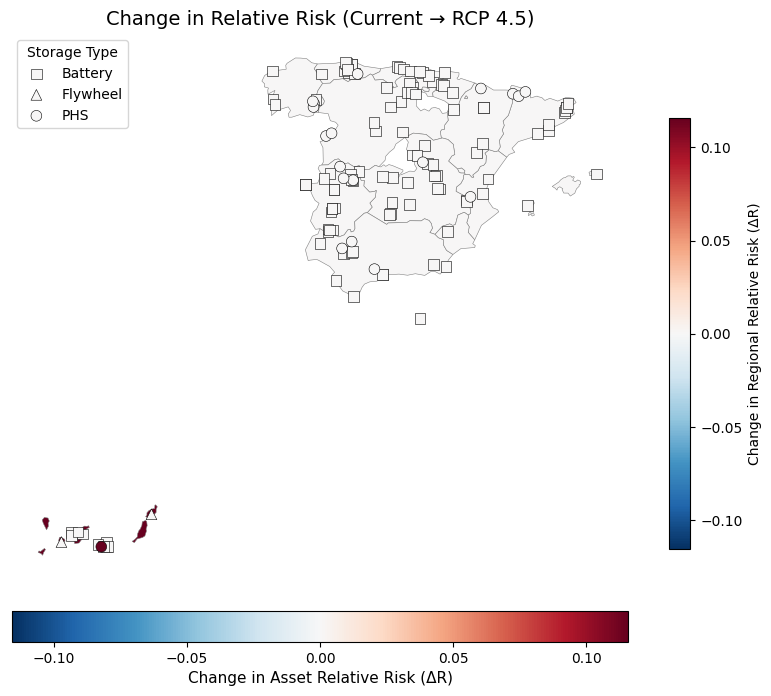

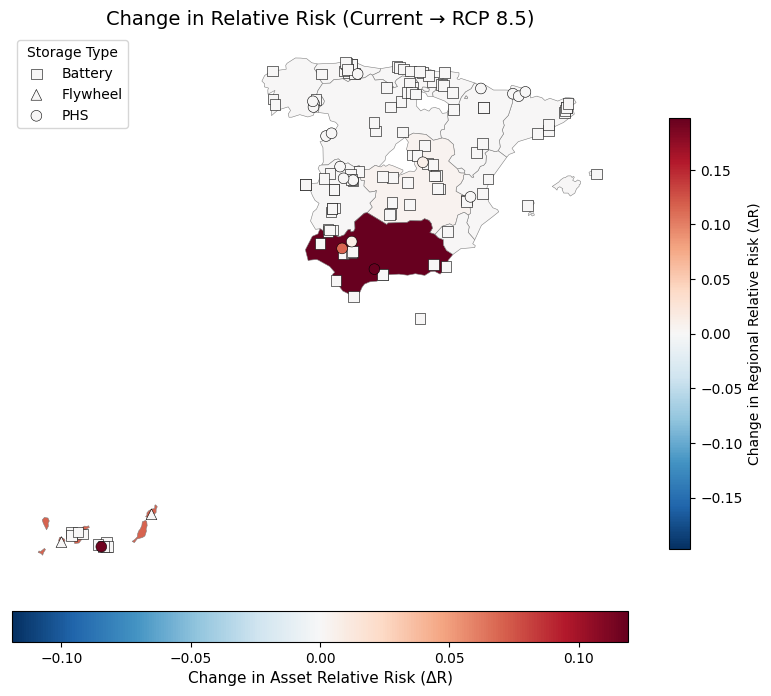

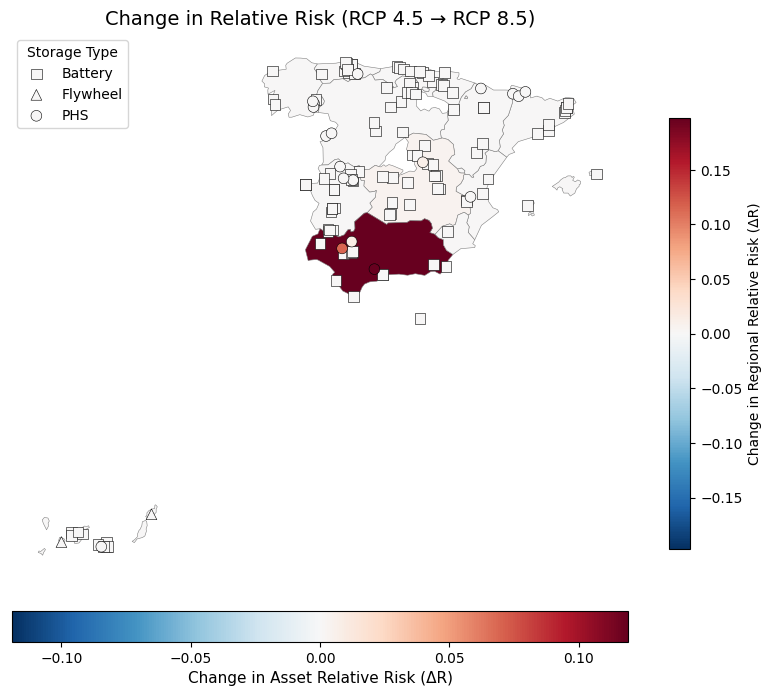

In [ ]:
#CHANGES IN RELATIVE RISK

# =========================================================
# 1. COMPUTE DIFFERENCES BETWEEN SCENARIOS
# =========================================================

points["Delta_current_45"] = points["Risk45_rel"] - points["Riskcurrent_rel"]
points["Delta_current_85"] = points["Risk85_rel"] - points["Riskcurrent_rel"]
points["Delta_45_85"]      = points["Risk85_rel"] - points["Risk45_rel"]

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
regions_risk_gdf["Delta_region_current_45"] = (
    regions_risk_gdf["Risk45_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_current_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Riskcurrent_region_rel"]
)

regions_risk_gdf["Delta_region_45_85"] = (
    regions_risk_gdf["Risk85_region_rel"]
    - regions_risk_gdf["Risk45_region_rel"]
)

# =========================================================
# 2. NEW PLOT FUNCTION FOR CHANGE MAPS
# =========================================================
def plot_change_map(region_delta_col, asset_delta_col, title):

    fig, ax = plt.subplots(figsize=(10, 8))

    # ---------------------------------------
    # BACKGROUND: REGION-LEVEL CHANGE
    vals_bg = regions_risk_gdf[region_delta_col].astype(float)
    absmax_bg = max(abs(vals_bg.min()), abs(vals_bg.max()))

    if absmax_bg == 0:
        norm_bg = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_bg = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_bg,
            vmax=absmax_bg
        )

    regions_risk_gdf.plot(
        column=region_delta_col,
        cmap="RdBu_r",
        norm=norm_bg,
        linewidth=0.4,
        edgecolor="grey",
        ax=ax,
        legend=True,
        legend_kwds={
            "label": "Change in Regional Relative Risk (ΔR)",
            "shrink": 0.7
        }
    )

    # ---------------------------------------
    # POINTS: ASSET-LEVEL CHANGE
    vals_pts = points[asset_delta_col].astype(float)
    absmax_pts = max(abs(vals_pts.min()), abs(vals_pts.max()))

    if absmax_pts == 0:
        norm_pts = mcolors.TwoSlopeNorm(vcenter=0, vmin=-0.01, vmax=0.01)
    else:
        norm_pts = mcolors.TwoSlopeNorm(
            vcenter=0,
            vmin=-absmax_pts,
            vmax=absmax_pts
        )

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o"}

    for stype, marker in markers.items():
        subset = points[points[ASSET_TYPE_COL] == stype]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[asset_delta_col],
            cmap="RdBu_r",
            norm=norm_pts,
            marker=marker,
            s=60,
            edgecolor="black",
            linewidth=0.4,
            zorder=5,
            label=stype
        )

    sm_pts = cm.ScalarMappable(cmap="RdBu_r", norm=norm_pts)
    fig.colorbar(
        sm_pts, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.05
    ).set_label("Change in Asset Relative Risk (ΔR)", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()

    return fig, ax

# =========================================================
# 3. PLOT CHANGE MAPS
# =========================================================
# Current → RCP4.5
fig_94, ax_94 = plot_change_map(
    region_delta_col="Delta_region_current_45",
    asset_delta_col="Delta_current_45",
    title="Change in Relative Risk (Current → RCP 4.5)"
)

# Current → RCP8.5
fig_95, ax_95 = plot_change_map(
    region_delta_col="Delta_region_current_85",
    asset_delta_col="Delta_current_85",
    title="Change in Relative Risk (Current → RCP 8.5)"
)

# RCP4.5 → RCP8.5
fig_96, ax_96 = plot_change_map(
    region_delta_col="Delta_region_45_85",
    asset_delta_col="Delta_45_85",
    title="Change in Relative Risk (RCP 4.5 → RCP 8.5)"
)


In [ ]:
save_figure(fig_94, "Change in Relative Risk (Current → RCP 4.5).jpg")
save_figure(fig_95, "Change in Relative Risk (Current → RCP8.5).jpg")
save_figure(fig_96, "Change in Relative Risk (RCP 4.5 → RCP8.5).jpg")

Saved: Change in Relative Risk (Current → RCP 4.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (Current → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved: Change in Relative Risk (RCP 4.5 → RCP8.5).jpg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# =========================================================
# REGIONAL RELATIVE RISK SUMMARY TABLE
# =========================================================

region_risk_table = (
    regions_risk_gdf[[
        "NUTS_NAME",

        # Absolute risk (diagnostic)
        "Risk_current_abs",
        "Risk_45_abs",
        "Risk_85_abs",

        # Relative risk (0–1)
        "Riskcurrent_region_rel",
        "Risk45_region_rel",
        "Risk85_region_rel",

        # Change in relative risk
        "Delta_region_current_45",
        "Delta_region_current_85",
        "Delta_region_45_85"
    ]]
    .rename(columns={
        "NUTS_NAME": "Region",
        "Riskcurrent_region_rel": "RelRisk_Current",
        "Risk45_region_rel": "RelRisk_RCP45",
        "Risk85_region_rel": "RelRisk_RCP85",
        "Delta_region_current_45": "ΔRelRisk_Current→45",
        "Delta_region_current_85": "ΔRelRisk_Current→85",
        "Delta_region_45_85": "ΔRelRisk_45→85"
    })
    .sort_values("RelRisk_Current", ascending=False)
    .reset_index(drop=True)
)

region_risk_table


,Region,Risk_current_abs,Risk_45_abs,Risk_85_abs,RelRisk_Current,RelRisk_RCP45,RelRisk_RCP85,ΔRelRisk_Current→45,ΔRelRisk_Current→85,ΔRelRisk_45→85
0,Comunitat Valenciana,181404.00,181404.00,181404.00,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
1,Castilla y León,74310.00,74310.00,74310.00,0.409638,0.409638,0.409638,0.000000,0.000000,0.000000
2,Canarias,42000.00,63000.00,63000.00,0.231527,0.347291,0.347291,0.115764,0.115764,0.000000
3,Andalucía,35798.40,35798.40,71596.80,0.197341,0.197341,0.394681,0.000000,0.197341,0.197341
4,Cataluña,29220.00,29220.00,29220.00,0.161077,0.161077,0.161077,0.000000,0.000000,0.000000
5,Extremadura,19453.44,19453.44,19453.44,0.107238,0.107238,0.107238,0.000000,0.000000,0.000000
6,Aragón,5310.00,5310.00,5310.00,0.029272,0.029272,0.029272,0.000000,0.000000,0.000000
7,Castilla-La Mancha,1320.00,1320.00,2640.00,0.007277,0.007277,0.014553,0.000000,0.007277,0.007277
8,Comunidad Foral de Navarra,0.00,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,País Vasco,0.00,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


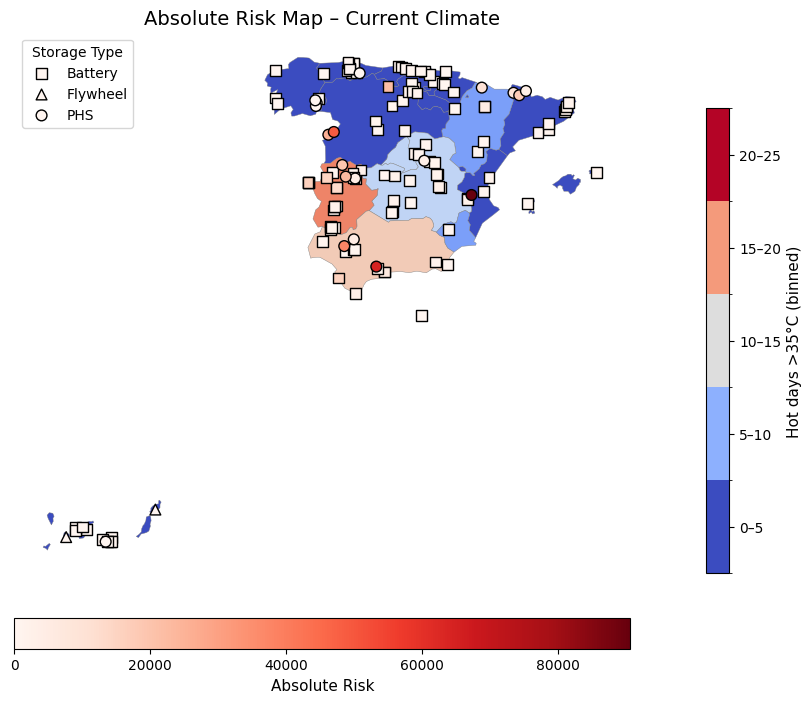

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


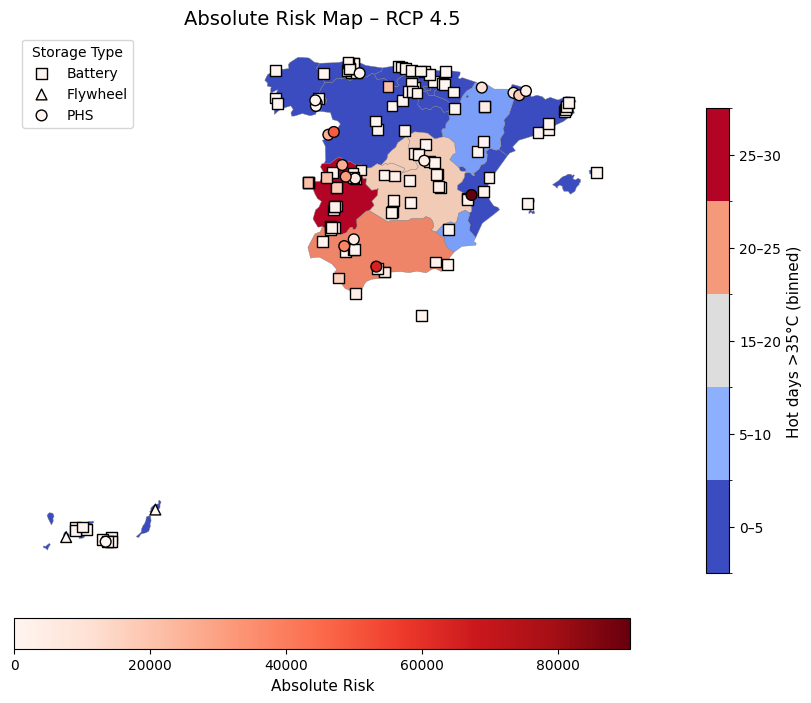

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


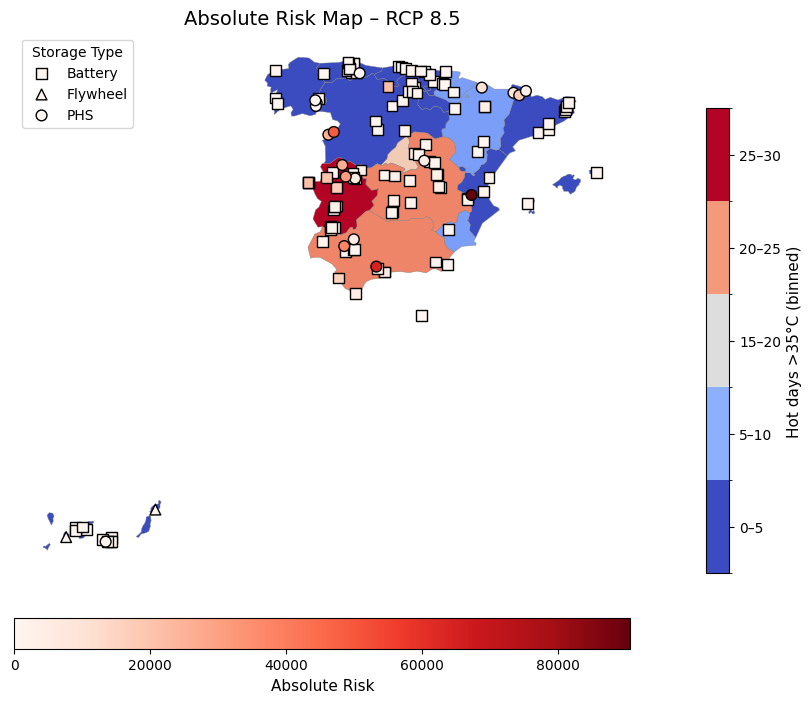

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


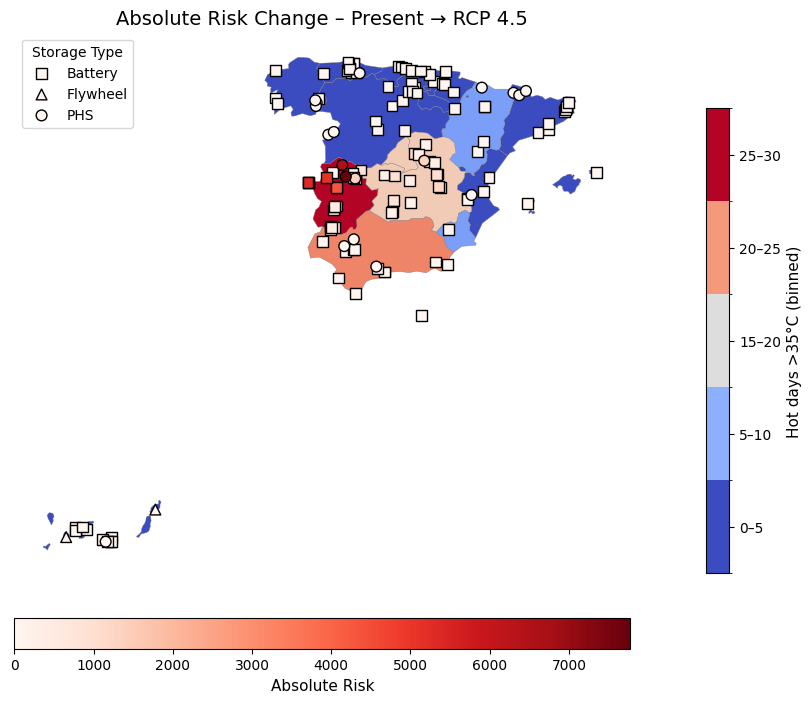

/tmp/ipython-input-3213769132.py:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bg = cm.get_cmap("coolwarm", len(categories))


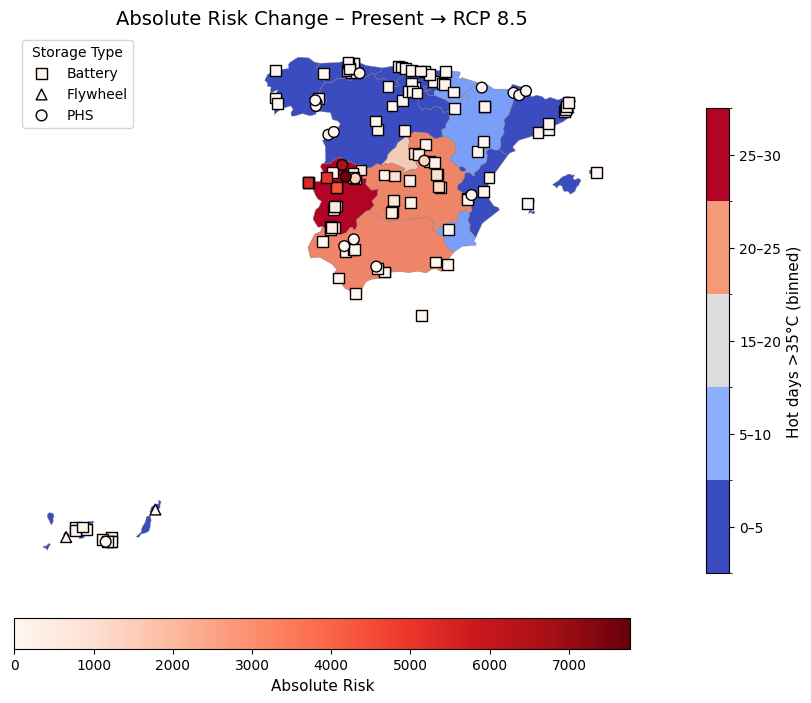

In [ ]:
#ABSOLUTE RISK MAPS
# ============================================
# CONFIG
# ============================================
REGION_COL = "Region"
TYPE_COL = "Storage type"
CAPACITY_COL = "Capacity (MWh)"
POWER_COL = "Power (MW)"
IMPORTANCE_COL = "Importance score"
VULN_COL = "Vulnerability hot days >35C"

HAZ_CUR = "Hot days >35C 1991-2020 hazard strength"
HAZ_45 = "Hot days >35C 2011-2040 hazard strength RCP4.5"
HAZ_85 = "Hot days >35C 2011-2040 hazard strength RCP8.5"

HOT_CUR = "Hot days >35C 1991-2020"
HOT_45 = "Hot days >35C 2011-2040 RCP4.5"
HOT_85 = "Hot days >35C 2011-2040 RCP8.5"

# =========================================================
# REGION-LEVEL BACKGROUND
# =========================================================
# 1. Bin function

bins = [0, 5, 10, 15, 20, 25, 30]
labels = ["0–5", "5–10", "10–15", "15–20", "20–25", "25–30"]

def apply_fixed_bins(df, col):
    df[col + "_binned"] = pd.cut(
        df[col],
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )
    return df

#Create region background from regions

regions_bg = regions.copy()

# Map current and future hot days data to regions_bg
regions_bg[HOTDAYSCURRENT_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_present_dict
)
regions_bg[HOTDAYS45_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future45_dict
)
regions_bg[HOTDAYS85_COL] = regions_bg["NUTS_NAME"].map(
    hot_days_35_future85_dict
)

#Apply binning to ALL regions
regions_bg = apply_fixed_bins(regions_bg, HOTDAYSCURRENT_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS45_COL)
regions_bg = apply_fixed_bins(regions_bg, HOTDAYS85_COL)

# ============================================
# 1. EXPOSURE SELECTION (MWh > MW > 1)
# ============================================
def choose_exposure(row):
    if pd.notna(row.get(CAPACITY_COL)):
        return float(row[CAPACITY_COL])
    if pd.notna(row.get(POWER_COL)):
        return float(row[POWER_COL])
    return 1.0

data["Exposure"] = data.apply(choose_exposure, axis=1)

# ============================================
# 2. ABSOLUTE RISK CALCULATION
# ============================================
# Risk = Hazard × Vulnerability × Exposure × Importance

data["Risk_current_abs"] = (
    data[HAZ_CUR].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_45_abs"] = (
    data[HAZ_45].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

data["Risk_85_abs"] = (
    data[HAZ_85].astype(float)
    * data[VULN_COL].astype(float)
    * data["Exposure"].astype(float)
    * data[IMPORTANCE_COL].astype(float)
)

# ============================================
# 3. ABSOLUTE RISK CHANGE
# ============================================
data["Risk_change_45"] = data["Risk_45_abs"] - data["Risk_current_abs"]
data["Risk_change_85"] = data["Risk_85_abs"] - data["Risk_current_abs"]

# ============================================
# 4. Create GeoDataFrame for POINTS
# ============================================
points = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data["lon"], data["lat"]),
    crs="EPSG:4326"
)

# ============================================
# 5. BINNING HOT DAYS (for consistent background)
# ============================================
def bin_hot_days(df, col):
    bins = [0, 5, 10, 15, 20, 25, 30, np.inf]
    labels = ["0–4", "5–9", "10–14", "15–19", "20–24", "25–29", "30+"]
    df[col + "_binned"] = pd.cut(df[col], bins=bins, labels=labels, right=False)
    return df

for col in [HOT_CUR, HOT_45, HOT_85]:
    data = bin_hot_days(data, col)

# ============================================
# 6. PLOTTING FUNCTION FOR ABSOLUTE RISK MAPS
# ============================================
def plot_absolute_risk(bg_col, risk_col, title):
    fig, ax = plt.subplots(figsize=(10, 8))

    # ---- Background map using HOT-DAY bins ----
    background = regions_bg

    background.plot(
        column=bg_col + "_binned",
        cmap="coolwarm",
        linewidth=0.3,
        edgecolor="grey",
        ax=ax,
        legend=False
    )

    # Custom legend for background bins
    categories = regions_bg[bg_col + "_binned"].dropna().unique().tolist()
    categories.sort(key=lambda c: float(c.split("–")[0]) if "–" in c else 99)
    cmap_bg = cm.get_cmap("coolwarm", len(categories))
    sm_bg = cm.ScalarMappable(
        cmap=cmap_bg,
        norm=mcolors.BoundaryNorm(range(len(categories)+1), cmap_bg.N)
    )
    cbar1 = fig.colorbar(sm_bg, ax=ax, fraction=0.03, pad=0.02, shrink=0.8)
    cbar1.set_ticks(np.arange(len(categories)) + 0.5)
    cbar1.set_ticklabels(categories)
    cbar1.set_label("Hot days >35°C (binned)", fontsize=11)

    # ---- Storage projects ----
    vals = points[risk_col].astype(float)
    norm = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())

    markers = {"Battery": "s", "Flywheel": "^", "PHS": "o",}

    for t, marker in markers.items():
        subset = points[points[TYPE_COL] == t]
        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            c=subset[risk_col],
            cmap="Reds",
            norm=norm,
            marker=marker,
            s=60,
            edgecolor="black",
            zorder=5,
            label=t
        )

    sm_risk = cm.ScalarMappable(norm=norm, cmap="Reds")
    cbar2 = fig.colorbar(
        sm_risk, ax=ax, orientation="horizontal",
        fraction=0.05, pad=0.07
    )
    cbar2.set_label("Absolute Risk", fontsize=11)

    plt.title(title, fontsize=14)
    plt.legend(title="Storage Type")
    plt.axis("off")
    plt.show()


# ============================================
# 7. PLOT ABSOLUTE RISK MAPS
# ============================================

# ---- CURRENT ----
plot_absolute_risk(
    bg_col=HOT_CUR,
    risk_col="Risk_current_abs",
    title="Absolute Risk Map – Current Climate"
)

# ---- RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_45_abs",
    title="Absolute Risk Map – RCP 4.5"
)

# ---- RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_85_abs",
    title="Absolute Risk Map – RCP 8.5"
)

# ============================================
# 8. MAP RISK CHANGES
# ============================================

# ---- Change Present → RCP 4.5 ----
plot_absolute_risk(
    bg_col=HOT_45,
    risk_col="Risk_change_45",
    title="Absolute Risk Change – Present → RCP 4.5"
)

# ---- Change Present → RCP 8.5 ----
plot_absolute_risk(
    bg_col=HOT_85,
    risk_col="Risk_change_85",
    title="Absolute Risk Change – Present → RCP 8.5"
)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

data


,StorageID,Coordinates,Storage type,Region,Status,Power (MW),Capacity (MWh),Duration (hours),Importance score,lat,lon,Precipitation 1991-2020,Precipitation 1991-2020 hazard strength,Vulnerability precipitation,Precipitation change RCP4.5,Precipitation change RCP8.5,Precipitation 2011-2040 RCP4.5,Precipitation 2011-2040 hazard strength RCP4.5,Precipitation 2011-2040 RCP8.5,Precipitation 2011-2040 hazard strength RCP8.5,VulnHazard_current,Exposure,Risk_current_abs,Risk_45_abs,Risk_85_abs,Riskcurrent_rel,Risk45_rel,Risk85_rel
0,Malpica Wind plus hybrid storage,"43.320000 , -8.810000",Battery,Galicia,Announced,7.75,15.50,2.00,2,43.320000,-8.810000,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,15.50,0.00,0.00,0.00,0.000000,0.000000,0.000000
1,BESS Sanxenxo,"42.409945, -8.808338",Battery,Galicia,Announced,5.00,20.00,4.00,2,42.409945,-8.808338,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,20.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
2,Santiago-Jares,"42.390000 , -7.090000",Battery,Galicia,Operational,5.00,5.00,1.00,2,42.390000,-7.090000,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,5.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
3,Conso,"42.250000 , -7.160000",PHS,Galicia,Operational,270.00,2280.00,8.44,3,42.250000,-7.160000,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,2280.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
4,Soutelo PSP,"42.150000 , -7.190000",PHS,Galicia,Operational,215.00,NaN,NaN,3,42.150000,-7.190000,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,215.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
5,Puente Bibey,"42.334200, -7.215200",PHS,Galicia,Operational,263.00,NaN,NaN,3,42.334200,-7.215200,1290.50,0,2,-0.72,-2.99,1265.69,0,1232.80,0,0.0,263.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
6,BESS Troncal (Vigo),"42.23282, -8.72264",Battery,Galicia,Announced,5.50,11.00,NaN,2,42.232820,-8.722640,1290.50,0,0,-0.72,-2.99,1265.69,0,1232.80,0,0.0,11.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
7,ST Grandas de Salime,"43.220000 , -6.880000",Battery,Principado de Asturias,Announced,200.00,800.00,4.00,2,43.220000,-6.880000,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,800.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
8,BESS MIERES,"43.250000 , -5.780000",Battery,Principado de Asturias,Announced,12.00,46.00,4.10,2,43.250000,-5.780000,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,46.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
9,Raitan ST1,"43.313387 , -5.941920",Battery,Principado de Asturias,Announced,15.00,60.00,4.00,2,43.313387,-5.941920,1300.64,0,0,0.75,-1.78,1277.94,0,1245.74,0,0.0,60.00,0.00,0.00,0.00,0.000000,0.000000,0.000000
